In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import tol_colors
mpl.rcParams['figure.dpi'] = 300

In [4]:
def normalize(arr):
    norm_arr = []
    minimum = np.nanmin(arr)
    maximum = np.nanmax(arr)
    diff_arr = maximum - minimum   
    for i in arr:
        temp = (i - minimum)/(maximum-minimum)
        norm_arr.append(temp)
    return norm_arr

c=2.99e5
lamb0 = 396.847
lamb1 = 397.01
mu = 0.4760111410077789
mu2 = 0.4266927415494022

def veltrans(x):
    return ((((x+lamb0)/lamb0)-1)*c)/mu

def veltrans2(x):
    return ((((x+lamb0)/lamb0)-1)*c)/mu2

def wltrans(x):
    return ((((x/c)+1)*lamb0)-lamb0)

def gaussian(x, c1, mu1, sigma1):
    res = c1 * np.exp( - (x - mu1)**2.0 / (2.0 * sigma1**2.0) )
    return res

def gaussfit(params,selwl,sel):
    fit = gaussian( selwl, params )
    return (fit - sel)

def double_gaussian( x, c1, mu1, sigma1, c2, mu2, sigma2 ):
    res =   (c1 * np.exp( - (x - mu1)**2.0 / (2.0 * sigma1**2.0) )) \
          + (c2 * np.exp( - (x - mu2)**2.0 / (2.0 * sigma2**2.0) ))
    return res

In [5]:
# testing H-epsilon response to electron beam flux this time around

In [6]:
test = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_25s_30_30broadc_7vt.npz'

subbed = '/Users/coletamburri/Desktop/subbed.npz'

mod84_5vt_50g_21s_H20 = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_21s_84_50broadc_5vt.npz'
mod30_5vt_50g_45s_H20 = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_45s_30_50broadc_5vt_H20.npz'

mod30_5vt_50g_21s_H20 = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_21s_30_50broadc_5vt_H20.npz'
mod30_5vt_1g_21s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_21s_30_1broadc_5vt.npz'
mod30_5vt_30g_21s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_21s_30_30broadc_5vt.npz'
mod30_5vt_50g_21s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_21s_30_50broadc_5vt.npz'
mod30_5vt_100g_21s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_21s_30_100broadc_5vt.npz'

mod30_2vt_50g_21s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_21s_30_50broadc_2vt.npz'
mod30_5vt_50g_21s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_21s_30_50broadc_5vt.npz'
mod30_7vt_50g_21s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_21s_30_50broadc_7vt.npz'
mod30_10vt_50g_21s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_21s_30_50broadc_10vt.npz'

mod30_7vt_50g_1s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_1s_30_50broadc_7vt.npz'
mod30_7vt_50g_5s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_5s_30_50broadc_7vt.npz'
mod30_7vt_50g_7s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_7s_30_50broadc_7vt.npz'
mod30_7vt_50g_17s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_17s_30_50broadc_7vt.npz'
mod30_7vt_50g_19s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_19s_30_50broadc_7vt.npz'
mod30_7vt_50g_21s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_21s_30_50broadc_7vt.npz'
mod30_7vt_50g_25s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_25s_30_50broadc_7vt.npz'
mod30_7vt_50g_30s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_30s_30_50broadc_7vt.npz'
mod30_7vt_50g_35s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_35s_30_50broadc_7vt.npz'

mod30_5vt_50g_1s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_1s_30_50broadc_5vt.npz'
mod30_5vt_50g_5s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_5s_30_50broadc_5vt.npz'
mod30_5vt_50g_7s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_7s_30_50broadc_5vt.npz'
mod30_5vt_50g_17s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_17s_30_50broadc_5vt.npz'
mod30_5vt_50g_19s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_19s_30_50broadc_5vt.npz'
mod30_5vt_50g_21s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_21s_30_50broadc_5vt.npz'
mod30_5vt_50g_25s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_25s_30_50broadc_5vt.npz'
mod30_5vt_50g_30s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_30s_30_50broadc_5vt.npz'
mod30_5vt_50g_35s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_35s_30_50broadc_5vt.npz'

mod30_2vt_50g_1s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_1s_30_50broadc_2vt.npz'
mod30_2vt_50g_3s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_3s_30_50broadc_2vt.npz'
mod30_2vt_50g_5s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_5s_30_50broadc_2vt.npz'
mod30_2vt_50g_7s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_7s_30_50broadc_2vt.npz'
mod30_2vt_50g_9s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_9s_30_50broadc_2vt.npz'
mod30_2vt_50g_11s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_11s_30_50broadc_2vt.npz'
mod30_2vt_50g_15s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_15s_30_50broadc_2vt.npz'
mod30_2vt_50g_17s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_17s_30_50broadc_2vt.npz'
mod30_2vt_50g_19s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_19s_30_50broadc_2vt.npz'
mod30_2vt_50g_21s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_21s_30_50broadc_2vt.npz'
mod30_2vt_50g_25s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_25s_30_50broadc_2vt.npz'
mod30_2vt_50g_30s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_30s_30_50broadc_2vt.npz'
mod30_2vt_50g_35s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_35s_30_50broadc_2vt.npz'

longduration = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/cat_15_8_5e10_20_600_500.npz'


filename_mod30_H6_2vt = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_21s_30_50broadc.npz'
filename_mod30_H6_5vt = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_21s_30_50broadc_5vt.npz'
filename_mod30_H6_7vt = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_21s_30_50broadc_7vt.npz'
filename_mod30_H6_10vt = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_21s_30_50broadc_10vt.npz'

filename_mod30_H6_2vt_30broadc = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_21s_30_lowerbroadc.npz'
filename_mod30_H6_2vt_50broadc = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_21s_30_50broadc.npz'
filename_mod30_H6_2vt_100broadc = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_21s_30_midbroadc.npz'
filename_mod30_H6_2vt_300broadc = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_21s_30.npz'

filename_mod30_H6_7vt_50broadc_10s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_10s_30_50broadc_7vt.npz'

filename_mod30_H20_7vt_50broadc_21s = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_21s_30_50broadc_7vt_H20_testunits.npz'

#filename_rh2 = '/Users/coletamburri/Desktop/mod21_ray2_100gstark_1e11_del8_vturb2.npz'
filename_rh3 = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/mod25_hep.npz' #delta = 3, E_c = 15 keV, E_t = 3e11
filename_rh4 = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/mod31_hep.npz' #delta = 3, E_c = 15 keV, E_t = 1e12
filename_rh5 = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/mod79_hep.npz' #delta = 3, E_c = 15 keV, E_t = 3e10
filename_rh6 = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/mod19_hep.npz' #delta = 3, E_c = 15 keV, E_t = 1e11

#filename_rh2 = '/Users/coletamburri/Desktop/mod21_ray2_100gstark_1e11_del8_vturb2.npz'
filename_rh3 = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/mod25_ray2_10gstark_3e11_del3_vturb2.npz'
filename_rh4 = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/mod31_ray2_10gstark_1e12_del3_vturb2.npz'
filename_rh5 = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/mod79_ray2_10gstark_3e10_del3_vturb2.npz'
filename_rh6 = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/mod19_ray2_10gstark_1e11_del3_vturb2.npz'

filename_rh7 = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_24s_84_10b_2vt.npz'
filename_rh8 = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_24s_84_10b_10vt.npz'
filename_rh9 = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_24s_84_10b_20vt.npz'
filename_rh10 = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_24s_84_1b_2vt.npz'
filename_rh11 = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_24s_84_100b_2vt.npz'
filename_rh12 = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_24s_84_100b_2vt_altmult.npz'
filename_rh13 = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_24s_84_1000b_2vt.npz'
filename_rh14 = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_24s_84_300b_2vt.npz'
filename_rh15 = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_24s_84_300b_10vt.npz'
filename_rh16 = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_24s_84_300b_7vt.npz'

filename_rh17 = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_30s_84_300b_7vt.npz'
filename_rh18 = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_35s_84_300b_7vt.npz'
filename_rh19 = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_40s_84_300b_7vt.npz'

filename_rhtest = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_24s_84_200b_5vt.npz'
filename_dkist = '/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/dkist_obs_file.npz'
filename_dkist_aug2024 = '/Users/coletamburri/Desktop/8Aug2024C-class.npz'

In [7]:
plt.plot(mod30_5vt_50gs_45s_H20['wl_rh'],mod30_5vt_50gs_45s_H20['int_rh'])

TypeError: string indices must be integers, not 'str'

In [9]:
longdurfile = np.load(longduration)

mod30_5vt_50gs_45s_H20 = np.load(mod30_5vt_50g_45s_H20)

mod30_5vt_H20 = np.load(mod30_5vt_50g_21s_H20)

mod84_5vt_H20 = np.load(mod84_5vt_50g_21s_H20)

mod30_2vt = np.load(mod30_2vt_50g_21s)
mod30_5vt = np.load(mod30_5vt_50g_21s)
mod30_7vt = np.load(mod30_7vt_50g_21s)
mod30_10vt = np.load(mod30_10vt_50g_21s)

mod30_1gs = np.load(mod30_5vt_1g_21s)
mod30_30gs = np.load(mod30_5vt_30g_21s)
mod30_50gs = np.load(mod30_5vt_50g_21s)
mod30_100gs = np.load(mod30_5vt_100g_21s)

mod30_1s = np.load(mod30_5vt_50g_1s)
mod30_5s = np.load(mod30_5vt_50g_5s)
mod30_7s = np.load(mod30_5vt_50g_7s)
mod30_17s = np.load(mod30_5vt_50g_17s)
mod30_19s = np.load(mod30_5vt_50g_19s)
mod30_21s = np.load(mod30_5vt_50g_21s)
mod30_25s = np.load(mod30_5vt_50g_25s)
mod30_30s = np.load(mod30_5vt_50g_30s)
mod30_35s = np.load(mod30_5vt_50g_35s)

mod30_1s_2vt = np.load(mod30_2vt_50g_1s)
mod30_3s_2vt = np.load(mod30_2vt_50g_3s)
mod30_5s_2vt = np.load(mod30_2vt_50g_5s)
mod30_7s_2vt = np.load(mod30_2vt_50g_7s)
mod30_9s_2vt = np.load(mod30_2vt_50g_9s)
mod30_11s_2vt = np.load(mod30_2vt_50g_11s)
mod30_15s_2vt = np.load(mod30_2vt_50g_15s)
mod30_17s_2vt = np.load(mod30_2vt_50g_17s)
mod30_19s_2vt = np.load(mod30_2vt_50g_19s)
mod30_21s_2vt = np.load(mod30_2vt_50g_21s)
mod30_25s_2vt = np.load(mod30_2vt_50g_25s)
mod30_30s_2vt = np.load(mod30_2vt_50g_30s)
mod30_35s_2vt = np.load(mod30_2vt_50g_35s)


rh_mod30_2vt = np.load(filename_mod30_H6_2vt)
rh_mod30_5vt = np.load(filename_mod30_H6_5vt)
rh_mod30_7vt = np.load(filename_mod30_H6_7vt)
rh_mod30_10vt = np.load(filename_mod30_H6_10vt)

rh_mod30_2vt_30broadc = np.load(filename_mod30_H6_2vt_30broadc)
rh_mod30_2vt_50broadc = np.load(filename_mod30_H6_2vt_50broadc)
rh_mod30_2vt_100broadc = np.load(filename_mod30_H6_2vt_100broadc)
rh_mod30_2vt_300broadc = np.load(filename_mod30_H6_2vt_300broadc)

rh_mod30_7vt_50broadc_10s = np.load(filename_mod30_H6_7vt_50broadc_10s)

rh_mod30_7vt_50broadc_21s_H20 = np.load(filename_mod30_H20_7vt_50broadc_21s)

rh_file3 = np.load(filename_rh3)
rh_file4 = np.load(filename_rh4)
rh_file5 = np.load(filename_rh5)
rh_file6 = np.load(filename_rh6)

rh_file7 = np.load(filename_rh7)
rh_file8 = np.load(filename_rh8)
rh_file9 = np.load(filename_rh9)
rh_file10 = np.load(filename_rh10)
rh_file11 = np.load(filename_rh11)
rh_file12 = np.load(filename_rh12)
rh_file13 = np.load(filename_rh13)
rh_file14 = np.load(filename_rh14)
rh_file15 = np.load(filename_rh15)
rh_file16 = np.load(filename_rh16)
rh_file17 = np.load(filename_rh17)
rh_file18 = np.load(filename_rh18)
rh_file19 = np.load(filename_rh19)
dkist_file = np.load(filename_dkist)
#dkist_file = np.load(subbed)
#dkist_file24 = np.load(filename_dkist_aug2024)

rh_filetest = np.load(test)

In [ ]:
dkist_file.files

In [ ]:
np.shape(dkist_file['arr_0'])

In [42]:
# index of kernel center for first frame (from "maxindices")
maxind = dkist_file['arr_3'][0]

In [94]:
caiih_inds = np.where((rh_file7['wl_rh']>396.7) & (rh_file7['wl_rh']< 397.94))
hep_inds = np.where((rh_file3['wl_rh']>396.95) & (rh_file3['wl_rh']< 397.07))

both_inds = np.where((rh_file3['wl_rh']>396.7) & (rh_file3['wl_rh']< 397.07))
h20caiih_inds = np.where((rh_mod30_7vt_50broadc_21s_H20['wl_rh']>396.7) & (rh_mod30_7vt_50broadc_21s_H20['wl_rh']<397.94))

dkist_wl = dkist_file['arr_2']
dkist_int = dkist_file['arr_0'][0,:,maxind] #before background subtraction
dkist_int_trail = dkist_file['arr_0'][0,:,maxind+120]
dkist_int_front = dkist_file['arr_0'][0,:,maxind-100]


dkist_wl24 = dkist_file24['arr_0']
dkist_int24 = dkist_file24['arr_1'][208,:,1352] #after background subtraction



rh_wl3 = rh_file3['wl_rh'][caiih_inds]
rh_int3 = rh_file3['int_rh'][caiih_inds]
rh_wl_shift3 = rh_wl3-lamb0
rh_wl_shift3_hep = rh_wl3-lamb1

rh_wl4 = rh_file4['wl_rh'][caiih_inds]
rh_int4 = rh_file4['int_rh'][caiih_inds]
rh_wl_shift4 = rh_wl4-lamb0
rh_wl_shift4_hep = rh_wl4-lamb1

rh_wl5 = rh_file5['wl_rh'][caiih_inds]
rh_int5 = rh_file5['int_rh'][caiih_inds]
rh_wl_shift5 = rh_wl5-lamb0
rh_wl_shift5_hep = rh_wl5-lamb1

rh_wl6 = rh_file6['wl_rh'][caiih_inds]
rh_int6 = rh_file6['int_rh'][caiih_inds]
rh_wl_shift6 = rh_wl6-lamb0
rh_wl_shift6_hep = rh_wl6-lamb1



mod30_1s_wl = mod30_1s['wl_rh'][caiih_inds]
mod30_1s_int = mod30_1s['int_rh'][caiih_inds]
mod30_1s_wlshift = mod30_1s_wl-lamb0
mod30_1s_wlshift_hep = mod30_1s_wl-lamb1

mod30_5s_wl = mod30_5s['wl_rh'][caiih_inds]
mod30_5s_int = mod30_5s['int_rh'][caiih_inds]
mod30_5s_wlshift = mod30_5s_wl-lamb0
mod30_5s_wlshift_hep = mod30_5s_wl-lamb1

mod30_7s_wl = mod30_7s['wl_rh'][caiih_inds]
mod30_7s_int = mod30_7s['int_rh'][caiih_inds]
mod30_7s_wlshift = mod30_7s_wl-lamb0
mod30_7s_wlshift_hep = mod30_7s_wl-lamb1

mod30_17s_wl = mod30_17s['wl_rh'][caiih_inds]
mod30_17s_int = mod30_17s['int_rh'][caiih_inds]
mod30_17s_wlshift = mod30_17s_wl-lamb0
mod30_17s_wlshift_hep = mod30_17s_wl-lamb1

mod30_19s_wl = mod30_19s['wl_rh'][caiih_inds]
mod30_19s_int = mod30_19s['int_rh'][caiih_inds]
mod30_19s_wlshift = mod30_19s_wl-lamb0
mod30_19s_wlshift_hep = mod30_19s_wl-lamb1

mod30_21s_wl = mod30_21s['wl_rh'][caiih_inds]
mod30_21s_int = mod30_21s['int_rh'][caiih_inds]
mod30_21s_wlshift = mod30_21s_wl-lamb0
mod30_21s_wlshift_hep = mod30_21s_wl-lamb1


mod30_25s_wl = mod30_25s['wl_rh'][caiih_inds]
mod30_25s_int = mod30_25s['int_rh'][caiih_inds]
mod30_25s_wlshift = mod30_25s_wl-lamb0
mod30_25s_wlshift_hep = mod30_25s_wl-lamb1


mod30_30s_wl = mod30_30s['wl_rh'][caiih_inds]
mod30_30s_int = mod30_30s['int_rh'][caiih_inds]
mod30_30s_wlshift = mod30_30s_wl-lamb0
mod30_30s_wlshift_hep = mod30_30s_wl-lamb1


mod30_35s_wl = mod30_35s['wl_rh'][caiih_inds]
mod30_35s_int = mod30_35s['int_rh'][caiih_inds]
mod30_35s_wlshift = mod30_35s_wl-lamb0
mod30_35s_wlshift_hep = mod30_35s_wl-lamb1

mod30_45s_wl_H20 = mod30_5vt_50gs_45s_H20['wl_rh'][h20caiih_inds]
mod30_45s_int_H20 = mod30_5vt_50gs_45s_H20['int_rh'][h20caiih_inds]
mod30_45s_wlshift_H20 = mod30_45s_wl_H20-lamb0
mod30_45s_wlshift_hep_H20 = mod30_45s_wl_H20-lamb1

mod30_1s_wl_2vt = mod30_1s_2vt['wl_rh'][caiih_inds]
mod30_1s_int_2vt = mod30_1s_2vt['int_rh'][caiih_inds]
mod30_1s_wlshift_2vt = mod30_1s_wl_2vt-lamb0
mod30_1s_wlshift_hep_2vt = mod30_1s_wl_2vt-lamb1

mod30_3s_wl_2vt = mod30_3s_2vt['wl_rh'][caiih_inds]
mod30_3s_int_2vt = mod30_3s_2vt['int_rh'][caiih_inds]
mod30_3s_wlshift_2vt = mod30_3s_wl_2vt-lamb0
mod30_3s_wlshift_hep_2vt = mod30_3s_wl_2vt-lamb1

mod30_5s_wl_2vt = mod30_5s_2vt['wl_rh'][caiih_inds]
mod30_5s_int_2vt = mod30_5s_2vt['int_rh'][caiih_inds]
mod30_5s_wlshift_2vt = mod30_5s_wl_2vt-lamb0
mod30_5s_wlshift_hep_2vt = mod30_5s_wl_2vt-lamb1

mod30_7s_wl_2vt = mod30_7s_2vt['wl_rh'][caiih_inds]
mod30_7s_int_2vt = mod30_7s_2vt['int_rh'][caiih_inds]
mod30_7s_wlshift_2vt = mod30_7s_wl_2vt-lamb0
mod30_7s_wlshift_hep_2vt = mod30_7s_wl_2vt-lamb1

mod30_9s_wl_2vt = mod30_9s_2vt['wl_rh'][caiih_inds]
mod30_9s_int_2vt = mod30_9s_2vt['int_rh'][caiih_inds]
mod30_9s_wlshift_2vt = mod30_9s_wl_2vt-lamb0
mod30_9s_wlshift_hep_2vt = mod30_9s_wl_2vt-lamb1

mod30_11s_wl_2vt = mod30_11s_2vt['wl_rh'][caiih_inds]
mod30_11s_int_2vt = mod30_11s_2vt['int_rh'][caiih_inds]
mod30_11s_wlshift_2vt = mod30_11s_wl_2vt-lamb0
mod30_11s_wlshift_hep_2vt = mod30_11s_wl_2vt-lamb1

mod30_15s_wl_2vt = mod30_15s_2vt['wl_rh'][caiih_inds]
mod30_15s_int_2vt = mod30_15s_2vt['int_rh'][caiih_inds]
mod30_15s_wlshift_2vt = mod30_15s_wl_2vt-lamb0
mod30_15s_wlshift_hep_2vt = mod30_15s_wl_2vt-lamb1

mod30_17s_wl_2vt = mod30_17s_2vt['wl_rh'][caiih_inds]
mod30_17s_int_2vt = mod30_17s_2vt['int_rh'][caiih_inds]
mod30_17s_wlshift_2vt = mod30_17s_wl_2vt-lamb0
mod30_17s_wlshift_hep_2vt = mod30_17s_wl_2vt-lamb1

mod30_19s_wl_2vt = mod30_19s_2vt['wl_rh'][caiih_inds]
mod30_19s_int_2vt = mod30_19s_2vt['int_rh'][caiih_inds]
mod30_19s_wlshift_2vt = mod30_19s_wl_2vt-lamb0
mod30_19s_wlshift_hep_2vt = mod30_19s_wl_2vt-lamb1

mod30_21s_wl_2vt = mod30_21s_2vt['wl_rh'][caiih_inds]
mod30_21s_int_2vt = mod30_21s_2vt['int_rh'][caiih_inds]
mod30_21s_wlshift_2vt = mod30_21s_wl_2vt-lamb0
mod30_21s_wlshift_hep_2vt = mod30_21s_wl_2vt-lamb1


mod30_25s_wl_2vt = mod30_25s_2vt['wl_rh'][caiih_inds]
mod30_25s_int_2vt = mod30_25s_2vt['int_rh'][caiih_inds]
mod30_25s_wlshift_2vt = mod30_25s_wl_2vt-lamb0
mod30_25s_wlshift_hep_2vt = mod30_25s_wl_2vt-lamb1


mod30_30s_wl_2vt = mod30_30s_2vt['wl_rh'][caiih_inds]
mod30_30s_int_2vt = mod30_30s_2vt['int_rh'][caiih_inds]
mod30_30s_wlshift_2vt = mod30_30s_wl_2vt-lamb0
mod30_30s_wlshift_hep_2vt = mod30_30s_wl_2vt-lamb1


mod30_35s_wl_2vt = mod30_35s_2vt['wl_rh'][caiih_inds]
mod30_35s_int_2vt = mod30_35s_2vt['int_rh'][caiih_inds]
mod30_35s_wlshift_2vt = mod30_35s_wl_2vt-lamb0
mod30_35s_wlshift_hep_2vt = mod30_35s_wl_2vt-lamb1

mod30_21s_wl_2vt = mod30_2vt['wl_rh'][caiih_inds]
mod30_21s_int_2vt = mod30_2vt['int_rh'][caiih_inds]
mod30_21s_wlshift_2vt = mod30_21s_wl_2vt-lamb0
mod30_21s_wlshift_hep_2vt = mod30_21s_wl_2vt-lamb1

mod30_21s_wl_5vt = mod30_5vt['wl_rh'][caiih_inds]
mod30_21s_int_5vt = mod30_5vt['int_rh'][caiih_inds]
mod30_21s_wlshift_5vt = mod30_21s_wl_5vt-lamb0
mod30_21s_wlshift_hep_5vt = mod30_21s_wl_5vt-lamb1

mod30_21s_wl_7vt = mod30_7vt['wl_rh'][caiih_inds]
mod30_21s_int_7vt = mod30_7vt['int_rh'][caiih_inds]
mod30_21s_wlshift_7vt = mod30_21s_wl_7vt-lamb0
mod30_21s_wlshift_hep_7vt = mod30_21s_wl_7vt-lamb1

mod30_21s_wl_10vt = mod30_10vt['wl_rh'][caiih_inds]
mod30_21s_int_10vt = mod30_10vt['int_rh'][caiih_inds]
mod30_21s_wlshift_10vt = mod30_21s_wl_10vt-lamb0
mod30_21s_wlshift_hep_10vt = mod30_21s_wl_10vt-lamb1



mod30_21s_wl_5vt_H20 = mod30_5vt_H20['wl_rh'][both_inds]
mod30_21s_int_5vt_H20 = mod30_5vt_H20['int_rh'][both_inds]
mod30_21s_wlshift_5vt_H20 = mod30_21s_wl_5vt_H20-lamb0
mod30_21s_wlshift_hep_5vt_H20 = mod30_21s_wl_5vt_H20-lamb1


mod84_21s_wl_5vt_H20 = mod84_5vt_H20['wl_rh'][both_inds]
mod84_21s_int_5vt_H20 = mod84_5vt_H20['int_rh'][both_inds]
mod84_21s_wlshift_5vt_H20 = mod84_21s_wl_5vt_H20-lamb0
mod84_21s_wlshift_hep_5vt_H20 = mod84_21s_wl_5vt_H20-lamb1


mod30_21s_wl_1gs = mod30_1gs['wl_rh'][caiih_inds]
mod30_21s_int_1gs = mod30_1gs['int_rh'][caiih_inds]
mod30_21s_wlshift_1gs = mod30_21s_wl_1gs-lamb0
mod30_21s_wlshift_hep_1gs = mod30_21s_wl_1gs-lamb1

mod30_21s_wl_30gs = mod30_30gs['wl_rh'][caiih_inds]
mod30_21s_int_30gs = mod30_30gs['int_rh'][caiih_inds]
mod30_21s_wlshift_30gs = mod30_21s_wl_30gs-lamb0
mod30_21s_wlshift_hep_30gs = mod30_21s_wl_30gs-lamb1

mod30_21s_wl_50gs = mod30_50gs['wl_rh'][caiih_inds]
mod30_21s_int_50gs = mod30_50gs['int_rh'][caiih_inds]
mod30_21s_wlshift_50gs = mod30_21s_wl_50gs-lamb0
mod30_21s_wlshift_hep_50gs = mod30_21s_wl_50gs-lamb1

mod30_21s_wl_100gs = mod30_100gs['wl_rh'][caiih_inds]
mod30_21s_int_100gs = mod30_100gs['int_rh'][caiih_inds]
mod30_21s_wlshift_100gs = mod30_21s_wl_100gs-lamb0
mod30_21s_wlshift_hep_100gs = mod30_21s_wl_100gs-lamb1

rh_wl3= rh_file3['wl_rh'][hep_inds]
rh_int3 = rh_file3['int_rh'][hep_inds]
rh_wl_shift3 = rh_wl3-lamb0
rh_wl_shift3_hep = rh_wl3-lamb1

rh_wl4 = rh_file4['wl_rh'][hep_inds]
rh_int4 = rh_file4['int_rh'][hep_inds]
rh_wl_shift4 = rh_wl4-lamb0
rh_wl_shift4_hep = rh_wl4-lamb1

rh_wl5 = rh_file5['wl_rh'][hep_inds]
rh_int5 = rh_file5['int_rh'][hep_inds]
rh_wl_shift5 = rh_wl5-lamb0
rh_wl_shift5_hep = rh_wl5-lamb1

rh_wl6 = rh_file6['wl_rh'][hep_inds]
rh_int6 = rh_file6['int_rh'][hep_inds]
rh_wl_shift6 = rh_wl6-lamb0
rh_wl_shift6_hep = rh_wl6-lamb1

rh_wl7 = rh_file7['wl_rh'][caiih_inds]
rh_int7 = rh_file7['int_rh'][caiih_inds]
rh_wl_shift7 = rh_wl7-lamb0

rh_wl8 = rh_file8['wl_rh'][caiih_inds]
rh_int8 = rh_file8['int_rh'][caiih_inds]
rh_wl_shift8 = rh_wl8-lamb0

rh_wl9 = rh_file9['wl_rh'][caiih_inds]
rh_int9 = rh_file9['int_rh'][caiih_inds]
rh_wl_shift9 = rh_wl9-lamb0

rh_wl10 = rh_file10['wl_rh'][caiih_inds]
rh_int10 = rh_file10['int_rh'][caiih_inds]
rh_wl_shift10 = rh_wl10-lamb0

rh_wl11 = rh_file11['wl_rh'][caiih_inds]
rh_int11 = rh_file11['int_rh'][caiih_inds]
rh_wl_shift11 = rh_wl11-lamb0

rh_wl12 = rh_file12['wl_rh'][caiih_inds]
rh_int12 = rh_file12['int_rh'][caiih_inds]
rh_wl_shift12 = rh_wl12-lamb0

rh_wl13 = rh_file13['wl_rh'][caiih_inds]
rh_int13 = rh_file13['int_rh'][caiih_inds]
rh_wl_shift13 = rh_wl13-lamb0

rh_wl14 = rh_file14['wl_rh'][caiih_inds]
rh_int14 = rh_file14['int_rh'][caiih_inds]
rh_wl_shift14 = rh_wl14-lamb0

rh_wl15 = rh_file15['wl_rh'][caiih_inds]
rh_int15 = rh_file15['int_rh'][caiih_inds]
rh_wl_shift15 = rh_wl15-lamb0

rh_wl16 = rh_file16['wl_rh'][caiih_inds]
rh_int16 = rh_file16['int_rh'][caiih_inds]
rh_wl_shift16 = rh_wl16-lamb0

rh_wl17 = rh_file17['wl_rh'][caiih_inds]
rh_int17 = rh_file17['int_rh'][caiih_inds]
rh_wl_shift17 = rh_wl17-lamb0

rh_wl18 = rh_file18['wl_rh'][caiih_inds]
rh_int18 = rh_file18['int_rh'][caiih_inds]
rh_wl_shift18 = rh_wl18-lamb0

rh_wl19 = rh_file19['wl_rh'][caiih_inds]
rh_int19 = rh_file19['int_rh'][caiih_inds]
rh_wl_shift19 = rh_wl19-lamb0

rh_wltest = rh_filetest['wl_rh'][caiih_inds]
rh_inttest = rh_filetest['int_rh'][caiih_inds]
rh_wl_shifttest = rh_wltest-lamb0

rh_wl30_2vt = rh_mod30_2vt['wl_rh'][caiih_inds]
rh_int30_2vt = rh_mod30_2vt['int_rh'][caiih_inds]
rh_wl_shift30_2vt = rh_wl30_2vt-lamb0

rh_wl30_5vt = rh_mod30_5vt['wl_rh'][caiih_inds]
rh_int30_5vt = rh_mod30_5vt['int_rh'][caiih_inds]
rh_wl_shift30_5vt = rh_wl30_5vt-lamb0

rh_wl30_7vt = rh_mod30_7vt['wl_rh'][caiih_inds]
rh_int30_7vt = rh_mod30_7vt['int_rh'][caiih_inds]
rh_wl_shift30_7vt = rh_wl30_7vt-lamb0

rh_wl30_10vt = rh_mod30_10vt['wl_rh'][caiih_inds]
rh_int30_10vt = rh_mod30_10vt['int_rh'][caiih_inds]
rh_wl_shift30_10vt = rh_wl30_10vt-lamb0

rhtest_wl = rh_filetest['wl_rh'][caiih_inds]
rhtest_int = rh_filetest['int_rh'][caiih_inds]
rhtest_wl_shift = rhtest_wl-lamb0




rh_wl30_2vt_30broadc = rh_mod30_2vt_30broadc['wl_rh'][caiih_inds]
rh_int30_2vt_30broadc = rh_mod30_2vt_30broadc['int_rh'][caiih_inds]
rh_wl_shift30_2vt_30broadc = rh_wl30_2vt_30broadc-lamb0

rh_wl30_2vt_50broadc = rh_mod30_2vt_50broadc['wl_rh'][caiih_inds]
rh_int30_2vt_50broadc = rh_mod30_2vt_50broadc['int_rh'][caiih_inds]
rh_wl_shift30_2vt_50broadc = rh_wl30_2vt_50broadc-lamb0

rh_wl30_2vt_100broadc = rh_mod30_2vt_100broadc['wl_rh'][caiih_inds]
rh_int30_2vt_100broadc = rh_mod30_2vt_100broadc['int_rh'][caiih_inds]
rh_wl_shift30_2vt_100broadc = rh_wl30_2vt_100broadc-lamb0

rh_wl30_2vt_300broadc = rh_mod30_2vt_300broadc['wl_rh'][caiih_inds]
rh_int30_2vt_300broadc = rh_mod30_2vt_300broadc['int_rh'][caiih_inds]
rh_wl_shift30_2vt_300broadc = rh_wl30_2vt_300broadc-lamb0

rh_mod30_7vt_50broadc_10s

rh_wl30_7vt_50broadc_10s = rh_mod30_7vt_50broadc_10s['wl_rh'][caiih_inds]
rh_int30_7vt_50broadc_10s = rh_mod30_7vt_50broadc_10s['int_rh'][caiih_inds]
rh_wl_shift30_7vt_50broadc_10s = rh_wl30_7vt_50broadc_10s-lamb0

rh_wl30_7vt_50broadc_21s_H20 = rh_mod30_7vt_50broadc_21s_H20['wl_rh'][h20caiih_inds]
rh_int30_7vt_50broadc_21s_H20 = rh_mod30_7vt_50broadc_21s_H20['int_rh'][h20caiih_inds]
rh_wl_shift30_7vt_50broadc_21s_H20 = rh_wl30_7vt_50broadc_21s_H20-lamb0

dkist_wl_shift = dkist_wl-lamb0
dkist_wl_shift24 = dkist_wl24-lamb0
dkist_wl_shift_hep24 = dkist_wl24-lamb1

dkist_wl_shift_hep = dkist_wl-lamb1

'/Users/coletamburri/Desktop/RH_Versions_and_Tools/RH_output_files_npz/rhf1d_fchroma_45s_30_50broadc_5vt_H20.npz'

In [95]:
#now plot with double-gaussian fitting
filename_fit = '/Users/coletamburri/Desktop/DKIST_Code/DKIST_analysis_package/centfits.npz'
fit2g_file = np.load(filename_fit)
fit2g=fit2g_file['fits2g']

caII_low = 480
caII_high = 650
selwl = dkist_wl[caII_low:caII_high]
selwlshift=selwl-lamb0
gauss2fity = double_gaussian(selwl,fit2g[0],fit2g[1],fit2g[2],\
                             fit2g[3],fit2g[4],fit2g[5])

comp1fity = gaussian(selwl,fit2g[0],fit2g[1],fit2g[2])
comp2fity = gaussian(selwl,fit2g[3],fit2g[4],fit2g[5])

gauss2fitynorm = normalize(gauss2fity)
comp1fitynorm = (comp1fity - min(gauss2fity))/(max(gauss2fity)-min(gauss2fity))
comp2fitynorm = (comp2fity - min(gauss2fity))/(max(gauss2fity)-min(gauss2fity))


KeyError: 'fits2g is not a file in the archive'

In [ ]:
dkist_file24['arr_0'][-1]

In [56]:
hep_inds_dkist = np.where((dkist_file['arr_2']>396.95) & (dkist_file['arr_2']< 397.07))
caiih_inds_dkist = np.where((dkist_file['arr_2']>396.7) & (dkist_file['arr_2']< 397.94))

hep_inds_dkist24 = np.where((dkist_file24['arr_0']>396.95) & (dkist_file24['arr_0']< 397.092))
caiih_inds_dkist24 = np.where((dkist_file24['arr_0']>396.7) & (dkist_file24['arr_0']< 397.94))

dkist_intnorm = normalize(dkist_int[caiih_inds_dkist])
dkist_intnorm2 = dkist_intnorm
dkist_intnorm3 = normalize(dkist_int[hep_inds_dkist])
dkist_wl_shift2 = dkist_wl_shift[caiih_inds_dkist]
dkist_wl_shift_hep2 = dkist_wl_shift_hep[hep_inds_dkist]

dkist_wl_shift2_24 = dkist_wl_shift24[caiih_inds_dkist24]
dkist_wl_shift_hep2_24 = dkist_wl_shift_hep24[hep_inds_dkist24]


dkist_intnorm_trail = normalize(dkist_int_trail[caiih_inds_dkist])
dkist_intnorm2_trail = dkist_intnorm_trail
dkist_intnorm3_trail = normalize(dkist_int_trail[hep_inds_dkist])
dkist_wl_shift2_trail = dkist_wl_shift[caiih_inds_dkist]
dkist_wl_shift_hep2_trail = dkist_wl_shift_hep[hep_inds_dkist]

for i in range(len(dkist_intnorm)):
    dkist_intnorm[i]=dkist_intnorm[i]+0.01
    dkist_intnorm2[i]=dkist_intnorm2[i]-0.1
    dkist_intnorm_trail[i]=dkist_intnorm_trail[i]+0.01
    dkist_intnorm2_trail[i]=dkist_intnorm2_trail[i]-0.1

rh_intnorm3 = normalize(rh_int3)
rh_intnorm4 = normalize(rh_int4)
rh_intnorm5 = normalize(rh_int5)
rh_intnorm6 = normalize(rh_int6)

rh_intnorm7 = normalize(rh_int7)
rh_intnorm8 = normalize(rh_int8)
rh_intnorm9 = normalize(rh_int9)
rh_intnorm10 = normalize(rh_int10)
rh_intnorm11 = normalize(rh_int11)
rh_intnorm12 = normalize(rh_int12)
rh_intnorm13 = normalize(rh_int13)
rh_intnorm14 = normalize(rh_int14)
rh_intnorm15 = normalize(rh_int15)
rh_intnorm16 = normalize(rh_int16)
rh_intnorm17 = normalize(rh_int17)
rh_intnorm18 = normalize(rh_int18)
rh_intnorm19 = normalize(rh_int19)

#rh_intnorm30 = normalize(rh_int30)

rh_intnormtest = normalize(rh_inttest)


In [216]:
len(rh_intnorm3)

78

In [160]:
def tocgs(self, w, s):
    clight=2.99792458e10         #speed of light [cm/s]
    joule_2_erg=1e7
    aa_to_cm=1e-8
    s *=joule_2_erg/aa_to_cm # from Watt /(cm2 ster AA) to erg/(s cm2 ster cm)
    s *=(w*aa_to_cm)**2/clight   # to erg/
    return s

def tosi(self, wav, s):
    clight=2.99792458e8      #speed of light [m/s]                                  
    aa_to_m=1e-10                                                                        
    cm_to_m=1e-2                       
    s /= cm_to_m**2 * aa_to_m # from from Watt /(s cm2 ster AA) to Watt/(s m2 ster m) 
    s *= (wav*aa_to_m)**2 / clight # to Watt/(s m2 Hz ster)
    return s

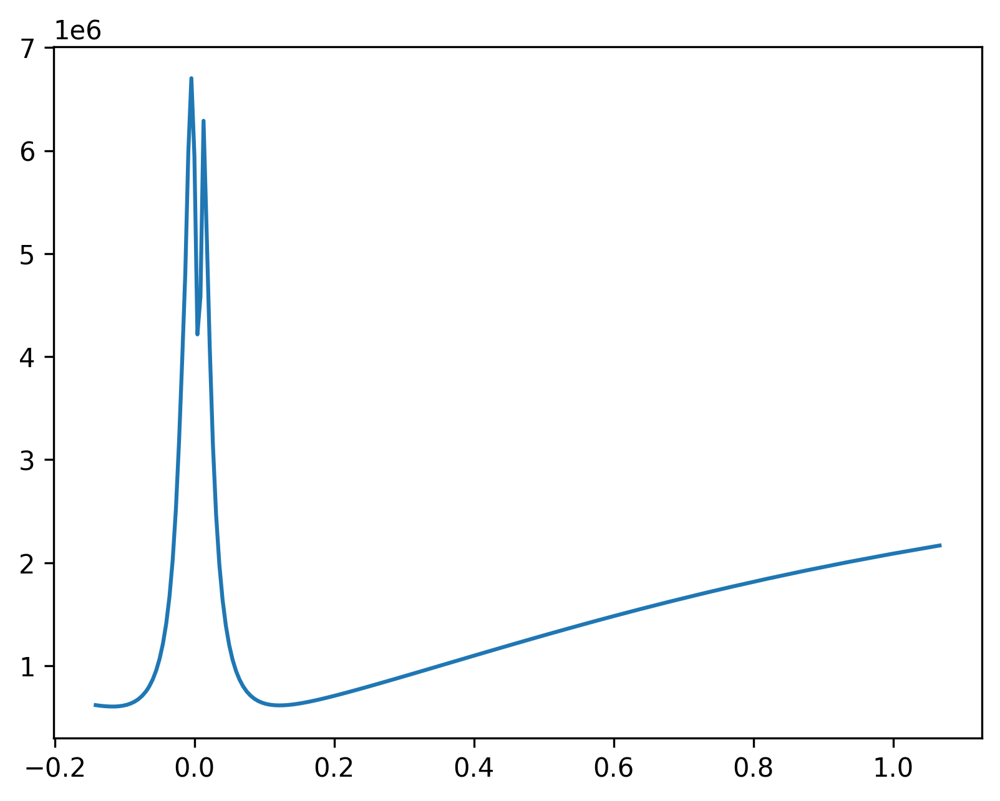

In [36]:
plt.plot(mod30_21s_wlshift_2vt,mod30_21s_int_2vt)

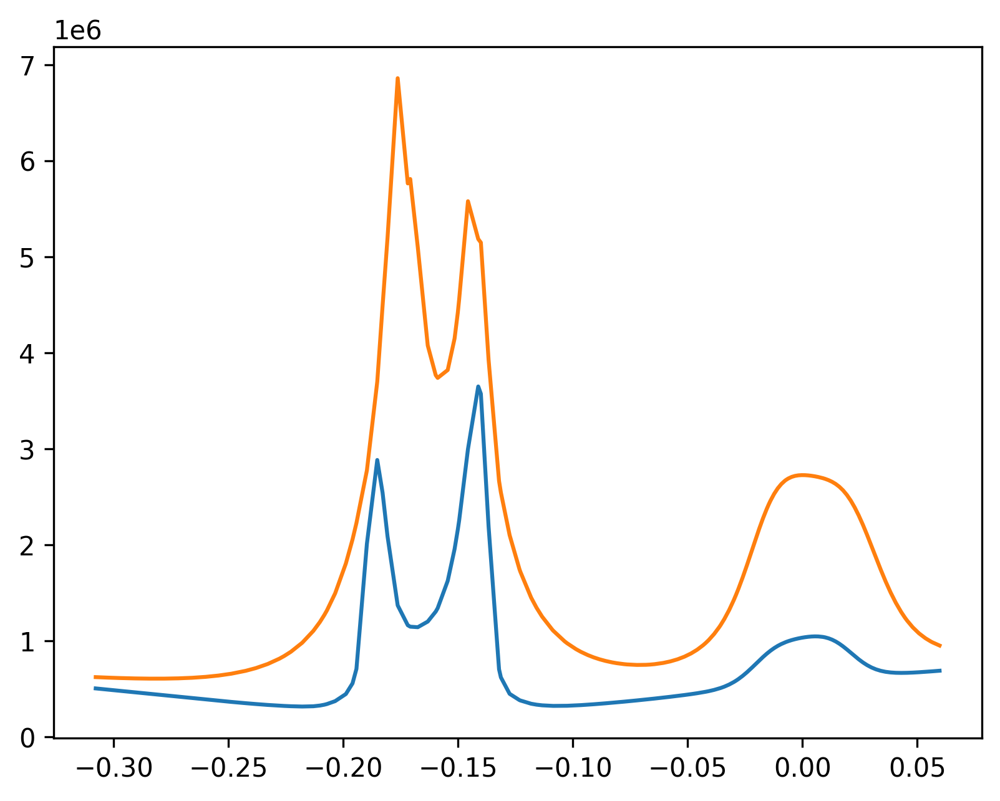

In [38]:
fig,ax=plt.subplots()

ax.plot(mod84_21s_wlshift_hep_5vt_H20,mod84_21s_int_5vt_H20)
ax.plot(mod30_21s_wlshift_hep_5vt_H20,mod30_21s_int_5vt_H20)

In [72]:
ncol = 20
map = tol_colors.tol_cmap(colormap='rainbow_discrete',lut=ncol+4)
cmap_choice = map(np.linspace(0,1,ncol+2))

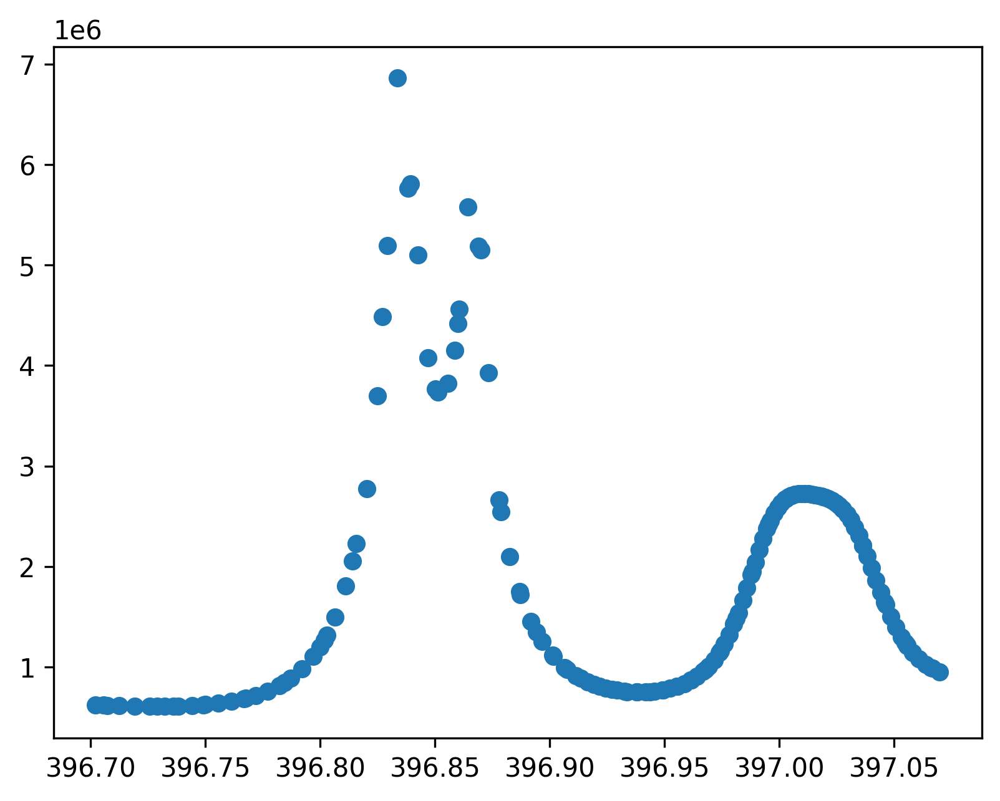

In [74]:
plt.scatter(mod30_21s_wl_5vt_H20,mod30_21s_int_5vt_H20)

In [60]:
from scipy.ndimage import gaussian_filter


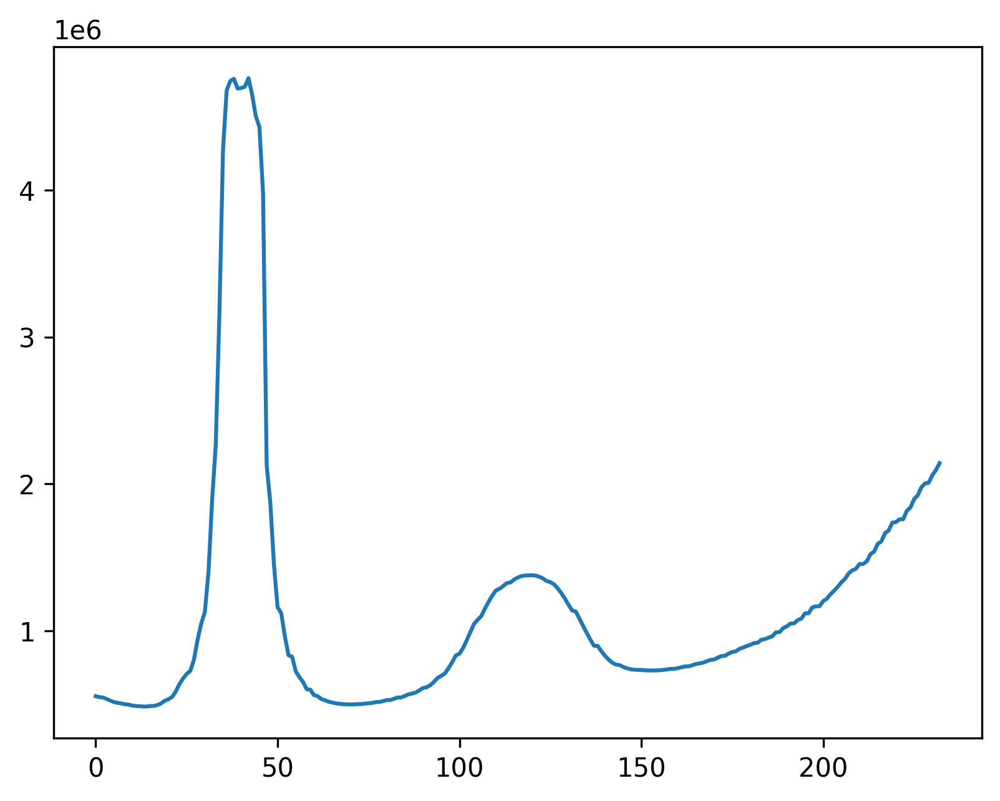

In [106]:
plt.plot(rh_wl_45s_H20_50gs_5vt)

In [108]:
rh_samp_caii_mod30_21s_int_5vt_H20 = mod30_21s_int_5vt_H20
rh_wl_caii_mod30_21s_int_5vt_H20 = mod30_21s_wl_5vt_H20

rh_samp_45s_H20_50gs_5vt = mod30_45s_int_H20 
rh_wl_45s_H20_50gs_5vt = mod30_45s_wl_H20

fwhm = .005 # in nm
ntw = 45

yconv=psf_adjust(rh_wl_caii_mod30_21s_int_5vt_H20,rh_samp_caii_mod30_21s_int_5vt_H20,fwhm,dkist_wl,ntw,
                               gaussian_psf)
yconv_45s=psf_adjust(rh_wl_45s_H20_50gs_5vt,rh_samp_45s_H20_50gs_5vt,fwhm,dkist_wl,ntw,gaussian_psf)

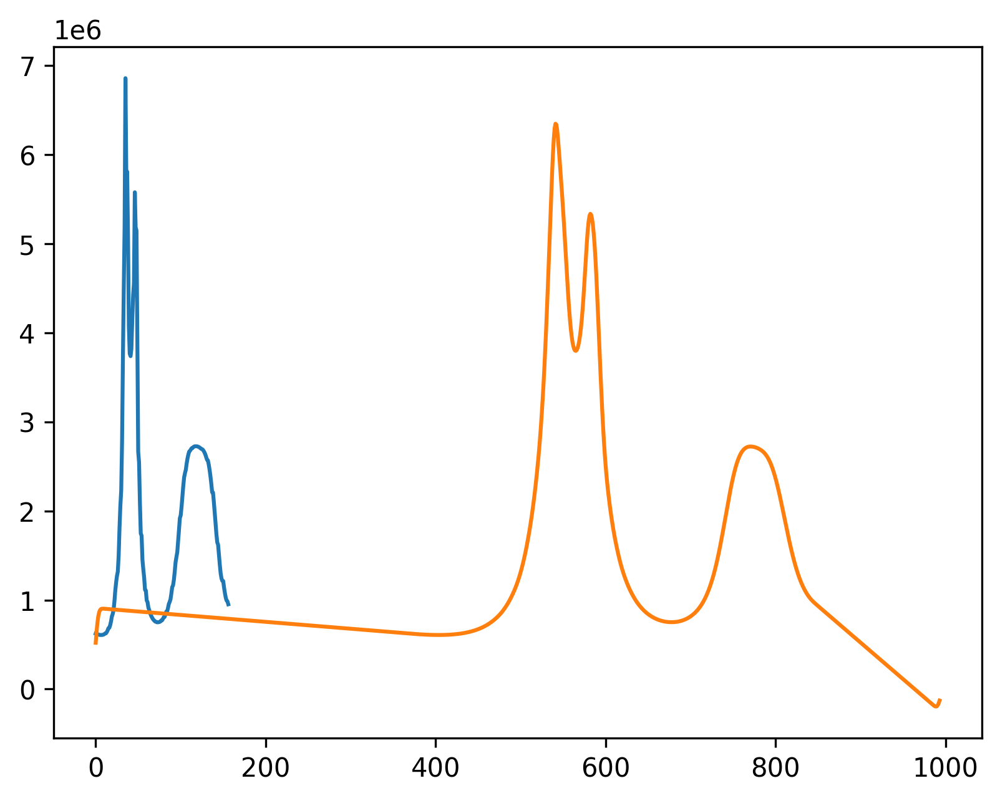

In [66]:
plt.plot(rh_samp_caii_mod30_21s_int_5vt_H20)
plt.plot(yconv)

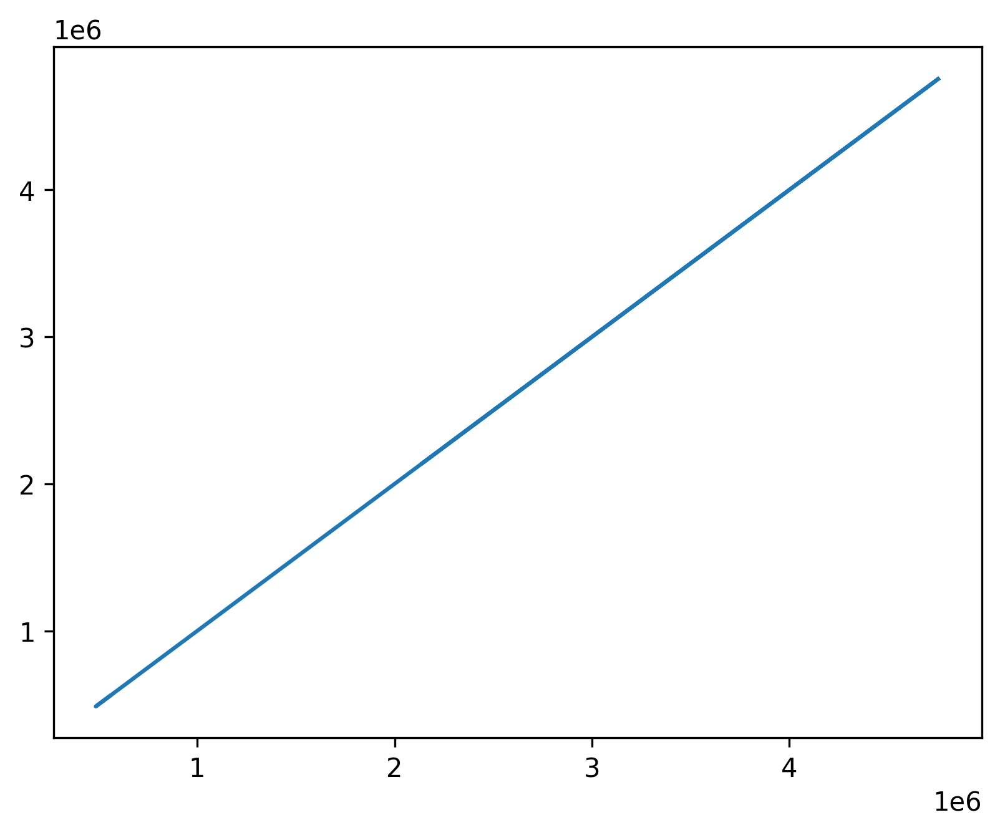

In [100]:
plt.plot(rh_wl_45s_H20_50gs_5vt,rh_samp_45s_H20_50gs_5vt)

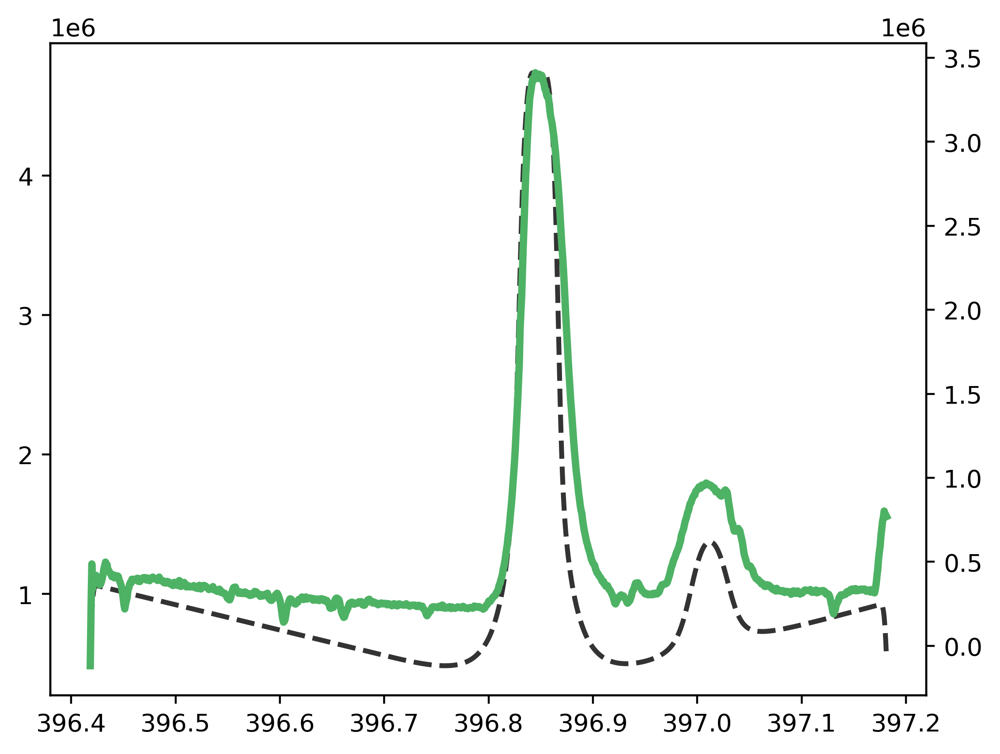

In [114]:
fig,ax=plt.subplots(dpi=400)
ax.plot(dkist_wl,yconv_45s,'--',alpha=0.8,label=r't3F10-15-8/15w-5v, 45s',c='black',linewidth=2,zorder=3)
ax1 = ax.twinx()
ax1.plot(dkist_wl,dkist_int,label='ViSP, ribbon center',linewidth=3,c=cmap_choice[10],zorder=2)

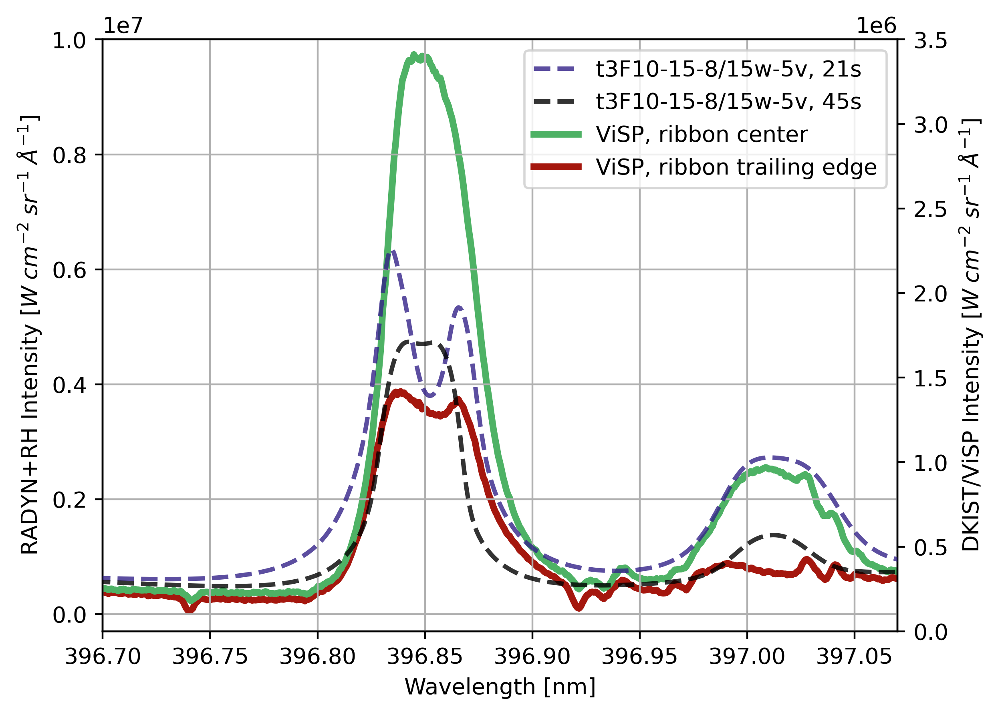

In [110]:


fig,ax=plt.subplots(dpi=400)

# lns3 = ax.plot(mod30_3s_wlshift_2vt,mod30_3s_int_2vt,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 3s',c=colors[0])

# lns9 = ax.plot(mod30_17s_wlshift_2vt,mod30_19s_int_2vt,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 19s',c=colors[1])


ax1 = ax.twinx()

lns15 = ax1.plot(dkist_wl,dkist_int,label='ViSP, ribbon center',linewidth=3,c=cmap_choice[10],zorder=2)
lns16 = ax1.plot(dkist_wl,dkist_int_trail,label='ViSP, ribbon trailing edge',linewidth=3,c=cmap_choice[19],zorder=1)
#lns17 = ax1.plot(dkist_wl,dkist_int_front,label='ViSP, ribbon front',linewidth=4,c=colors[0])
lns1 = ax.plot(dkist_wl,yconv,'--',alpha=0.8,label=r't3F10-15-8/15w-5v, 21s',c='#332288',linewidth=2,zorder=3)
lns2 = ax.plot(dkist_wl,yconv_45s,'--',alpha=0.8,label=r't3F10-15-8/15w-5v, 45s',c='black',linewidth=2,zorder=3)

#lns4 = ax.plot(rh_wl_shift30,rh_int30_2vt_300broadc,'-*',alpha=0.8,label=r'RH, $300*g_{stark}$, $v_{turb}=2\; km\; s^{-1}$',c='orange')
ax.set_xlim([396.7,397.07])
#ax0.set_xlim([-0.1,0.1])
ax.set_xlabel('Wavelength [nm]')
#ax0.set_ylabel(r'Intensity $[W\;cm^{-2}\;\AA^{-1}\;sr^{-1}]$')
ax1.set_ylabel(r'DKIST/ViSP Intensity $[W\;cm^{-2}\;sr^{-1}\;\AA^{-1}]$')
ax.set_ylabel(r'RADYN+RH Intensity $[W\;cm^{-2}\;sr^{-1}\;\AA^{-1}]$')


lns = lns1+lns2+lns15+lns16
labs = [l.get_label() for l in lns]
ax.legend(lns,labs,loc=0,fontsize=10)

ax.set_ylim([-.3e6,10e6])

ax1.set_ylim([0,3.5e6])
#ax0.set_ylim([0,4e6])
ax.set_xlabel('Wavelength [nm]')
ax.grid()
ax.set_zorder(ax1.get_zorder()+1) # put ax in front of ax2
ax.patch.set_visible(False) # hide the 'canvas'

In [69]:
# not convolved

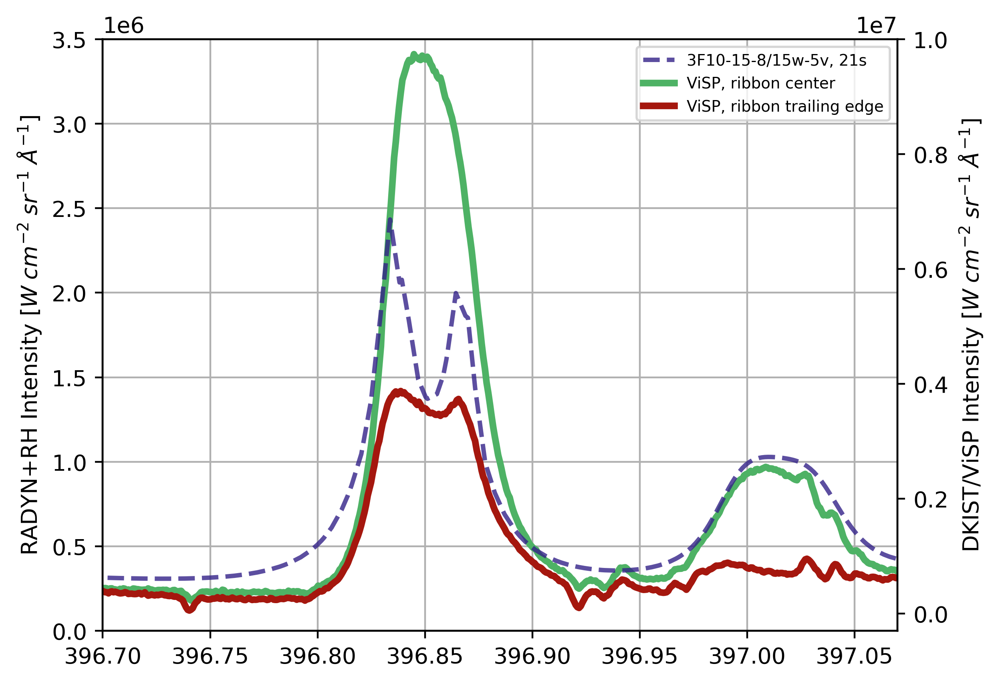

In [71]:


fig,ax1=plt.subplots(dpi=400)

# lns3 = ax.plot(mod30_3s_wlshift_2vt,mod30_3s_int_2vt,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 3s',c=colors[0])

# lns9 = ax.plot(mod30_17s_wlshift_2vt,mod30_19s_int_2vt,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 19s',c=colors[1])


ax = ax1.twinx()
lns15 = ax1.plot(dkist_wl,dkist_int,label='ViSP, ribbon center',linewidth=3,c=cmap_choice[10])
lns16 = ax1.plot(dkist_wl,dkist_int_trail,label='ViSP, ribbon trailing edge',linewidth=3,c=cmap_choice[19])
#lns17 = ax1.plot(dkist_wl,dkist_int_front,label='ViSP, ribbon front',linewidth=4,c=colors[0])
lns1 = ax.plot(mod30_21s_wl_5vt_H20,mod30_21s_int_5vt_H20,'--',alpha=0.8,label=r'3F10-15-8/15w-5v, 21s',c='#332288',linewidth=2)


#lns4 = ax.plot(rh_wl_shift30,rh_int30_2vt_300broadc,'-*',alpha=0.8,label=r'RH, $300*g_{stark}$, $v_{turb}=2\; km\; s^{-1}$',c='orange')
ax.set_xlim([396.7,397.07])
#ax0.set_xlim([-0.1,0.1])
ax.set_xlabel('Wavelength [nm]')
#ax0.set_ylabel(r'Intensity $[W\;cm^{-2}\;\AA^{-1}\;sr^{-1}]$')
ax.set_ylabel(r'DKIST/ViSP Intensity $[W\;cm^{-2}\;sr^{-1}\;\AA^{-1}]$')
ax1.set_ylabel(r'RADYN+RH Intensity $[W\;cm^{-2}\;sr^{-1}\;\AA^{-1}]$')

lns = lns1+lns15+lns16
labs = [l.get_label() for l in lns]
ax.legend(lns,labs,loc=0,fontsize=7)

ax.set_ylim([-.3e6,10e6])

ax1.set_ylim([0,3.5e6])
#ax0.set_ylim([0,4e6])

ax1.grid()

In [62]:
#example convolution with gaussian psf
def gaussian_psf(x, fwhm):
	#x = wavelength [nm]
	# fwhm in [nm]
    sigma = fwhm / (2 * np.sqrt(2 * np.log(2)))  # Calculate sigma from FWHM
    tr = np.exp(-(x)**2 / (2 * (sigma**2)))
    tr /= tr.sum()
    return tr
#write adjustment for point spread function from atlas
def psf_adjust(wlsel,ilamsel,fwhm,new_dispersion_range,ntw,gaussian_psf):
   
    
    func=interp1d(wlsel,ilamsel,kind='linear',fill_value='extrapolate')
    yatlas = func(new_dispersion_range)
    dw=new_dispersion_range[1]-new_dispersion_range[0]
    dw=dw
    tw=(np.arange(ntw)-ntw//2)*dw
    
    for i in range(1):

    	psf = gaussian_psf(tw, fwhm) # guassian transmission profiles
    	yconv = convolve(yatlas, psf, mode='same', method='fft')
        
    return yconv

from scipy.interpolate import interp1d
from scipy.signal import convolve

In [75]:
fwhm/(dkist_wl[1]-dkist_wl[0])

6.505720752556957

In [77]:
rh_samp = mod30_21s_int_5vt_H20[hep_inds_rh]
rh_wl = mod30_21s_wl_5vt_H20[hep_inds_rh]
fwhm = .005 # in nm
ntw = 45

yconv=psf_adjust(rh_wl,rh_samp,fwhm,dkist_wl,ntw,
                               gaussian_psf)

NameError: name 'hep_inds_rh' is not defined

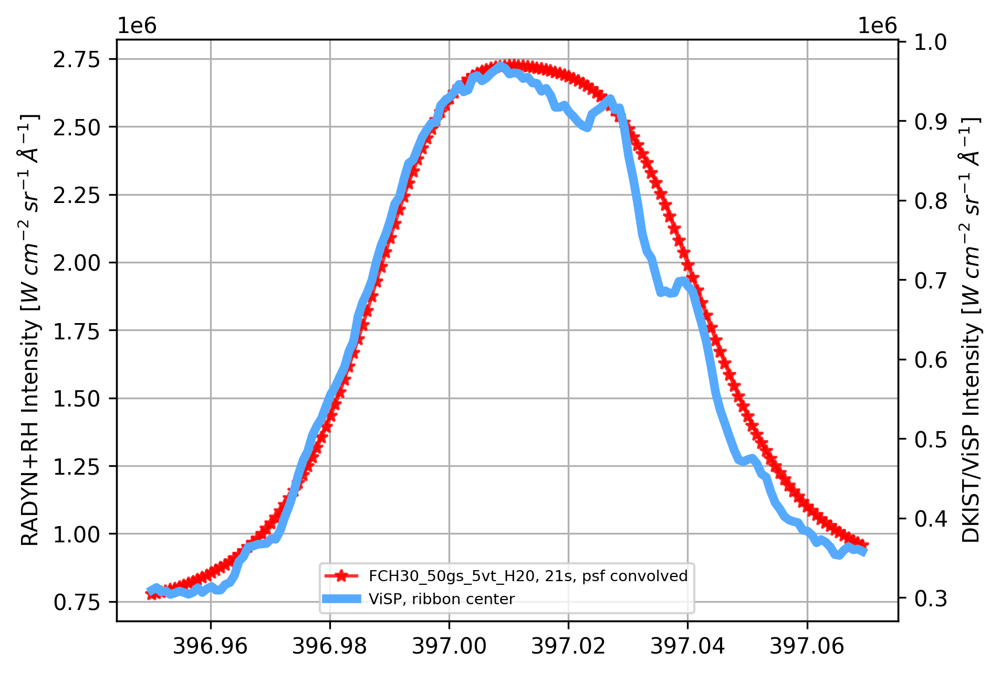

In [79]:
# convolved compare
fig,ax2=plt.subplots()

colors = plt.cm.cool(np.linspace(0,1,4))

# lns3 = ax.plot(mod30_3s_wlshift_2vt,mod30_3s_int_2vt,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 3s',c=colors[0])

# lns9 = ax.plot(mod30_17s_wlshift_2vt,mod30_19s_int_2vt,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 19s',c=colors[1])

# lns1 = ax1.plot(mod30_21s_wl_5vt_H20[hep_inds_rh],mod30_21s_int_5vt_H20[hep_inds_rh],'-*',alpha=0.8,label=r'FCH30_50gs_5vt_H20, 21s',c='red')
# ax1_0 = ax1.twinx()
# lns2 = ax1_0.plot(dkist_wl[hep_inds_dkist],dkist_int[hep_inds_dkist],label='ViSP, ribbon center',linewidth=4,c=colors[1])

# ax1.set_ylabel(r'RADYN+RH Intensity $[W\;cm^{-2}\;\AA^{-1}\;sr^{-1}]$')
# ax1_0.set_ylabel(r'DKIST/ViSP Intensity $[W\;cm^{-2}\;\AA^{-1}\;sr^{-1}]$')


lns3 = ax2.plot(dkist_wl[hep_inds_dkist],yconv[hep_inds_dkist],'-*',alpha=0.8,label=r'FCH30_50gs_5vt_H20, 21s, psf convolved',c='red')
ax2_0 = ax2.twinx()
lns4 = ax2_0.plot(dkist_wl[hep_inds_dkist],dkist_int[hep_inds_dkist],label='ViSP, ribbon center',linewidth=4,c=colors[1])

ax2.set_ylabel(r'RADYN+RH Intensity $[W\;cm^{-2}\;sr^{-1}\;\AA^{-1}]$')
ax2_0.set_ylabel(r'DKIST/ViSP Intensity $[W\;cm^{-2}\;sr^{-1}\;\AA^{-1}]$')

# lns = lns1+lns2
# labs = [l.get_label() for l in lns]
# ax1.legend(lns,labs,loc=0,fontsize=7)


lns = lns3+lns4
labs = [l.get_label() for l in lns]
ax2.legend(lns,labs,fontsize=7,loc='lower center')
# ax.set_ylim([-.3e6,8e6])

# ax1.set_ylim([-.3e6,8e6])
#ax0.set_ylim([0,4e6])
# ax1.grid()
ax2.grid()

In [81]:
!pip install spectres


In [83]:
hep_inds_rh = np.where((mod30_21s_wl_5vt_H20>396.95) & (mod30_21s_wl_5vt_H20< 397.07))
hep_inds_dkist = np.where((dkist_wl>396.95) & (dkist_wl< 397.07))

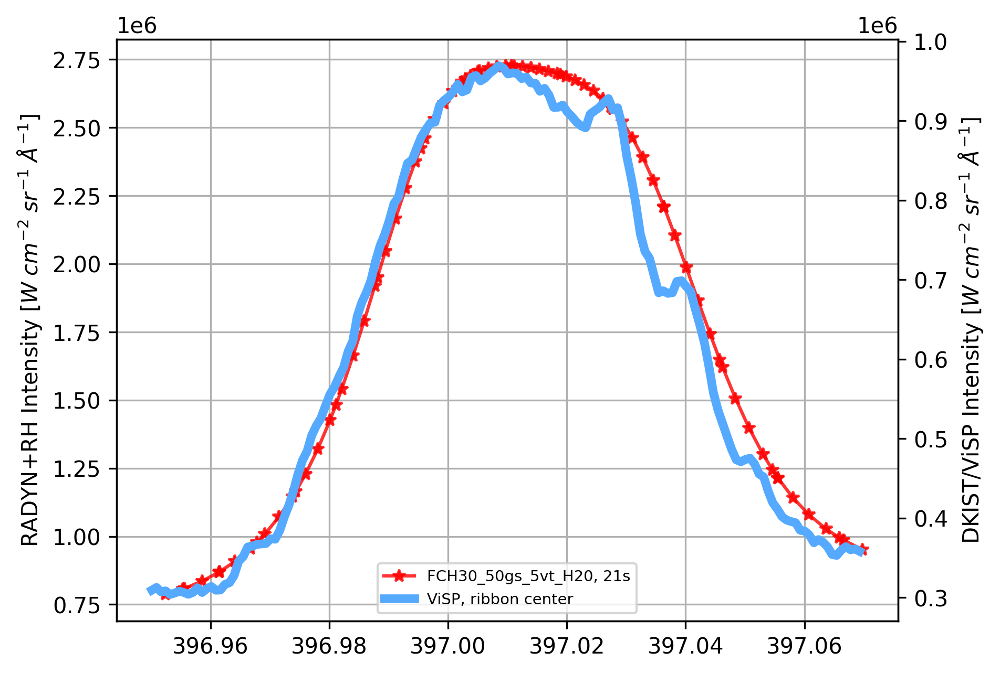

In [84]:
fig,ax2=plt.subplots()

colors = plt.cm.cool(np.linspace(0,1,4))

# lns3 = ax.plot(mod30_3s_wlshift_2vt,mod30_3s_int_2vt,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 3s',c=colors[0])

# lns9 = ax.plot(mod30_17s_wlshift_2vt,mod30_19s_int_2vt,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 19s',c=colors[1])

# lns1 = ax1.plot(mod30_21s_wl_5vt_H20[hep_inds_rh],mod30_21s_int_5vt_H20[hep_inds_rh],'-*',alpha=0.8,label=r'FCH30_50gs_5vt_H20, 21s',c='red')
# ax1_0 = ax1.twinx()
# lns2 = ax1_0.plot(dkist_wl[hep_inds_dkist],dkist_int[hep_inds_dkist],label='ViSP, ribbon center',linewidth=4,c=colors[1])

# ax1.set_ylabel(r'RADYN+RH Intensity $[W\;cm^{-2}\;\AA^{-1}\;sr^{-1}]$')
# ax1_0.set_ylabel(r'DKIST/ViSP Intensity $[W\;cm^{-2}\;\AA^{-1}\;sr^{-1}]$')


lns3 = ax2.plot(mod30_21s_wl_5vt_H20[hep_inds_rh],mod30_21s_int_5vt_H20[hep_inds_rh],'-*',alpha=0.8,label=r'FCH30_50gs_5vt_H20, 21s',c='red')
ax2_0 = ax2.twinx()
lns4 = ax2_0.plot(dkist_wl[hep_inds_dkist],dkist_int[hep_inds_dkist],label='ViSP, ribbon center',linewidth=4,c=colors[1])

ax2.set_ylabel(r'RADYN+RH Intensity $[W\;cm^{-2}\;sr^{-1}\;\AA^{-1}]$')
ax2_0.set_ylabel(r'DKIST/ViSP Intensity $[W\;cm^{-2}\;sr^{-1}\;\AA^{-1}]$')

# lns = lns1+lns2
# labs = [l.get_label() for l in lns]
# ax1.legend(lns,labs,loc=0,fontsize=7)


lns = lns3+lns4
labs = [l.get_label() for l in lns]
ax2.legend(lns,labs,fontsize=7,loc='lower center')
# ax.set_ylim([-.3e6,8e6])

# ax1.set_ylim([-.3e6,8e6])
#ax0.set_ylim([0,4e6])
# ax1.grid()
ax2.grid()

In [88]:
hepwl = 397.01

mod30wl_hepshift = mod30_21s_wl_5vt_H20-hepwl
mod84wl_hepshift = mod84_21s_wl_5vt_H20-hepwl
dkist_wl_hepshift = dkist_wl-hepwl
rhwl3_hepshift = rh_wl3-hepwl
rhwl4_hepshift = rh_wl4-hepwl
rhwl5_hepshift = rh_wl5-hepwl
rhwl6_hepshift = rh_wl6-hepwl

In [90]:
rhwl3_hepshift

array([-0.05753935, -0.05461277, -0.05438854, -0.05140133, -0.04856324,
       -0.04847355, -0.04586109, -0.04328286, -0.04214771, -0.04081758,
       -0.03845528, -0.03618684, -0.03561908, -0.03400397, -0.03189909,
       -0.02986532, -0.02887007, -0.02789635, -0.02598647, -0.02413044,
       -0.02232351, -0.02188159, -0.02056133, -0.01883995, -0.01715575,
       -0.01550545, -0.01463285, -0.01388605, -0.01229482, -0.01072927,
       -0.00918713, -0.00766632, -0.00710132, -0.00616496, -0.00494155,
       -0.00468133, -0.00321387, -0.00176113, -0.00032183,  0.00073754,
        0.00110523,  0.00253229,  0.0039716 ,  0.00542433,  0.00689179,
        0.00837542,  0.00891036,  0.00987678,  0.01139759,  0.01293973,
        0.01450529,  0.01609652,  0.0174461 ,  0.01771591,  0.01936621,
        0.02105041,  0.0227718 ,  0.02453398,  0.02634091,  0.02637622,
        0.02819693,  0.03010682,  0.03207578,  0.03410956,  0.03573491,
        0.03621443,  0.03839731,  0.04066574,  0.04302805,  0.04

In [92]:
rh_intnorm3[10]

0.21005460944521467

In [94]:
2*(dkist_wl[1]-dkist_wl[0])

0.0015371087048379195

In [96]:

fwhm = .005 # in nm
ntw = 45

yconv_3=psf_adjust(rhwl3_hepshift,rh_intnorm3,fwhm,dkist_wl_hepshift,ntw,
                               gaussian_psf)
yconv_4=psf_adjust(rhwl4_hepshift,rh_intnorm4,fwhm,dkist_wl_hepshift,ntw,
                               gaussian_psf)
yconv_5=psf_adjust(rhwl5_hepshift,rh_intnorm5,fwhm,dkist_wl_hepshift,ntw,
                               gaussian_psf)
yconv_6=psf_adjust(rhwl6_hepshift,rh_intnorm6,fwhm,dkist_wl_hepshift,ntw,
                               gaussian_psf)

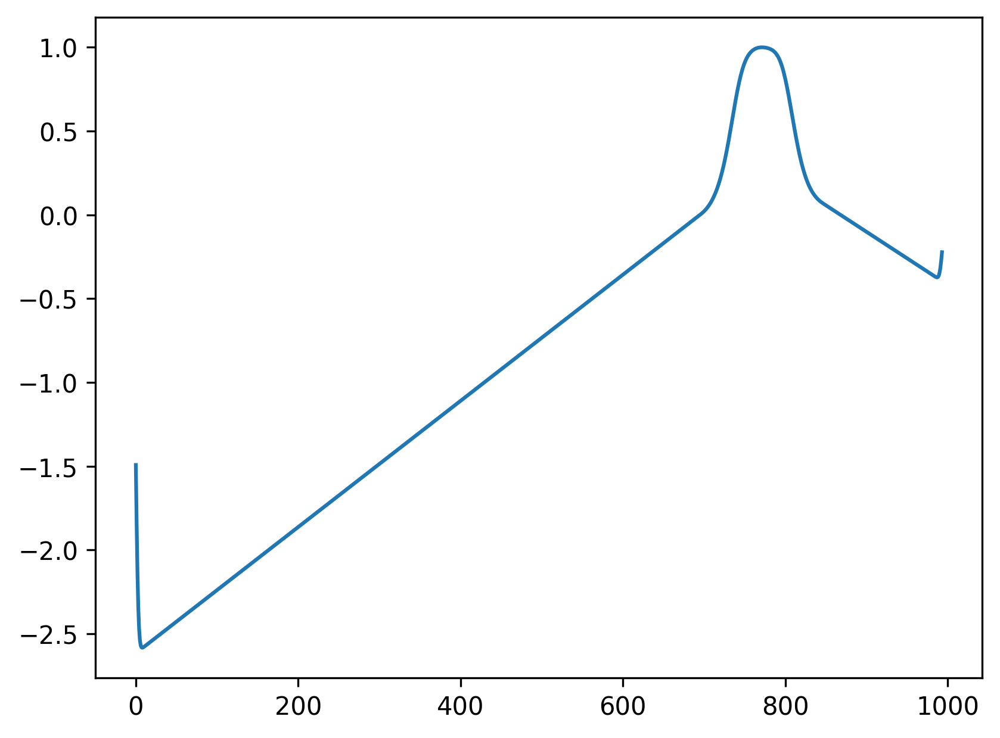

In [98]:
plt.plot(yconv_3)

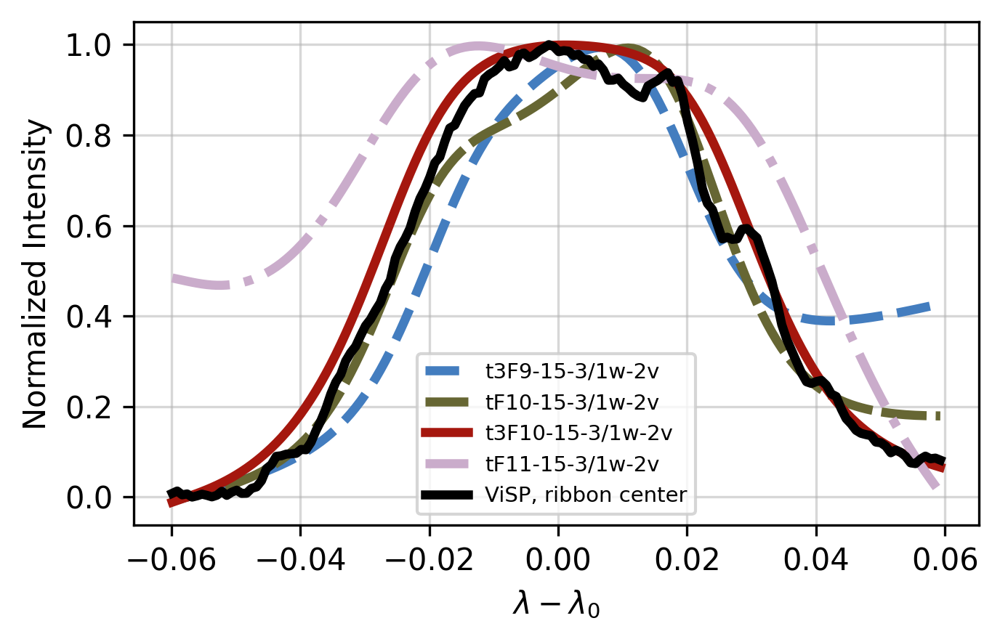

In [100]:
fig,ax=plt.subplots(figsize=(5,3))

colors = plt.cm.cool(np.linspace(0,1,4))

# lns3 = ax.plot(mod30_3s_wlshift_2vt,mod30_3s_int_2vt,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 3s',c=colors[0])

# lns9 = ax.plot(mod30_17s_wlshift_2vt,mod30_19s_int_2vt,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 19s',c=colors[1])

# ax.plot(mod30wl_hepshift[hep_inds_rh],normalize(mod30_21s_int_5vt_H20[hep_inds_rh]),'-o',label=r'3F10-15-8/50w-5v, 21s',c='#CC3311',linewidth=2,markersize=2)
# ax.plot(mod84wl_hepshift[hep_inds_rh],normalize(mod84_21s_int_5vt_H20[hep_inds_rh]),'--',alpha=0.8,label=r'3F9-15-8/50w-5v, 21s',c='#555555',linewidth=2)

ax.plot(dkist_wl_hepshift[hep_inds_dkist],yconv_5[hep_inds_dkist],linestyle='--',label=r't3F9-15-3/1w-2v',linewidth=3,c=cmap_choice[7],alpha=1)
ax.plot(dkist_wl_hepshift[hep_inds_dkist],yconv_6[hep_inds_dkist],linestyle=(0, (5, 1)),label=r'tF10-15-3/1w-2v',linewidth=3,c='#666633',alpha=1)
ax.plot(dkist_wl_hepshift[hep_inds_dkist],yconv_3[hep_inds_dkist],linestyle='-',label='t3F10-15-3/1w-2v',linewidth=3,c=cmap_choice[19],alpha=1)
#delta = 3, E_c = 15 keV, E_t = 1e12
ax.plot(dkist_wl_hepshift[hep_inds_dkist],yconv_4[hep_inds_dkist],linestyle='-.',label='tF11-15-3/1w-2v',linewidth=3,c=cmap_choice[1],alpha=1)
ax.plot(dkist_wl_hepshift[hep_inds_dkist],normalize(dkist_int[hep_inds_dkist]),label='ViSP, ribbon center',linewidth=3,c='black')

ax.set_ylabel(r'Normalized Intensity',fontsize=10)
ax.set_xlabel(r'$\lambda-\lambda_0$',fontsize=10)
ax.legend(loc=0,fontsize=7)
ax.grid(alpha=.5)

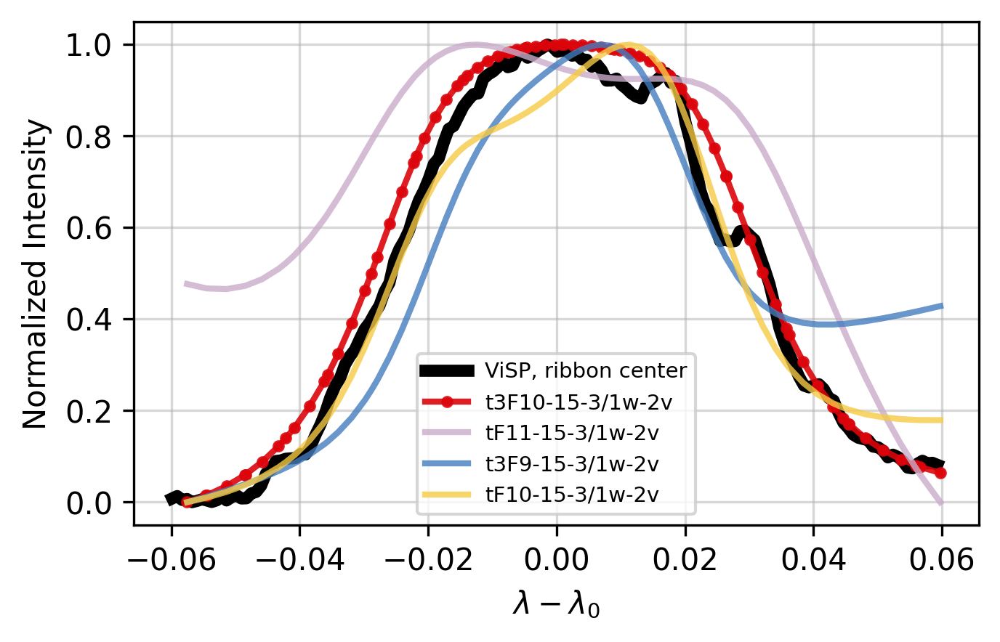

In [102]:
fig,ax=plt.subplots(figsize=(5,3))

colors = plt.cm.cool(np.linspace(0,1,4))

# lns3 = ax.plot(mod30_3s_wlshift_2vt,mod30_3s_int_2vt,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 3s',c=colors[0])

# lns9 = ax.plot(mod30_17s_wlshift_2vt,mod30_19s_int_2vt,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 19s',c=colors[1])

# ax.plot(mod30wl_hepshift[hep_inds_rh],normalize(mod30_21s_int_5vt_H20[hep_inds_rh]),'-o',label=r'3F10-15-8/50w-5v, 21s',c='#CC3311',linewidth=2,markersize=2)
# ax.plot(mod84wl_hepshift[hep_inds_rh],normalize(mod84_21s_int_5vt_H20[hep_inds_rh]),'--',alpha=0.8,label=r'3F9-15-8/50w-5v, 21s',c='#555555',linewidth=2)
ax.plot(dkist_wl_hepshift[hep_inds_dkist],normalize(dkist_int[hep_inds_dkist]),label='ViSP, ribbon center',linewidth=4,c='black')
ax.plot(rhwl3_hepshift,rh_intnorm3,linestyle='-',marker='.',label='t3F10-15-3/1w-2v',linewidth=2,c=cmap_choice[18],alpha=.9)
#delta = 3, E_c = 15 keV, E_t = 1e12
ax.plot(rhwl4_hepshift,rh_intnorm4,linestyle='-',label='tF11-15-3/1w-2v',linewidth=2,c=cmap_choice[1],alpha=.8)
ax.plot(rhwl5_hepshift,rh_intnorm5,linestyle='-',label=r't3F9-15-3/1w-2v',linewidth=2,c=cmap_choice[7],alpha=.8)
ax.plot(rhwl6_hepshift,rh_intnorm6,linestyle='-',label=r'tF10-15-3/1w-2v',linewidth=2,c=cmap_choice[14],alpha=.8)

ax.set_ylabel(r'Normalized Intensity',fontsize=10)
ax.set_xlabel(r'$\lambda-\lambda_0$',fontsize=10)
ax.legend(loc=0,fontsize=7)
ax.grid(alpha=.5)

In [104]:
fwhm = .005 # in nm
ntw = 45

yconv_best=psf_adjust(mod30wl_hepshift,mod30_21s_int_5vt_H20,fwhm,dkist_wl_hepshift,ntw,
                               gaussian_psf)
yconv_goodkinda=psf_adjust(mod84wl_hepshift,mod84_21s_int_5vt_H20,fwhm,dkist_wl_hepshift,ntw,
                               gaussian_psf)

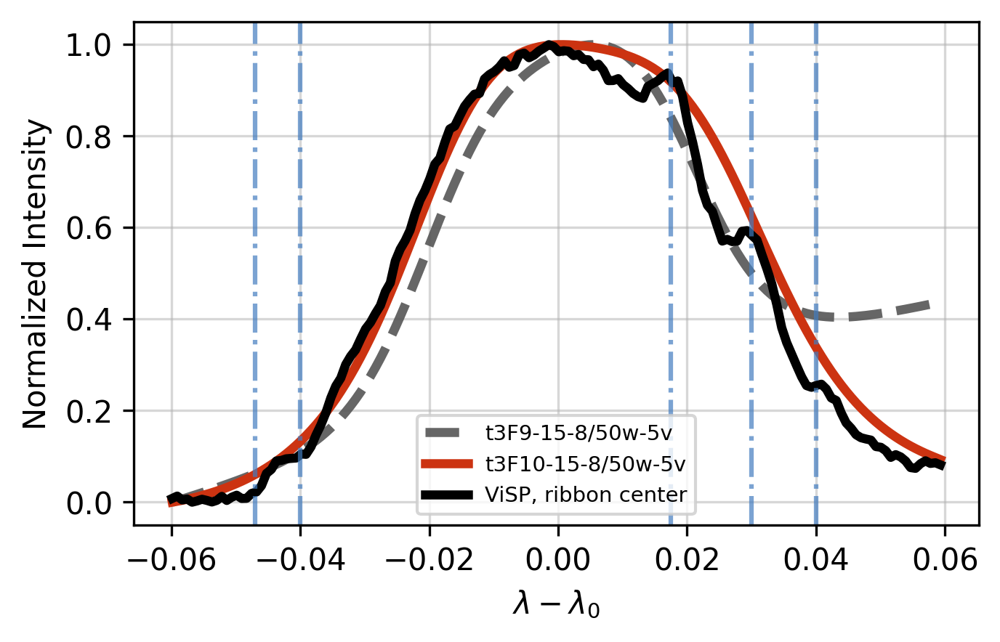

In [106]:
fig,ax=plt.subplots(figsize=(5,3))

colors = plt.cm.cool(np.linspace(0,1,4))

# lns3 = ax.plot(mod30_3s_wlshift_2vt,mod30_3s_int_2vt,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 3s',c=colors[0])

# lns9 = ax.plot(mod30_17s_wlshift_2vt,mod30_19s_int_2vt,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 19s',c=colors[1])
ax.plot(dkist_wl_hepshift[hep_inds_dkist],normalize(yconv_goodkinda[hep_inds_dkist]),'--',alpha=0.9,label=r't3F9-15-8/50w-5v',c='#555555',linewidth=3)
ax.plot(dkist_wl_hepshift[hep_inds_dkist],normalize(yconv_best[hep_inds_dkist]),'-',label=r't3F10-15-8/50w-5v',c='#CC3311',linewidth=3,markersize=3)
ax.plot(dkist_wl_hepshift[hep_inds_dkist],normalize(dkist_int[hep_inds_dkist]),label='ViSP, ribbon center',linewidth=3,c='black')

ax.axvline(.0175,color=cmap_choice[7],alpha=.7,linestyle='-.')
ax.axvline(.03,color=cmap_choice[7],alpha=.7,linestyle='-.')
ax.axvline(.04,color=cmap_choice[7],alpha=.7,linestyle='-.')
ax.axvline(-.04,color=cmap_choice[7],alpha=.7,linestyle='-.')

ax.axvline(-.047,color=cmap_choice[7],alpha=.7,linestyle='-.')
ax.set_ylabel(r'Normalized Intensity',fontsize=10)
ax.set_xlabel(r'$\lambda-\lambda_0$',fontsize=10)
ax.legend(loc=0,fontsize=7)
ax.grid(alpha=.5)

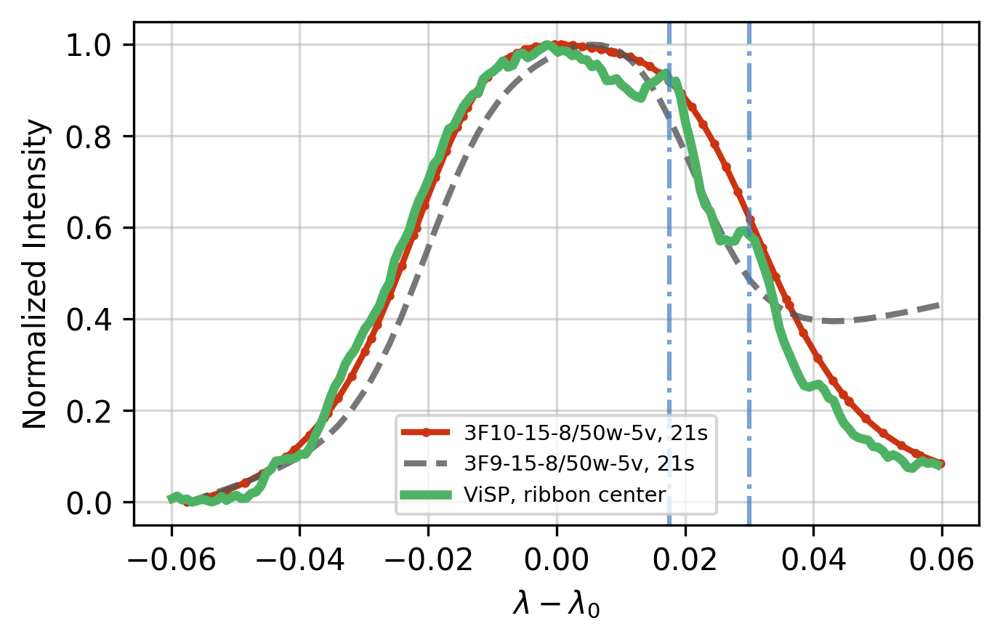

In [108]:
fig,ax=plt.subplots(figsize=(5,3))

colors = plt.cm.cool(np.linspace(0,1,4))

# lns3 = ax.plot(mod30_3s_wlshift_2vt,mod30_3s_int_2vt,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 3s',c=colors[0])

# lns9 = ax.plot(mod30_17s_wlshift_2vt,mod30_19s_int_2vt,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 19s',c=colors[1])

ax.plot(mod30wl_hepshift[hep_inds_rh],normalize(mod30_21s_int_5vt_H20[hep_inds_rh]),'-o',label=r'3F10-15-8/50w-5v, 21s',c='#CC3311',linewidth=2,markersize=2)
ax.plot(mod84wl_hepshift[hep_inds_rh],normalize(mod84_21s_int_5vt_H20[hep_inds_rh]),'--',alpha=0.8,label=r'3F9-15-8/50w-5v, 21s',c='#555555',linewidth=2)
ax.plot(dkist_wl_hepshift[hep_inds_dkist],normalize(dkist_int[hep_inds_dkist]),label='ViSP, ribbon center',linewidth=3,c=cmap_choice[10])
ax.axvline(.0175,color=cmap_choice[7],alpha=.7,linestyle='-.')
ax.axvline(.03,color=cmap_choice[7],alpha=.7,linestyle='-.')
ax.set_ylabel(r'Normalized Intensity',fontsize=10)
ax.set_xlabel(r'$\lambda-\lambda_0$',fontsize=10)
ax.legend(loc=0,fontsize=7)
ax.grid(alpha=.5)

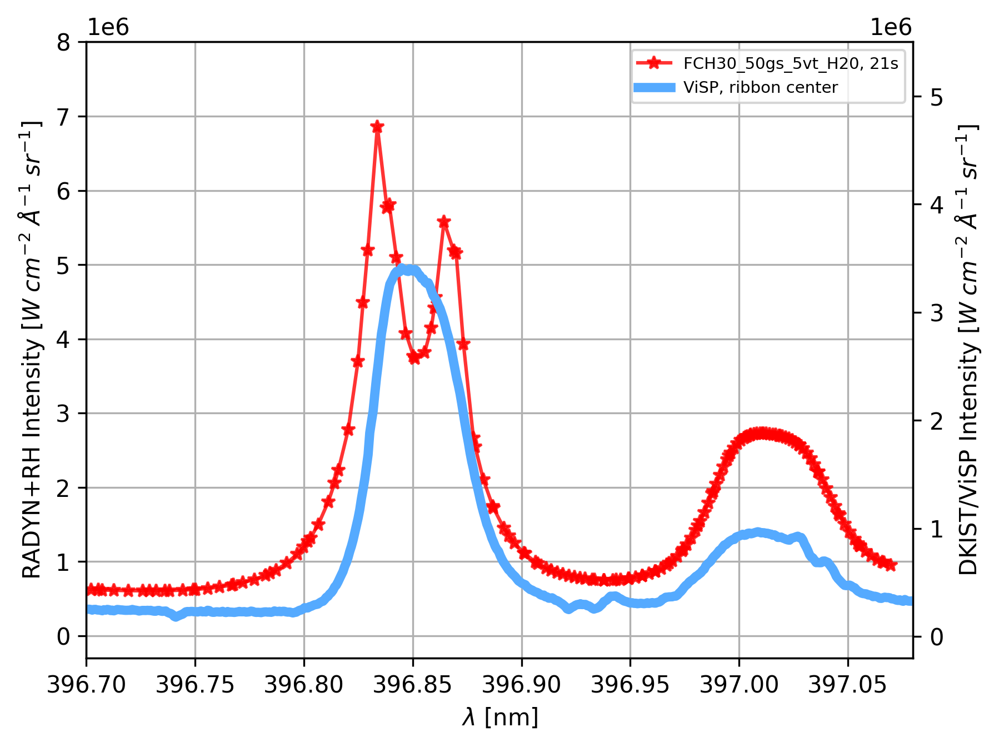

In [110]:


fig,ax=plt.subplots()

colors = plt.cm.cool(np.linspace(0,1,4))

# lns3 = ax.plot(mod30_3s_wlshift_2vt,mod30_3s_int_2vt,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 3s',c=colors[0])

# lns9 = ax.plot(mod30_17s_wlshift_2vt,mod30_19s_int_2vt,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 19s',c=colors[1])

lns1 = ax.plot(mod30_21s_wl_5vt_H20,mod30_21s_int_5vt_H20,'-*',alpha=0.8,label=r'FCH30_50gs_5vt_H20, 21s',c='red')

ax1 = ax.twinx()
lns15 = ax1.plot(dkist_wl,dkist_int,label='ViSP, ribbon center',linewidth=4,c=colors[1])
#lns16 = ax1.plot(dkist_wl,dkist_int_trail,label='ViSP, ribbon trailing edge',linewidth=4,c='black')
#lns17 = ax1.plot(dkist_wl,dkist_int_front,label='ViSP, ribbon front',linewidth=4,c=colors[0])


#lns4 = ax.plot(rh_wl_shift30,rh_int30_2vt_300broadc,'-*',alpha=0.8,label=r'RH, $300*g_{stark}$, $v_{turb}=2\; km\; s^{-1}$',c='orange')
ax.set_xlim([396.7,397.08])
#ax0.set_xlim([-0.1,0.1])
ax.set_xlabel(r'$\lambda$ [nm]')
ax1.set_ylabel(r'DKIST/ViSP Intensity $[W\;cm^{-2}\;\AA^{-1}\;sr^{-1}]$')
ax.set_ylabel(r'RADYN+RH Intensity $[W\;cm^{-2}\;\AA^{-1}\;sr^{-1}]$')


lns = lns1+lns15
labs = [l.get_label() for l in lns]
ax.legend(lns,labs,loc=0,fontsize=7)

ax.set_ylim([-.3e6,8e6])

ax1.set_ylim([-.2e6,5.5e6])
#ax0.set_ylim([0,4e6])

ax.grid()

In [112]:
orig_wl = mod30_21s_wl_5vt_H20[caiih_inds_rh]
new_wl = dkist_wl[caiih_inds_dkist]
orig_flx = mod30_21s_int_5vt_H20[caiih_inds_rh]



NameError: name 'caiih_inds_rh' is not defined

In [114]:
from astropy.io import fits
from astropy import units as u
import numpy as np
from matplotlib import pyplot as plt
from astropy.visualization import quantity_support
from specutils.manipulation import FluxConservingResampler, LinearInterpolatedResampler, SplineInterpolatedResampler
from specutils import Spectrum1D


In [116]:
spline = SplineInterpolatedResampler()


In [118]:
input_spec

NameError: name 'input_spec' is not defined

In [120]:
flux = orig_flx *u.Unit('W cm-2 sr-1 AA-1') 
wl = orig_wl * u.nm
newwl = new_wl *u.nm
input_spec = Spectrum1D(spectral_axis=wl, flux=flux) 
new_spec_fluxcon = spline(input_spec, newwl) 

NameError: name 'orig_flx' is not defined

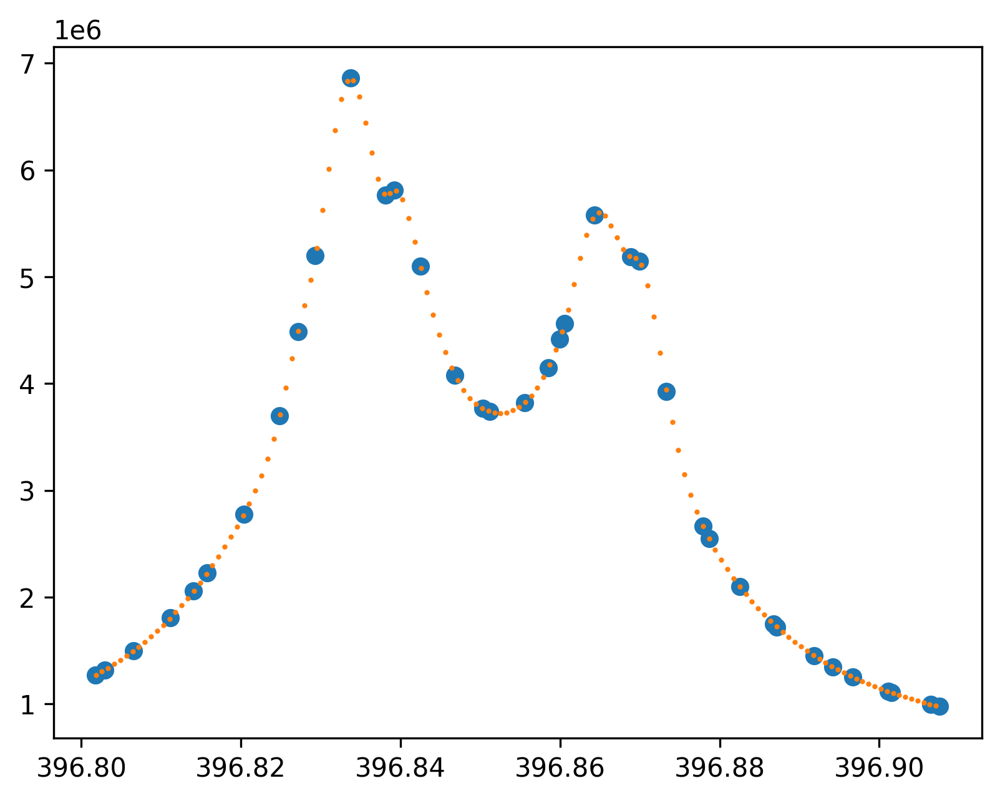

In [939]:
fig,ax=plt.subplots()
ax.scatter(orig_wl,orig_flx)
ax.scatter(new_spec_fluxcon.spectral_axis, new_spec_fluxcon.flux,1)

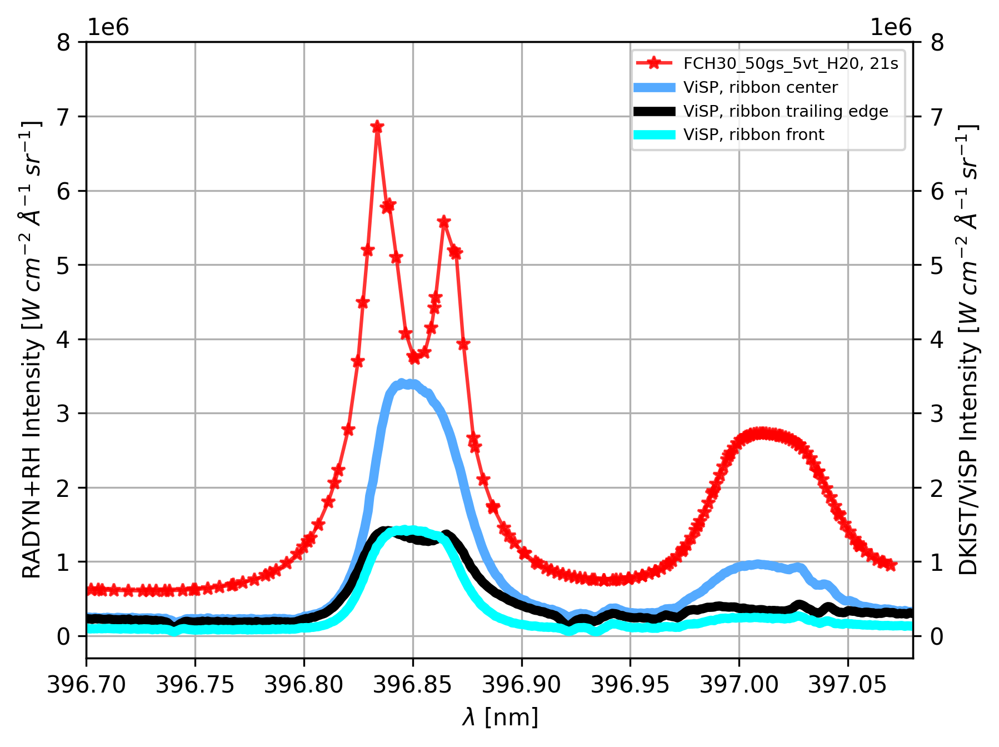

In [941]:


fig,ax=plt.subplots()

colors = plt.cm.cool(np.linspace(0,1,4))

# lns3 = ax.plot(mod30_3s_wlshift_2vt,mod30_3s_int_5vt_H20,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 3s',c=colors[0])

# lns9 = ax.plot(mod30_17s_wlshift_2vt,mod30_19s_int_5vt_H20,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 19s',c=colors[1])

lns1 = ax.plot(mod30_21s_wl_5vt_H20,mod30_21s_int_5vt_H20,'-*',alpha=0.8,label=r'FCH30_50gs_5vt_H20, 21s',c='red')

ax1 = ax.twinx()
lns15 = ax1.plot(dkist_wl,dkist_int,label='ViSP, ribbon center',linewidth=4,c=colors[1])
lns16 = ax1.plot(dkist_wl,dkist_int_trail,label='ViSP, ribbon trailing edge',linewidth=4,c='black')
lns17 = ax1.plot(dkist_wl,dkist_int_front,label='ViSP, ribbon front',linewidth=4,c=colors[0])


#lns4 = ax.plot(rh_wl_shift30,rh_int30_2vt_300broadc,'-*',alpha=0.8,label=r'RH, $300*g_{stark}$, $v_{turb}=2\; km\; s^{-1}$',c='orange')
ax.set_xlim([396.7,397.08])
#ax0.set_xlim([-0.1,0.1])
ax.set_xlabel(r'$\lambda$ [nm]')
ax1.set_ylabel(r'DKIST/ViSP Intensity $[W\;cm^{-2}\;\AA^{-1}\;sr^{-1}]$')
ax.set_ylabel(r'RADYN+RH Intensity $[W\;cm^{-2}\;\AA^{-1}\;sr^{-1}]$')


lns = lns1+lns15+lns16+lns17
labs = [l.get_label() for l in lns]
ax.legend(lns,labs,loc=0,fontsize=7)

ax.set_ylim([-.3e6,8e6])

ax1.set_ylim([-.3e6,8e6])
#ax0.set_ylim([0,4e6])

ax.grid()

In [122]:
fwhm = .005 # in nm
ntw = 45

yconv_1gs=psf_adjust(mod30_21s_wlshift_1gs,mod30_21s_int_1gs,fwhm,dkist_wl_shift2,ntw,
                               gaussian_psf)
yconv_30gs=psf_adjust(mod30_21s_wlshift_30gs,mod30_21s_int_30gs,fwhm,dkist_wl_shift2,ntw,
                               gaussian_psf)
yconv_50gs=psf_adjust(mod30_21s_wlshift_50gs,mod30_21s_int_50gs,fwhm,dkist_wl_shift2,ntw,
                               gaussian_psf)
yconv_100gs=psf_adjust(mod30_21s_wlshift_100gs,mod30_21s_int_100gs,fwhm,dkist_wl_shift2,ntw,
                               gaussian_psf)

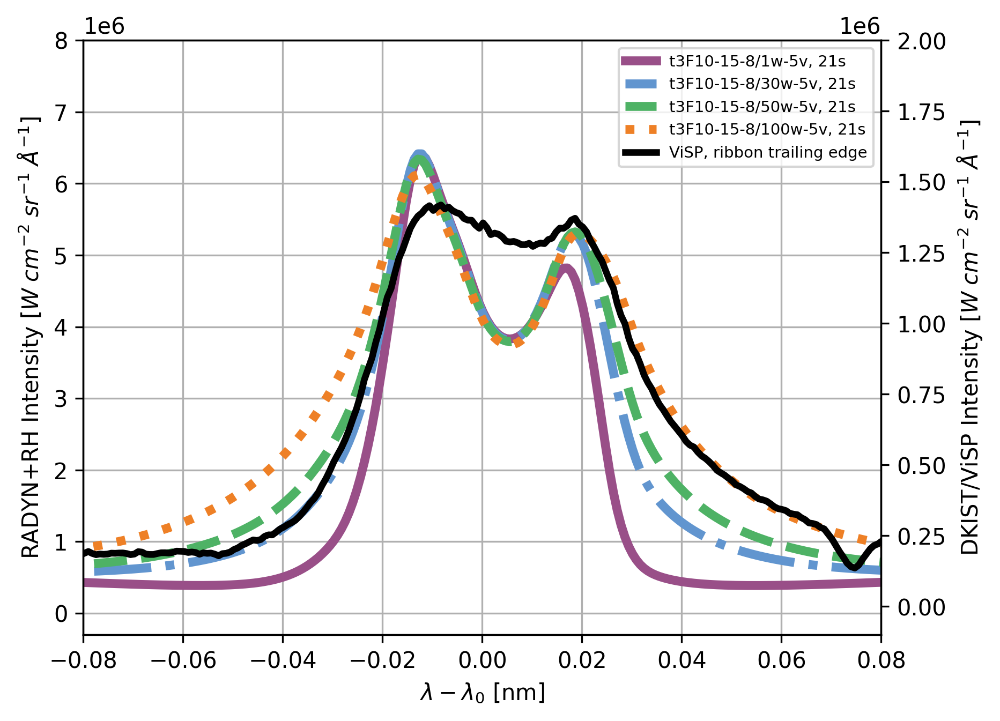

In [124]:
fig,ax=plt.subplots()

colors = plt.cm.ocean(np.linspace(0,1,5))

# lns3 = ax.plot(mod30_3s_wlshift_2vt,mod30_3s_int_2vt,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 3s',c=colors[0])

# lns9 = ax.plot(mod30_17s_wlshift_2vt,mod30_19s_int_2vt,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 19s',c=colors[1])


lns11 = ax.plot(dkist_wl_shift2,yconv_1gs,'-',alpha=1,label=r't3F10-15-8/1w-5v, 21s',c=cmap_choice[4],linewidth=4)
lns12 = ax.plot(dkist_wl_shift2,yconv_30gs,'-.',alpha=1,label=r't3F10-15-8/30w-5v, 21s',c=cmap_choice[8],linewidth=4)
lns13 = ax.plot(dkist_wl_shift2,yconv_50gs,'--',alpha=1,label=r't3F10-15-8/50w-5v, 21s',c=cmap_choice[10],linewidth=4)
lns14 = ax.plot(dkist_wl_shift2,yconv_100gs,':',alpha=1,label=r't3F10-15-8/100w-5v, 21s',c=cmap_choice[16],linewidth=4)

ax1 = ax.twinx()
# lns15 = ax1.plot(dkist_wl_shift2,dkist_int[caiih_inds_dkist],label='ViSP, ribbon center',linewidth=4,c=colors[1])
lns16 = ax1.plot(dkist_wl_shift2,dkist_int_trail[caiih_inds_dkist],label='ViSP, ribbon trailing edge',linewidth=3,c='black',alpha=1)
# lns17 = ax1.plot(dkist_wl_shift2,dkist_int_front[caiih_inds_dkist],label='ViSP, ribbon front',linewidth=4,c=colors[0])


#lns4 = ax.plot(rh_wl_shift30,rh_int30_2vt_300broadc,'-*',alpha=0.8,label=r'RH, $300*g_{stark}$, $v_{turb}=2\; km\; s^{-1}$',c='orange')
ax.set_xlim([-0.08,0.08])
#ax0.set_xlim([-0.1,0.1])
ax.set_xlabel(r'$\lambda - \lambda_0$ [nm]')
#ax0.set_ylabel(r'Intensity $[W\;cm^{-2}\;\AA^{-1}\;sr^{-1}]$')
ax.set_ylabel(r'RADYN+RH Intensity $[W\;cm^{-2}\;sr^{-1}\;\AA^{-1}]$')

ax1.set_ylabel(r'DKIST/ViSP Intensity $[W\;cm^{-2}\;sr^{-1}\;\AA^{-1}]$')


lns = lns11+lns12+lns13+lns14+lns16
labs = [l.get_label() for l in lns]
ax.legend(lns,labs,loc=0,fontsize=7)

ax.set_ylim([-.3e6,8e6])

ax1.set_ylim([-.1e6,2e6])
#ax0.set_ylim([0,4e6])

ax.grid()

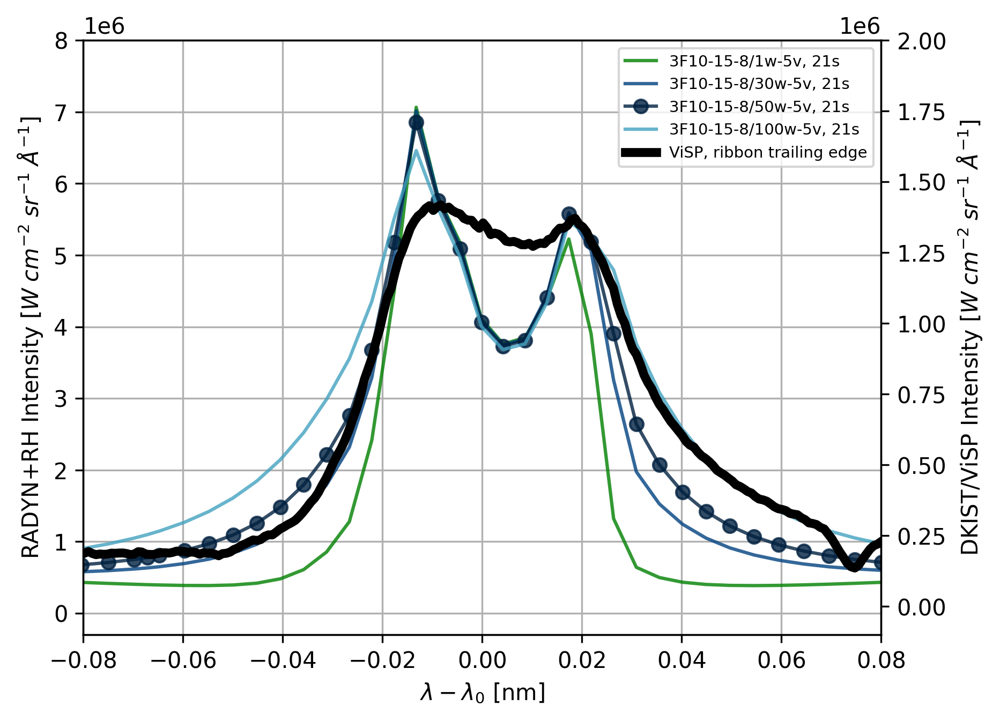

In [126]:
fig,ax=plt.subplots()

colors = plt.cm.ocean(np.linspace(0,1,5))

# lns3 = ax.plot(mod30_3s_wlshift_2vt,mod30_3s_int_2vt,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 3s',c=colors[0])

# lns9 = ax.plot(mod30_17s_wlshift_2vt,mod30_19s_int_2vt,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 19s',c=colors[1])

mod30_21s_int_2vt
mod30_21s_wlshift_2vt

lns11 = ax.plot(mod30_21s_wlshift_1gs,mod30_21s_int_1gs,'-',alpha=0.8,label=r'3F10-15-8/1w-5v, 21s',c=colors[0])
lns12 = ax.plot(mod30_21s_wlshift_30gs,mod30_21s_int_30gs,'-',alpha=0.8,label=r'3F10-15-8/30w-5v, 21s',c=colors[2])
lns13 = ax.plot(mod30_21s_wlshift_50gs,mod30_21s_int_50gs,'-o',alpha=0.8,label=r'3F10-15-8/50w-5v, 21s',c=colors[1])
lns14 = ax.plot(mod30_21s_wlshift_100gs,mod30_21s_int_100gs,'-',alpha=0.8,label=r'3F10-15-8/100w-5v, 21s',c=colors[3])

ax1 = ax.twinx()
# lns15 = ax1.plot(dkist_wl_shift2,dkist_int[caiih_inds_dkist],label='ViSP, ribbon center',linewidth=4,c=colors[1])
lns16 = ax1.plot(dkist_wl_shift2,dkist_int_trail[caiih_inds_dkist],label='ViSP, ribbon trailing edge',linewidth=4,c='black')
# lns17 = ax1.plot(dkist_wl_shift2,dkist_int_front[caiih_inds_dkist],label='ViSP, ribbon front',linewidth=4,c=colors[0])


#lns4 = ax.plot(rh_wl_shift30,rh_int30_2vt_300broadc,'-*',alpha=0.8,label=r'RH, $300*g_{stark}$, $v_{turb}=2\; km\; s^{-1}$',c='orange')
ax.set_xlim([-0.08,0.08])
#ax0.set_xlim([-0.1,0.1])
ax.set_xlabel(r'$\lambda - \lambda_0$ [nm]')
#ax0.set_ylabel(r'Intensity $[W\;cm^{-2}\;\AA^{-1}\;sr^{-1}]$')
ax.set_ylabel(r'RADYN+RH Intensity $[W\;cm^{-2}\;sr^{-1}\;\AA^{-1}]$')

ax1.set_ylabel(r'DKIST/ViSP Intensity $[W\;cm^{-2}\;sr^{-1}\;\AA^{-1}]$')


lns = lns11+lns12+lns13+lns14+lns16
labs = [l.get_label() for l in lns]
ax.legend(lns,labs,loc=0,fontsize=7)

ax.set_ylim([-.3e6,8e6])

ax1.set_ylim([-.1e6,2e6])
#ax0.set_ylim([0,4e6])

ax.grid()

In [128]:
fwhm = .005 # in nm
ntw = 45

yconv_2vt=psf_adjust(mod30_21s_wlshift_2vt,mod30_21s_int_2vt,fwhm,dkist_wl_shift2,ntw,
                               gaussian_psf)
yconv_5vt=psf_adjust(mod30_21s_wlshift_5vt,mod30_21s_int_5vt,fwhm,dkist_wl_shift2,ntw,
                               gaussian_psf)
yconv_7vt=psf_adjust(mod30_21s_wlshift_7vt,mod30_21s_int_7vt,fwhm,dkist_wl_shift2,ntw,
                               gaussian_psf)
yconv_10vt=psf_adjust(mod30_21s_wlshift_10vt,mod30_21s_int_10vt,fwhm,dkist_wl_shift2,ntw,
                               gaussian_psf)

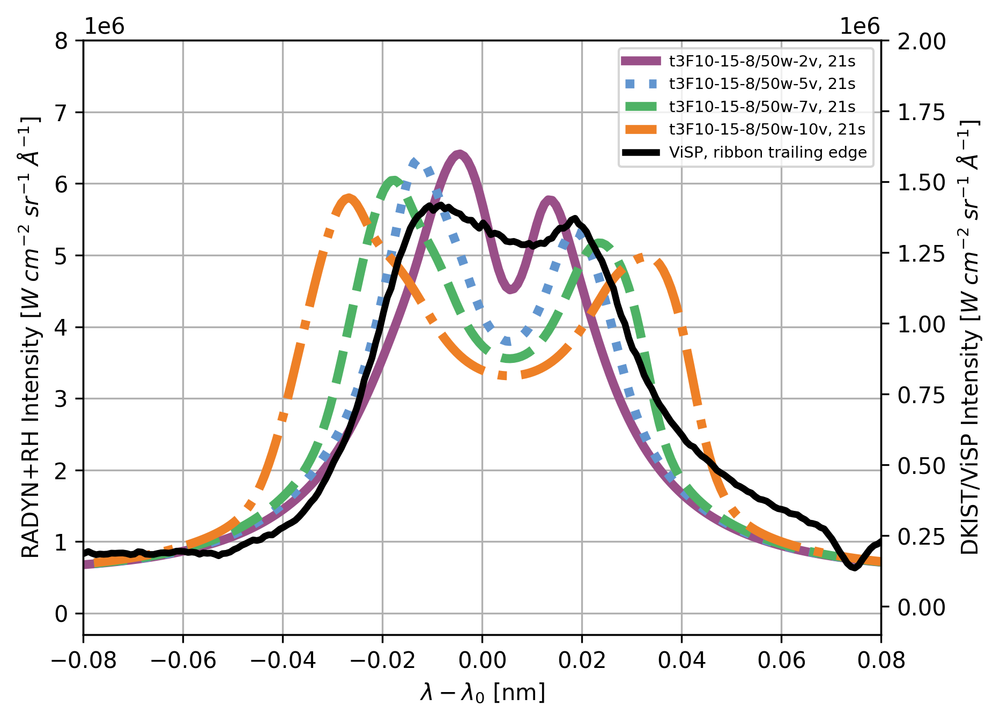

In [130]:
fig,ax=plt.subplots()

colors = plt.cm.ocean(np.linspace(0,1,5))

# lns3 = ax.plot(mod30_3s_wlshift_2vt,mod30_3s_int_2vt,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 3s',c=colors[0])

# lns9 = ax.plot(mod30_17s_wlshift_2vt,mod30_19s_int_2vt,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 19s',c=colors[1])

mod30_21s_int_2vt
mod30_21s_wlshift_2vt

lns11 = ax.plot(dkist_wl_shift2,yconv_2vt,'-',alpha=1,label=r't3F10-15-8/50w-2v, 21s',c=cmap_choice[4],linewidth=4)
lns12 = ax.plot(dkist_wl_shift2,yconv_5vt,':',alpha=1,label=r't3F10-15-8/50w-5v, 21s',c=cmap_choice[8],linewidth=4)
lns13 = ax.plot(dkist_wl_shift2,yconv_7vt,'--',alpha=1,label=r't3F10-15-8/50w-7v, 21s',c=cmap_choice[10],linewidth=4)
lns14 = ax.plot(dkist_wl_shift2,yconv_10vt,'-.',alpha=1,label=r't3F10-15-8/50w-10v, 21s',c=cmap_choice[16],linewidth=4)

ax1 = ax.twinx()
#lns15 = ax1.plot(dkist_wl_shift2,dkist_int[caiih_inds_dkist],label='ViSP, ribbon center',linewidth=4,c=colors[1])
lns16 = ax1.plot(dkist_wl_shift2,dkist_int_trail[caiih_inds_dkist],label='ViSP, ribbon trailing edge',linewidth=3,c='black',alpha=1)
#lns17 = ax1.plot(dkist_wl_shift2,dkist_int_front[caiih_inds_dkist],label='ViSP, ribbon front',linewidth=4,c=colors[0])


#lns4 = ax.plot(rh_wl_shift30,rh_int30_2vt_300broadc,'-*',alpha=0.8,label=r'RH, $300*g_{stark}$, $v_{turb}=2\; km\; s^{-1}$',c='orange')
ax.set_xlim([-0.08,0.08])
#ax0.set_xlim([-0.1,0.1])
ax.set_xlabel(r'$\lambda - \lambda_0$ [nm]')
#ax0.set_ylabel(r'Intensity $[W\;cm^{-2}\;\AA^{-1}\;sr^{-1}]$')
ax.set_ylabel(r'RADYN+RH Intensity $[W\;cm^{-2}\;sr^{-1}\;\AA^{-1}]$')
ax1.set_ylabel(r'DKIST/ViSP Intensity $[W\;cm^{-2}\;sr^{-1}\;\AA^{-1}]$')

lns = lns11+lns12+lns13+lns14+lns16
labs = [l.get_label() for l in lns]
ax.legend(lns,labs,loc=0,fontsize=7)

ax.set_ylim([-.3e6,8e6])

ax1.set_ylim([-.1e6,2e6])
#ax0.set_ylim([0,4e6])

ax.grid()

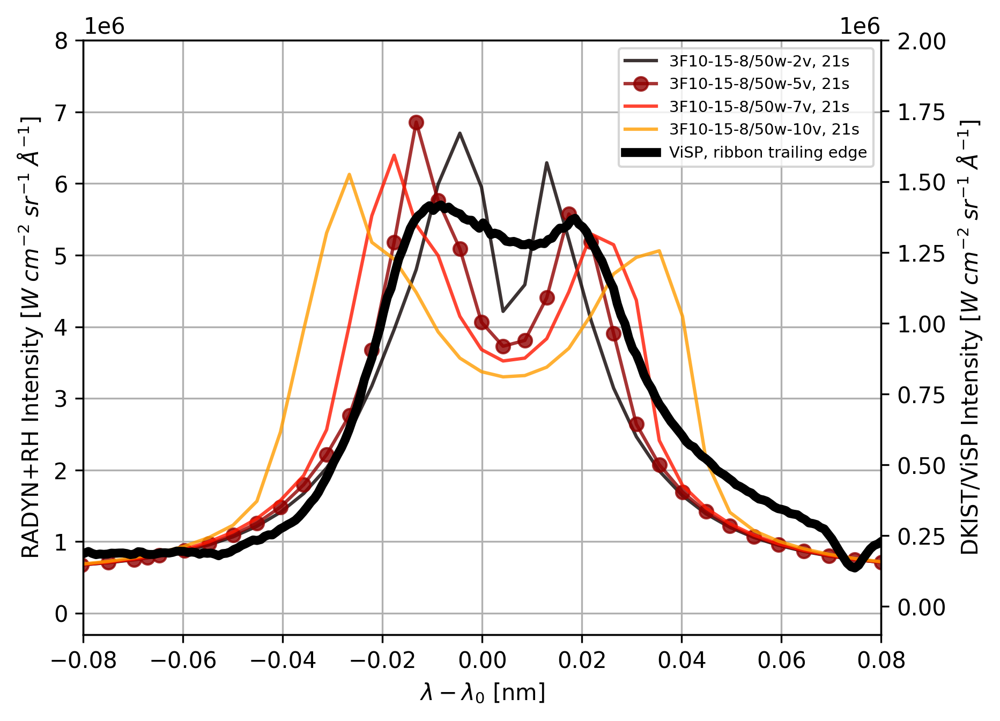

In [132]:
fig,ax=plt.subplots()

colors = plt.cm.hot(np.linspace(0,1,6))

# lns3 = ax.plot(mod30_3s_wlshift_2vt,mod30_3s_int_2vt,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 3s',c=colors[0])

# lns9 = ax.plot(mod30_17s_wlshift_2vt,mod30_19s_int_2vt,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 19s',c=colors[1])

mod30_21s_int_2vt
mod30_21s_wlshift_2vt

lns11 = ax.plot(mod30_21s_wlshift_2vt,mod30_21s_int_2vt,'-',alpha=0.8,label=r'3F10-15-8/50w-2v, 21s',c=colors[0])
lns12 = ax.plot(mod30_21s_wlshift_5vt,mod30_21s_int_5vt,'-o',alpha=0.8,label=r'3F10-15-8/50w-5v, 21s',c=colors[1])
lns13 = ax.plot(mod30_21s_wlshift_7vt,mod30_21s_int_7vt,'-',alpha=0.8,label=r'3F10-15-8/50w-7v, 21s',c=colors[2])
lns14 = ax.plot(mod30_21s_wlshift_10vt,mod30_21s_int_10vt,'-',alpha=0.8,label=r'3F10-15-8/50w-10v, 21s',c=colors[3])

ax1 = ax.twinx()
#lns15 = ax1.plot(dkist_wl_shift2,dkist_int[caiih_inds_dkist],label='ViSP, ribbon center',linewidth=4,c=colors[1])
lns16 = ax1.plot(dkist_wl_shift2,dkist_int_trail[caiih_inds_dkist],label='ViSP, ribbon trailing edge',linewidth=4,c='black')
#lns17 = ax1.plot(dkist_wl_shift2,dkist_int_front[caiih_inds_dkist],label='ViSP, ribbon front',linewidth=4,c=colors[0])


#lns4 = ax.plot(rh_wl_shift30,rh_int30_2vt_300broadc,'-*',alpha=0.8,label=r'RH, $300*g_{stark}$, $v_{turb}=2\; km\; s^{-1}$',c='orange')
ax.set_xlim([-0.08,0.08])
#ax0.set_xlim([-0.1,0.1])
ax.set_xlabel(r'$\lambda - \lambda_0$ [nm]')
#ax0.set_ylabel(r'Intensity $[W\;cm^{-2}\;\AA^{-1}\;sr^{-1}]$')
ax.set_ylabel(r'RADYN+RH Intensity $[W\;cm^{-2}\;sr^{-1}\;\AA^{-1}]$')
ax1.set_ylabel(r'DKIST/ViSP Intensity $[W\;cm^{-2}\;sr^{-1}\;\AA^{-1}]$')

lns = lns11+lns12+lns13+lns14+lns16
labs = [l.get_label() for l in lns]
ax.legend(lns,labs,loc=0,fontsize=7)

ax.set_ylim([-.3e6,8e6])

ax1.set_ylim([-.1e6,2e6])
#ax0.set_ylim([0,4e6])

ax.grid()

In [134]:
ncol_mod = 9
map_mod = tol_colors.tol_cmap(colormap='rainbow_discrete',lut=ncol_mod+4)
cmap_choice_mod = map_mod(np.linspace(0,1,11))

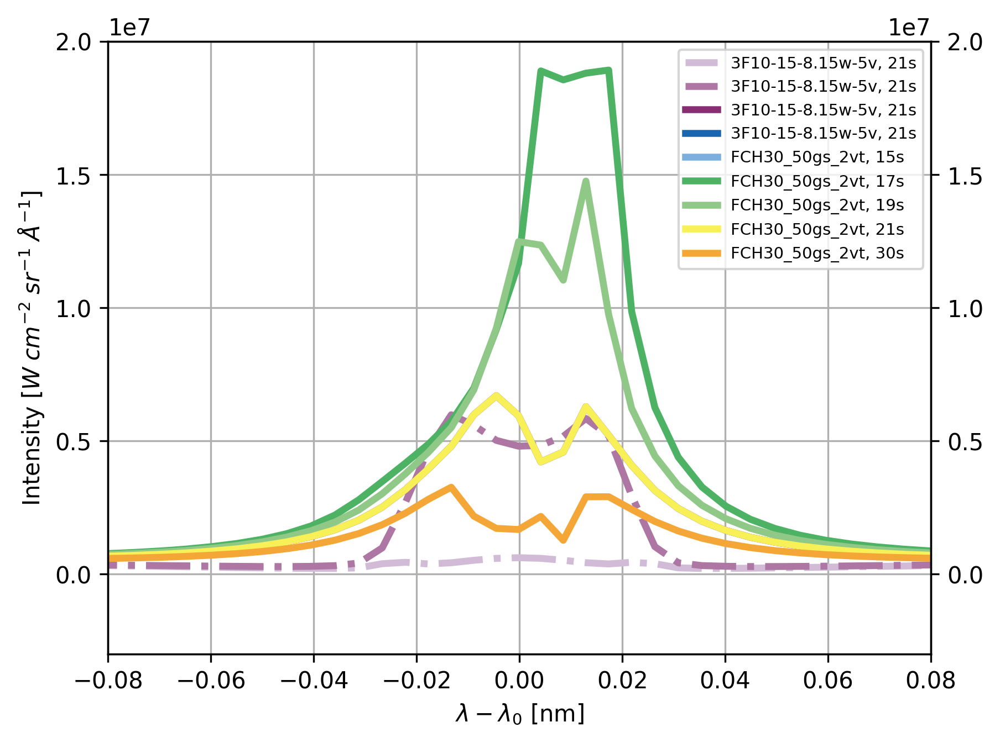

In [136]:
fig,ax=plt.subplots()

colors = plt.cm.cool(np.linspace(0,1,9))

lns2 = ax.plot(mod30_1s_wlshift_2vt,mod30_1s_int_2vt,'-.',alpha=1,label=r'3F10-15-8.15w-5v, 21s',c=cmap_choice_mod[0],linewidth=3)
lns3 = ax.plot(mod30_3s_wlshift_2vt,mod30_3s_int_2vt,'-.',alpha=1,label=r'3F10-15-8.15w-5v, 21s',c=cmap_choice_mod[1],linewidth=3)
lns5 = ax.plot(mod30_7s_wlshift_2vt,mod30_7s_int_2vt,'-',alpha=1,label=r'3F10-15-8.15w-5v, 21s',c=cmap_choice_mod[2],linewidth=3)
lns7 = ax.plot(mod30_11s_wlshift_2vt,mod30_11s_int_2vt,'-',alpha=1,label=r'3F10-15-8.15w-5v, 21s',c=cmap_choice_mod[3],linewidth=3)
lns8 = ax.plot(mod30_15s_wlshift_2vt,mod30_15s_int_2vt,'-',alpha=1,label=r'FCH30_50gs_2vt, 15s',c=cmap_choice_mod[4],linewidth=3)
lns9 = ax.plot(mod30_17s_wlshift_2vt,mod30_17s_int_2vt,'-',alpha=1,label=r'FCH30_50gs_2vt, 17s',c=cmap_choice_mod[5],linewidth=3)
lns10 = ax.plot(mod30_19s_wlshift_2vt,mod30_19s_int_2vt,'-',alpha=1,label=r'FCH30_50gs_2vt, 19s',c=cmap_choice_mod[6],linewidth=3)
lns11 = ax.plot(mod30_21s_wlshift_2vt,mod30_21s_int_2vt,'-',alpha=1,label=r'FCH30_50gs_2vt, 21s',c=cmap_choice_mod[7],linewidth=3)
#lns12 = ax.plot(mod30_25s_wlshift_2vt,mod30_25s_int_2vt,'--',alpha=0.8,label=r'FCH30_50gs_2vt, 25s',c=colors[10])
lns13 = ax.plot(mod30_30s_wlshift_2vt,mod30_30s_int_2vt,'-',alpha=1,label=r'FCH30_50gs_2vt, 30s',c=cmap_choice_mod[8],linewidth=3)
#lns14 = ax.plot(mod30_35s_wlshift_2vt,mod30_35s_int_2vt,'--',alpha=0.8,label=r'Model 30, $50*g_{stark}$, $v_{turb}=2\;km\; s^{-1}$, 35s',c=colors[12])

ax1 = ax.twinx()
# lns15 = ax1.plot(dkist_wl_shift2,dkist_int[caiih_inds_dkist],label='ViSP, ribbon center',linewidth=4,c='pink')
# lns16 = ax1.plot(dkist_wl_shift2,dkist_int_trail[caiih_inds_dkist],label='ViSP, ribbon trailing edge',linewidth=4,c='black')
# lns17 = ax1.plot(dkist_wl_shift2,dkist_int_front[caiih_inds_dkist],label='ViSP, ribbon front',linewidth=4,c='cyan')


#lns4 = ax.plot(rh_wl_shift30,rh_int30_2vt_300broadc,'-*',alpha=0.8,label=r'RH, $300*g_{stark}$, $v_{turb}=2\; km\; s^{-1}$',c='orange')
ax.set_xlim([-0.08,0.08])
#ax0.set_xlim([-0.1,0.1])
ax.set_xlabel(r'$\lambda - \lambda_0$ [nm]')
#ax0.set_ylabel(r'Intensity $[W\;cm^{-2}\;\AA^{-1}\;sr^{-1}]$')
ax.set_ylabel(r'Intensity $[W\;cm^{-2}\;sr^{-1}\;\AA^{-1}]$')


lns = lns2+lns3+lns5+lns7+lns8+lns9+lns10+lns11+lns13
labs = [l.get_label() for l in lns]
ax.legend(lns,labs,loc=0,fontsize=7)

ax.set_ylim([-3e6,20e6])

ax1.set_ylim([-3e6,20e6])
#ax0.set_ylim([0,4e6])

ax.grid()

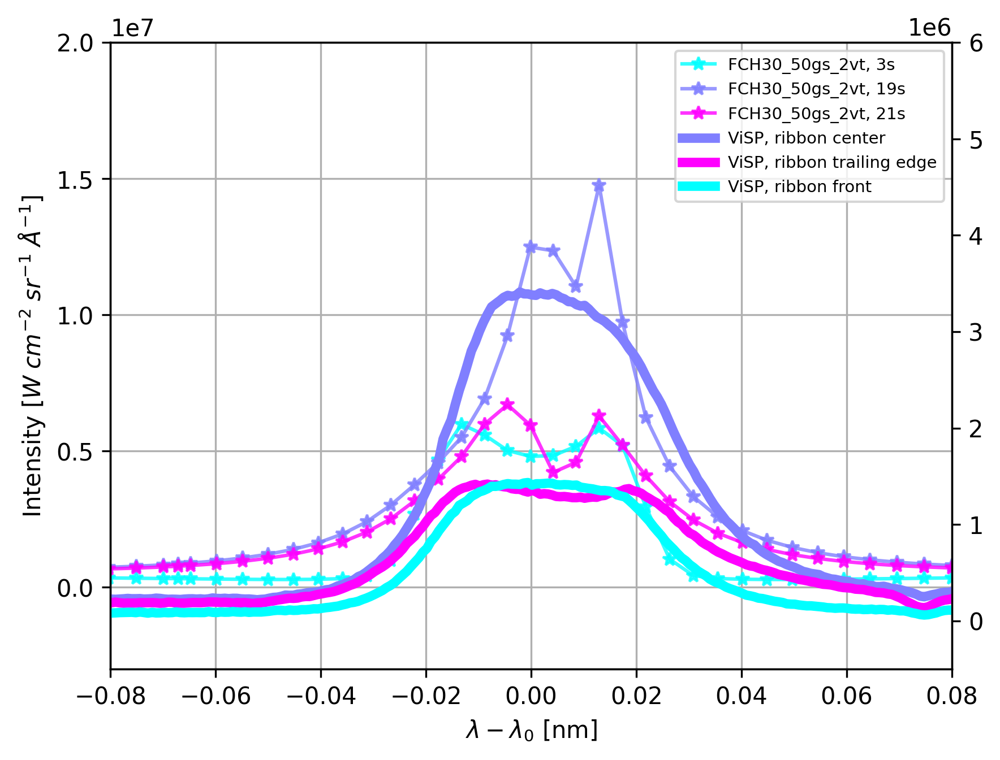

In [138]:
fig,ax=plt.subplots()

colors = plt.cm.cool(np.linspace(0,1,3))

lns3 = ax.plot(mod30_3s_wlshift_2vt,mod30_3s_int_2vt,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 3s',c=colors[0])

lns9 = ax.plot(mod30_17s_wlshift_2vt,mod30_19s_int_2vt,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 19s',c=colors[1])

#lns11 = ax.plot(mod30_21s_wlshift_2vt,mod30_21s_int_2vt,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 21s',c=colors[])
lns12 = ax.plot(mod30_25s_wlshift_2vt,mod30_21s_int_2vt,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 21s',c=colors[2])
#lns13 = ax.plot(mod30_30s_wlshift_2vt,mod30_30s_int_2vt,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 30s',c=colors[8])
#lns14 = ax.plot(mod30_35s_wlshift_2vt,mod30_35s_int_2vt,'-*',alpha=0.8,label=r'Model 30, $50*g_{stark}$, $v_{turb}=2\;km\; s^{-1}$, 35s',c=colors[12])

ax1 = ax.twinx()
lns15 = ax1.plot(dkist_wl_shift2,dkist_int[caiih_inds_dkist],label='ViSP, ribbon center',linewidth=4,c=colors[1])
lns16 = ax1.plot(dkist_wl_shift2,dkist_int_trail[caiih_inds_dkist],label='ViSP, ribbon trailing edge',linewidth=4,c=colors[2])
lns17 = ax1.plot(dkist_wl_shift2,dkist_int_front[caiih_inds_dkist],label='ViSP, ribbon front',linewidth=4,c=colors[0])


#lns4 = ax.plot(rh_wl_shift30,rh_int30_2vt_300broadc,'-*',alpha=0.8,label=r'RH, $300*g_{stark}$, $v_{turb}=2\; km\; s^{-1}$',c='orange')
ax.set_xlim([-0.08,0.08])
#ax0.set_xlim([-0.1,0.1])
ax.set_xlabel(r'$\lambda - \lambda_0$ [nm]')
#ax0.set_ylabel(r'Intensity $[W\;cm^{-2}\;\AA^{-1}\;sr^{-1}]$')
ax.set_ylabel(r'Intensity $[W\;cm^{-2}\;sr^{-1}\;\AA^{-1}]$')


lns = lns3+lns9+lns12+lns15+lns16+lns17
labs = [l.get_label() for l in lns]
ax.legend(lns,labs,loc=0,fontsize=7)

ax.set_ylim([-3e6,20e6])

ax1.set_ylim([-.5e6,6e6])
#ax0.set_ylim([0,4e6])

ax.grid()

In [139]:
fwhm = .005 # in nm
ntw = 45

yconv_5s=psf_adjust(mod30_5s_wlshift,mod30_5s_int,fwhm,dkist_wl_shift2,ntw,
                               gaussian_psf)
yconv_7s=psf_adjust(mod30_7s_wlshift,mod30_7s_int,fwhm,dkist_wl_shift2,ntw,
                               gaussian_psf)
yconv_17s=psf_adjust(mod30_17s_wlshift,mod30_17s_int,fwhm,dkist_wl_shift2,ntw,
                               gaussian_psf)
yconv_19s=psf_adjust(mod30_19s_wlshift,mod30_19s_int,fwhm,dkist_wl_shift2,ntw,
                               gaussian_psf)
yconv_21s=psf_adjust(mod30_21s_wlshift,mod30_21s_int,fwhm,dkist_wl_shift2,ntw,
                               gaussian_psf)
yconv_30s=psf_adjust(mod30_30s_wlshift,mod30_30s_int,fwhm,dkist_wl_shift2,ntw,
                               gaussian_psf)

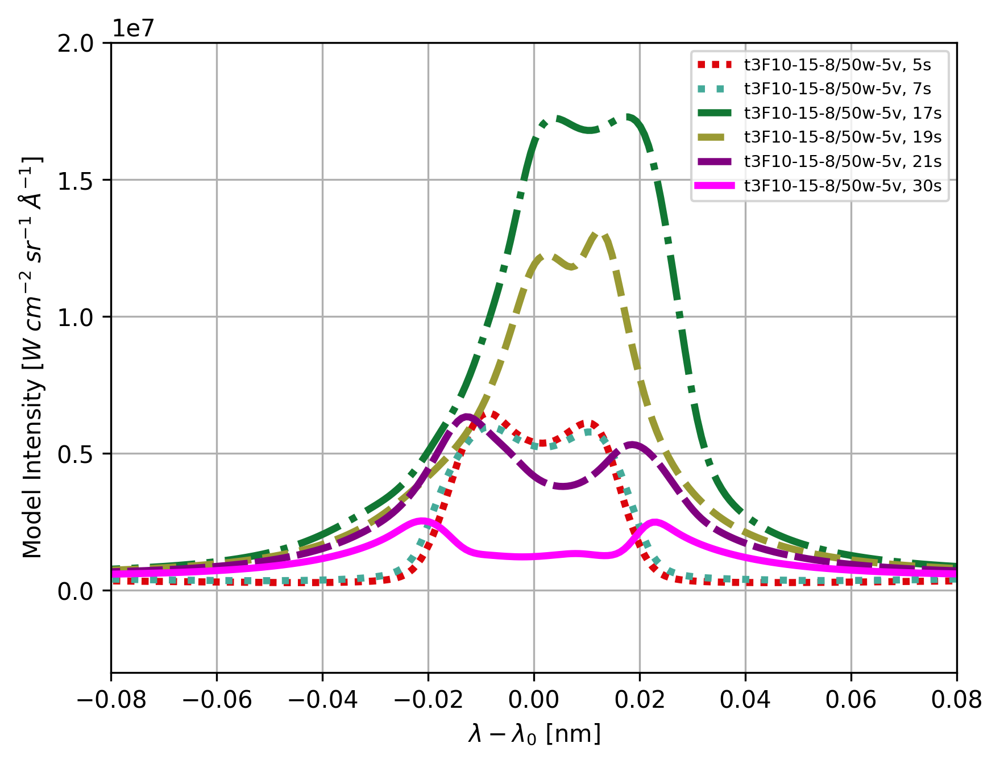

In [142]:
fig,ax=plt.subplots()
# lns6 = ax.plot(dkist_wl_shift2,dkist_int[caiih_inds_dkist],label='ViSP, ribbon center',linewidth=4,c='pink')
# lns0 = ax.plot(dkist_wl_shift2,dkist_int_trail[caiih_inds_dkist],label='ViSP, ribbon trailing edge',linewidth=4,c='black')
# lns0 = ax.plot(dkist_wl_shift2,dkist_int_front[caiih_inds_dkist],label='ViSP, ribbon front',linewidth=4,c='cyan')

#ax.plot(selwlshift,gauss2fitynorm,'-.',color='#EE7733',label='Model')
# ax.plot(selwlshift,comp1fitynorm,'-.',color='#33BBEE',label='Component 1')
# ax.plot(selwlshift,comp2fitynorm,'-.',color='#CC3311',label='Component 2')
colors = ['#332288','#88CCEE','#44AA99','#117733','#999933','#DDCC77','#CC6677','#882255','#AA4499']
#ax0 = ax.twinx()
#lns1 = ax.plot(rh_wl_shift30,rh_int30_2vt_30broadc,'-*',alpha=0.8,label=r'RH, $30*g_{stark}$, $v_{turb}=2\; km\; s^{-1}$',c='red')
#lns2 = ax.plot(mod30_1s_wlshift,mod30_1s_int,'-*',alpha=0.8,label=r'Model 30, $50*g_{stark}$, $v_{turb}=5\;km\; s^{-1}$, 1s',c=colors[0])
lns3 = ax.plot(dkist_wl_shift2,yconv_5s,linestyle=(0, (1, 1)),linewidth=3,label=r't3F10-15-8/50w-5v, 5s',markersize=4,c=cmap_choice_mod[10])
lns4 = ax.plot(dkist_wl_shift2,yconv_7s,':',linewidth=3,label=r't3F10-15-8/50w-5v, 7s',markersize=4,c=colors[2])
lns5 = ax.plot(dkist_wl_shift2,yconv_17s,'-.',linewidth=3,label=r't3F10-15-8/50w-5v, 17s',markersize=4,c=colors[3])
lns6 = ax.plot(dkist_wl_shift2,yconv_19s,'--',linewidth=3,label=r't3F10-15-8/50w-5v, 19s',markersize=4,c=colors[4])
lns7 = ax.plot(dkist_wl_shift2,yconv_21s,linestyle=(0, (5, 1)),linewidth=3,label=r't3F10-15-8/50w-5v, 21s',markersize=4,c='purple')
#lns8 = ax.plot(mod30_21s_wlshift,mod30_25s_int,'-*',alpha=0.8,label=r'Model 30, $50*g_{stark}$, $v_{turb}=5\;km\; s^{-1}$, 25s',c=colors[6])
lns9 = ax.plot(dkist_wl_shift2,yconv_30s,linestyle='-',linewidth=3,label=r't3F10-15-8/50w-5v, 30s',markersize=4,c='magenta')
#lns10 = ax.plot(mod30_21s_wlshift,mod30_35s_int,'-*',alpha=0.8,label=r'Model 30, $50*g_{stark}$, $v_{turb}=5\;km\; s^{-1}$, 35s',c=colors[8])

#ax1 = ax.twinx()
# lns11 = ax1.plot(dkist_wl_shift2,dkist_int[caiih_inds_dkist],label='ViSP, ribbon center',linewidth=4,c='pink')
# lns12 = ax1.plot(dkist_wl_shift2,dkist_int_trail[caiih_inds_dkist],label='ViSP, ribbon trailing edge',linewidth=4,c='black')
# lns13 = ax1.plot(dkist_wl_shift2,dkist_int_front[caiih_inds_dkist],label='ViSP, ribbon front',linewidth=4,c='cyan')


#lns4 = ax.plot(rh_wl_shift30,rh_int30_2vt_300broadc,'-*',alpha=0.8,label=r'RH, $300*g_{stark}$, $v_{turb}=2\; km\; s^{-1}$',c='orange')
ax.set_xlim([-0.08,0.08])
#ax0.set_xlim([-0.1,0.1])
ax.set_xlabel(r'$\lambda - \lambda_0$ [nm]')
#ax0.set_ylabel(r'Intensity $[W\;cm^{-2}\;\AA^{-1}\;sr^{-1}]$')
ax.set_ylabel(r'Model Intensity $[W\;cm^{-2}\;sr^{-1}\;\AA^{-1}]$')


lns = lns3+lns4+lns5+lns6+lns7+lns9
labs = [l.get_label() for l in lns]
ax.legend(lns,labs,loc=0,fontsize=7)

ax.set_ylim([-3e6,20e6])

#ax1.set_ylim([-3e6,30e6])
#ax0.set_ylim([0,4e6])

ax.grid()

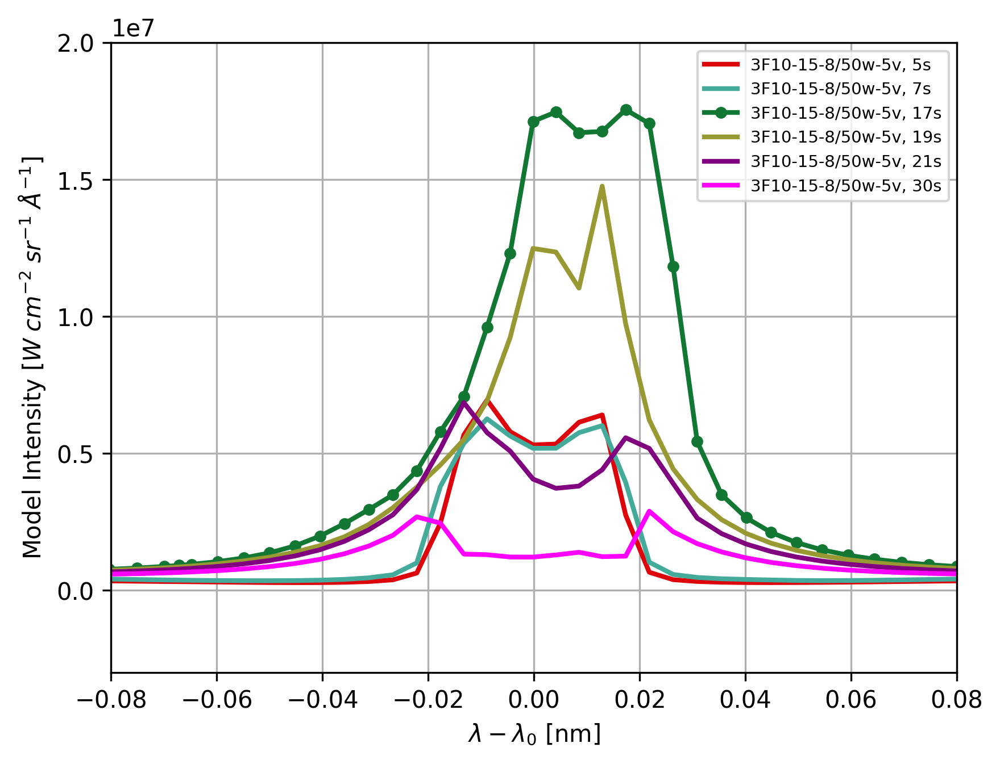

In [995]:
fig,ax=plt.subplots()
# lns6 = ax.plot(dkist_wl_shift2,dkist_int[caiih_inds_dkist],label='ViSP, ribbon center',linewidth=4,c='pink')
# lns0 = ax.plot(dkist_wl_shift2,dkist_int_trail[caiih_inds_dkist],label='ViSP, ribbon trailing edge',linewidth=4,c='black')
# lns0 = ax.plot(dkist_wl_shift2,dkist_int_front[caiih_inds_dkist],label='ViSP, ribbon front',linewidth=4,c='cyan')

#ax.plot(selwlshift,gauss2fitynorm,'-.',color='#EE7733',label='Model')
# ax.plot(selwlshift,comp1fitynorm,'-.',color='#33BBEE',label='Component 1')
# ax.plot(selwlshift,comp2fitynorm,'-.',color='#CC3311',label='Component 2')
colors = ['#332288','#88CCEE','#44AA99','#117733','#999933','#DDCC77','#CC6677','#882255','#AA4499']
#ax0 = ax.twinx()
#lns1 = ax.plot(rh_wl_shift30,rh_int30_2vt_30broadc,'-*',alpha=0.8,label=r'RH, $30*g_{stark}$, $v_{turb}=2\; km\; s^{-1}$',c='red')
#lns2 = ax.plot(mod30_1s_wlshift,mod30_1s_int,'-*',alpha=0.8,label=r'Model 30, $50*g_{stark}$, $v_{turb}=5\;km\; s^{-1}$, 1s',c=colors[0])
lns3 = ax.plot(mod30_5s_wlshift,mod30_5s_int,'-',linewidth=2,label=r'3F10-15-8/50w-5v, 5s',markersize=4,c=cmap_choice_mod[10])
lns4 = ax.plot(mod30_7s_wlshift,mod30_7s_int,'-',linewidth=2,label=r'3F10-15-8/50w-5v, 7s',markersize=4,c=colors[2])
lns5 = ax.plot(mod30_17s_wlshift,mod30_17s_int,'-o',linewidth=2,label=r'3F10-15-8/50w-5v, 17s',markersize=4,c=colors[3])
lns6 = ax.plot(mod30_19s_wlshift,mod30_19s_int,'-',linewidth=2,label=r'3F10-15-8/50w-5v, 19s',markersize=4,c=colors[4])
lns7 = ax.plot(mod30_21s_wlshift,mod30_21s_int,'-',linewidth=2,label=r'3F10-15-8/50w-5v, 21s',markersize=4,c='purple')
#lns8 = ax.plot(mod30_21s_wlshift,mod30_25s_int,'-*',alpha=0.8,label=r'Model 30, $50*g_{stark}$, $v_{turb}=5\;km\; s^{-1}$, 25s',c=colors[6])
lns9 = ax.plot(mod30_21s_wlshift,mod30_30s_int,'-',linewidth=2,label=r'3F10-15-8/50w-5v, 30s',markersize=4,c='magenta')
#lns10 = ax.plot(mod30_21s_wlshift,mod30_35s_int,'-*',alpha=0.8,label=r'Model 30, $50*g_{stark}$, $v_{turb}=5\;km\; s^{-1}$, 35s',c=colors[8])

#ax1 = ax.twinx()
# lns11 = ax1.plot(dkist_wl_shift2,dkist_int[caiih_inds_dkist],label='ViSP, ribbon center',linewidth=4,c='pink')
# lns12 = ax1.plot(dkist_wl_shift2,dkist_int_trail[caiih_inds_dkist],label='ViSP, ribbon trailing edge',linewidth=4,c='black')
# lns13 = ax1.plot(dkist_wl_shift2,dkist_int_front[caiih_inds_dkist],label='ViSP, ribbon front',linewidth=4,c='cyan')


#lns4 = ax.plot(rh_wl_shift30,rh_int30_2vt_300broadc,'-*',alpha=0.8,label=r'RH, $300*g_{stark}$, $v_{turb}=2\; km\; s^{-1}$',c='orange')
ax.set_xlim([-0.08,0.08])
#ax0.set_xlim([-0.1,0.1])
ax.set_xlabel(r'$\lambda - \lambda_0$ [nm]')
#ax0.set_ylabel(r'Intensity $[W\;cm^{-2}\;\AA^{-1}\;sr^{-1}]$')
ax.set_ylabel(r'Model Intensity $[W\;cm^{-2}\;sr^{-1}\;\AA^{-1}]$')


lns = lns3+lns4+lns5+lns6+lns7+lns9
labs = [l.get_label() for l in lns]
ax.legend(lns,labs,loc=0,fontsize=7)

ax.set_ylim([-3e6,20e6])

#ax1.set_ylim([-3e6,30e6])
#ax0.set_ylim([0,4e6])

ax.grid()

In [178]:
def veltrans(x):
    return ((((x+lamb0)/lamb0)-1)*c)/mu

def wltrans(x):
    return ((((x/c)+1)*lamb0)-lamb0)

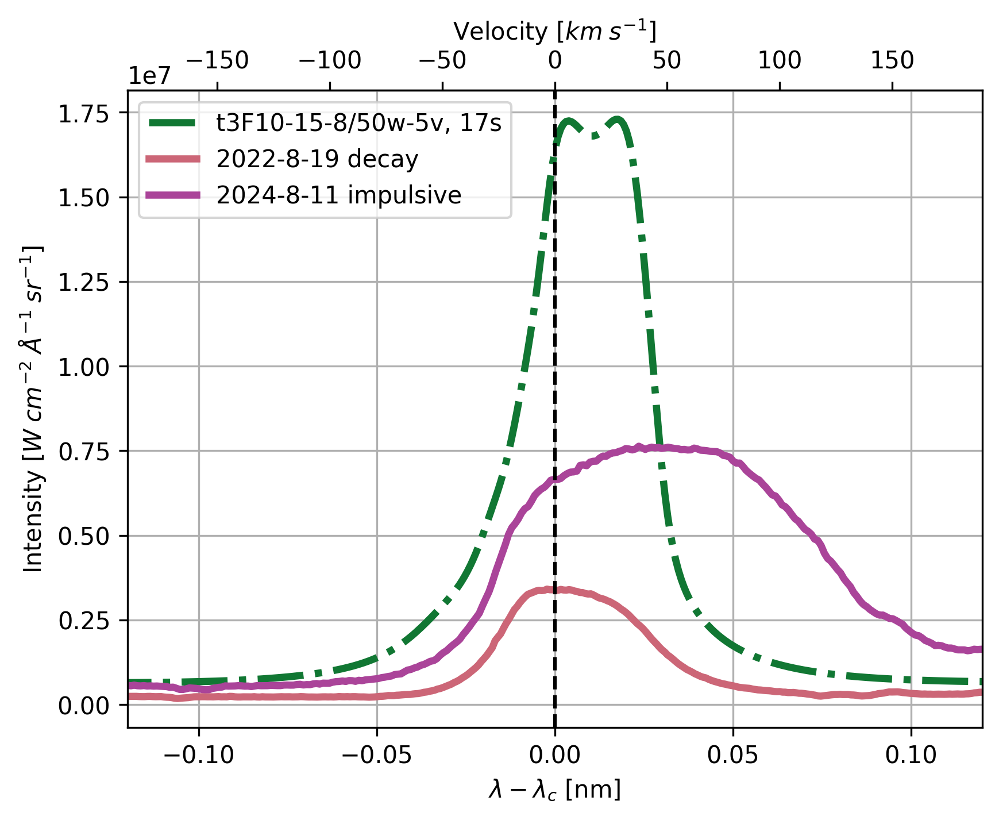

In [228]:
fig,ax=plt.subplots()
colors = ['#332288','#88CCEE','#44AA99','#117733','#999933','#DDCC77','#CC6677','#882255','#AA4499']
lns0 = ax.plot(dkist_wl_shift2,yconv_17s,'-.',markersize=4,label=r't3F10-15-8/50w-5v, 17s',c=colors[3],linewidth=3)
lns1 = ax.plot(dkist_wl_shift2,dkist_int[caiih_inds_dkist],label='2022-8-19 decay',linewidth=3,c=colors[6])
lns2 = ax.plot(dkist_wl_shift2_24,dkist_int24[caiih_inds_dkist24],label='2024-8-11 impulsive',linewidth=3,c=colors[8])
ax.set_xlabel(r'$\lambda - \lambda_c$ [nm]')
secaxx = ax.secondary_xaxis('top', functions=(veltrans,wltrans))
secaxx.set_xlabel(r'Velocity $[km\; s^{-1}]$')
ax.axvline(0,c='black',linestyle='dashed')
ax.set_xlim([-.12,.12])
ax.grid()
ax.set_ylabel(r'Intensity $[W\;cm^{-2}\;\AA^{-1}\;sr^{-1}]$')
ax.legend()

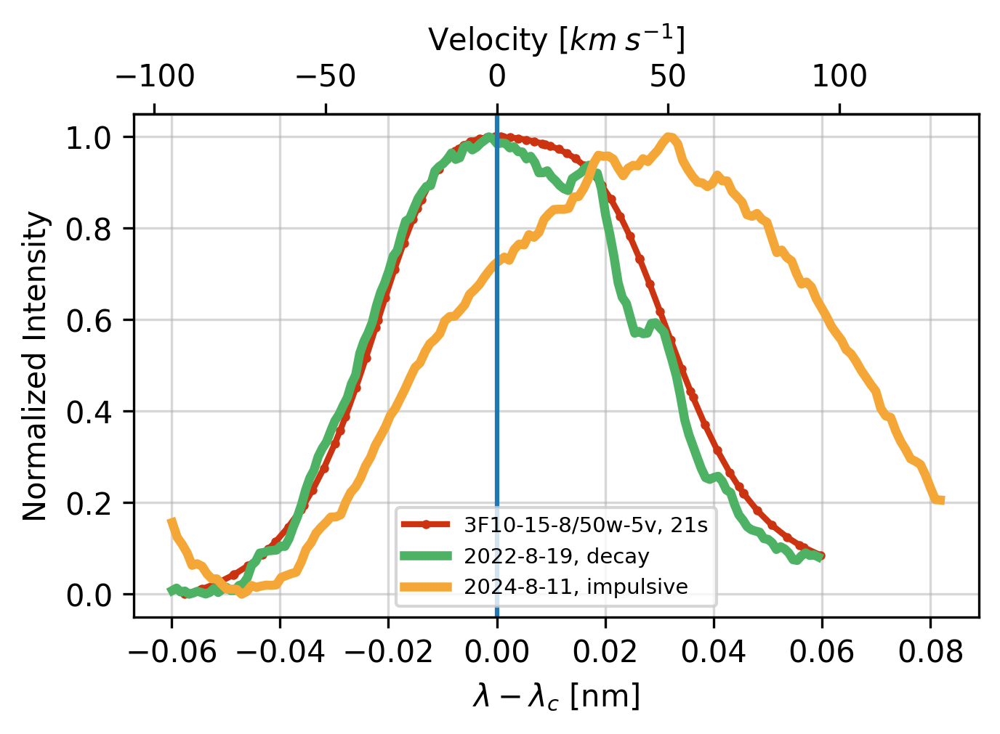

In [230]:
fig,ax=plt.subplots(figsize=(5,3))

colors = plt.cm.cool(np.linspace(0,1,4))

# lns3 = ax.plot(mod30_3s_wlshift_2vt,mod30_3s_int_2vt,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 3s',c=colors[0])

# lns9 = ax.plot(mod30_17s_wlshift_2vt,mod30_19s_int_2vt,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 19s',c=colors[1])

ax.plot(mod30wl_hepshift[hep_inds_rh],normalize(mod30_21s_int_5vt_H20[hep_inds_rh]),'-o',label=r'3F10-15-8/50w-5v, 21s',c='#CC3311',linewidth=2,markersize=2)
ax.plot(dkist_wl_hepshift[hep_inds_dkist],normalize(dkist_int[hep_inds_dkist]),label='2022-8-19, decay',linewidth=3,c=cmap_choice[10])
ax.plot(dkist_wl_shift_hep2_24,normalize(dkist_int24[hep_inds_dkist24]),c=cmap_choice[15],label='2024-8-11, impulsive',linewidth=3)
ax.set_ylabel(r'Normalized Intensity',fontsize=10)
ax.set_xlabel(r'$\lambda-\lambda_0$',fontsize=10)
ax.set_xlabel(r'$\lambda - \lambda_c$ [nm]')
ax.axvline(0)
secaxx = ax.secondary_xaxis('top', functions=(veltrans,wltrans))
secaxx.set_xlabel(r'Velocity $[km\; s^{-1}]$')
ax.legend(loc=0,fontsize=7)
ax.grid(alpha=.5)

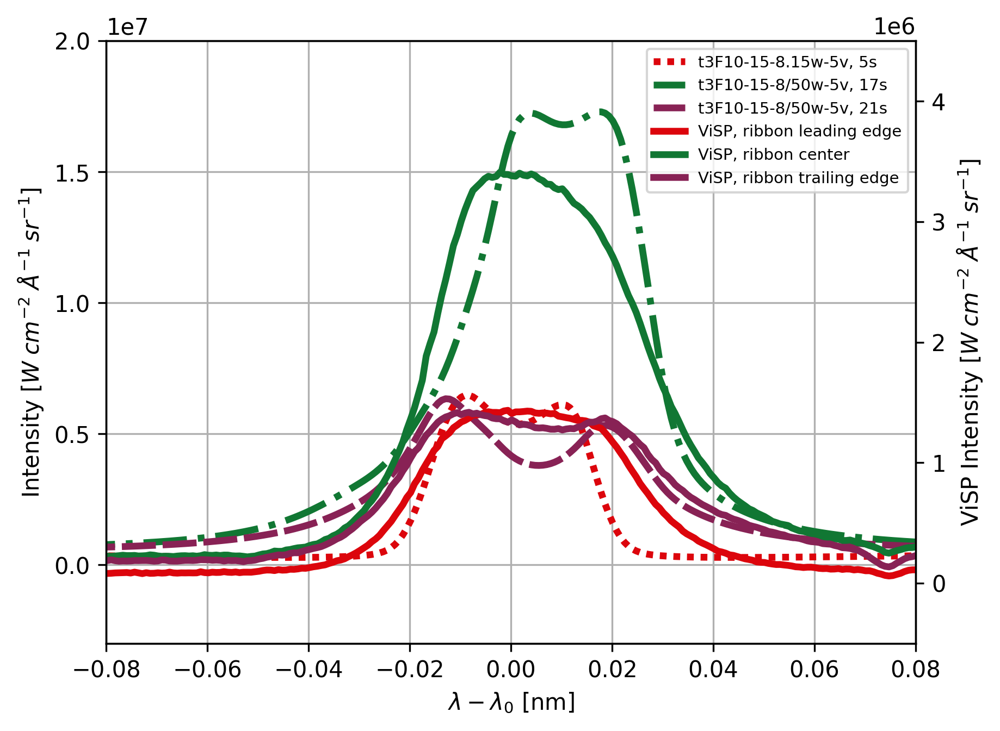

In [1209]:
fig,ax=plt.subplots()


colors = ['#332288','#88CCEE','#44AA99','#117733','#999933','#DDCC77','#CC6677','#882255','#AA4499']

lns3 = ax.plot(dkist_wl_shift2,yconv_5s,linestyle=(0, (1, 1)),label=r't3F10-15-8.15w-5v, 5s',c=cmap_choice_mod[10],linewidth=3)

lns9 = ax.plot(dkist_wl_shift2,yconv_17s,'-.',markersize=4,label=r't3F10-15-8/50w-5v, 17s',c=colors[3],linewidth=3)

#lns11 = ax.plot(mod30_21s_wlshift_2vt,mod30_21s_int_2vt,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 21s',c=colors[])
lns12 = ax.plot(dkist_wl_shift2,yconv_21s,linestyle=(0, (5, 1)),markersize=2,label=r't3F10-15-8/50w-5v, 21s',c=colors[7],linewidth=3)
#lns13 = ax.plot(mod30_30s_wlshift_2vt,mod30_30s_int_2vt,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 30s',c=colors[8])
#lns14 = ax.plot(mod30_35s_wlshift_2vt,mod30_35s_int_2vt,'-*',alpha=0.8,label=r'Model 30, $50*g_{stark}$, $v_{turb}=2\;km\; s^{-1}$, 35s',c=colors[12])

ax1 = ax.twinx()
lns17 = ax1.plot(dkist_wl_shift2,dkist_int_front[caiih_inds_dkist],label='ViSP, ribbon leading edge',linewidth=3,c=cmap_choice_mod[10])
lns15 = ax1.plot(dkist_wl_shift2,dkist_int[caiih_inds_dkist],label='ViSP, ribbon center',linewidth=3,c=colors[3])
lns16 = ax1.plot(dkist_wl_shift2,dkist_int_trail[caiih_inds_dkist],label='ViSP, ribbon trailing edge',linewidth=3,c=colors[7])


#lns4 = ax.plot(rh_wl_shift30,rh_int30_2vt_300broadc,'-*',alpha=0.8,label=r'RH, $300*g_{stark}$, $v_{turb}=2\; km\; s^{-1}$',c='orange')
ax.set_xlim([-0.08,0.08])
#ax0.set_xlim([-0.1,0.1])
ax.set_xlabel(r'$\lambda - \lambda_0$ [nm]')
ax1.set_ylabel(r'ViSP Intensity $[W\;cm^{-2}\;\AA^{-1}\;sr^{-1}]$')
ax.set_ylabel(r'Intensity $[W\;cm^{-2}\;\AA^{-1}\;sr^{-1}]$')


lns = lns3+lns9+lns12+lns17+lns15+lns16
labs = [l.get_label() for l in lns]
ax.legend(lns,labs,loc=0,fontsize=7)

ax.set_ylim([-3.0e6,20e6])

ax1.set_ylim([-.5e6,4.5e6])
#ax0.set_ylim([0,4e6])

ax.grid()

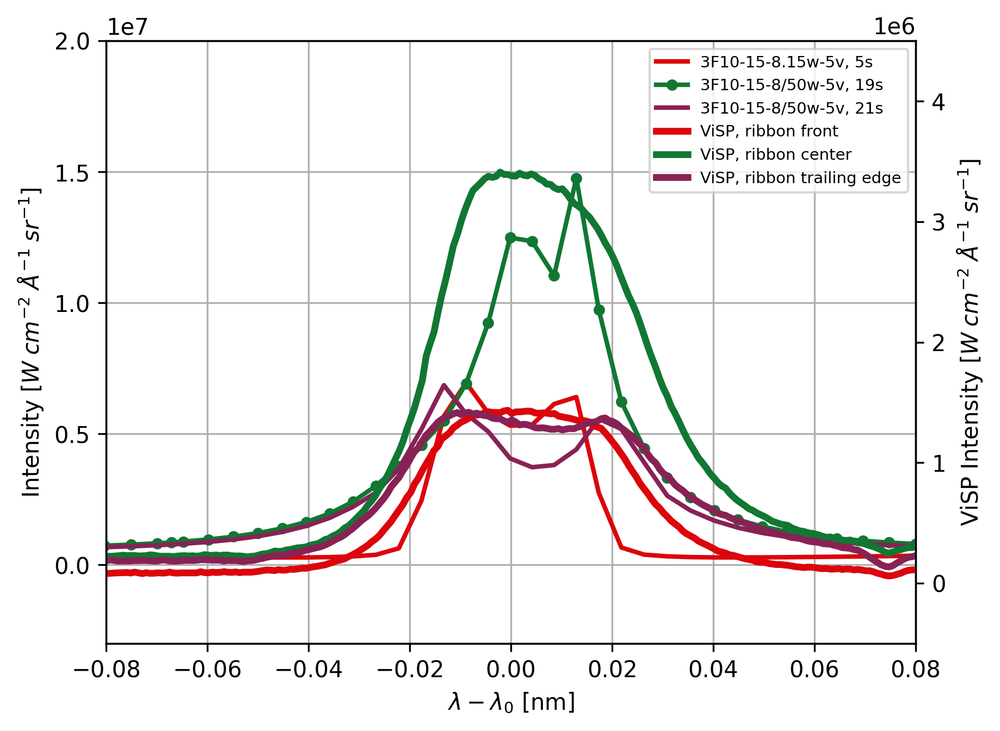

In [999]:
fig,ax=plt.subplots()

colors = ['#332288','#88CCEE','#44AA99','#117733','#999933','#DDCC77','#CC6677','#882255','#AA4499']

lns3 = ax.plot(mod30_5s_wlshift,mod30_5s_int,'-',label=r'3F10-15-8.15w-5v, 5s',c=cmap_choice_mod[10],linewidth=2)

lns9 = ax.plot(mod30_17s_wlshift,mod30_19s_int,'-o',markersize=4,label=r'3F10-15-8/50w-5v, 19s',c=colors[3],linewidth=2)

#lns11 = ax.plot(mod30_21s_wlshift_2vt,mod30_21s_int_2vt,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 21s',c=colors[])
lns12 = ax.plot(mod30_21s_wlshift,mod30_21s_int,'-',markersize=2,label=r'3F10-15-8/50w-5v, 21s',c=colors[7],linewidth=2)
#lns13 = ax.plot(mod30_30s_wlshift_2vt,mod30_30s_int_2vt,'-*',alpha=0.8,label=r'FCH30_50gs_2vt, 30s',c=colors[8])
#lns14 = ax.plot(mod30_35s_wlshift_2vt,mod30_35s_int_2vt,'-*',alpha=0.8,label=r'Model 30, $50*g_{stark}$, $v_{turb}=2\;km\; s^{-1}$, 35s',c=colors[12])

ax1 = ax.twinx()
lns17 = ax1.plot(dkist_wl_shift2,dkist_int_front[caiih_inds_dkist],label='ViSP, ribbon front',linewidth=3,c=cmap_choice_mod[10])
lns15 = ax1.plot(dkist_wl_shift2,dkist_int[caiih_inds_dkist],label='ViSP, ribbon center',linewidth=3,c=colors[3])
lns16 = ax1.plot(dkist_wl_shift2,dkist_int_trail[caiih_inds_dkist],label='ViSP, ribbon trailing edge',linewidth=3,c=colors[7])


#lns4 = ax.plot(rh_wl_shift30,rh_int30_2vt_300broadc,'-*',alpha=0.8,label=r'RH, $300*g_{stark}$, $v_{turb}=2\; km\; s^{-1}$',c='orange')
ax.set_xlim([-0.08,0.08])
#ax0.set_xlim([-0.1,0.1])
ax.set_xlabel(r'$\lambda - \lambda_0$ [nm]')
ax1.set_ylabel(r'ViSP Intensity $[W\;cm^{-2}\;\AA^{-1}\;sr^{-1}]$')
ax.set_ylabel(r'Intensity $[W\;cm^{-2}\;\AA^{-1}\;sr^{-1}]$')


lns = lns3+lns9+lns12+lns17+lns15+lns16
labs = [l.get_label() for l in lns]
ax.legend(lns,labs,loc=0,fontsize=7)

ax.set_ylim([-3.0e6,20e6])

ax1.set_ylim([-.5e6,4.5e6])
#ax0.set_ylim([0,4e6])

ax.grid()

In [511]:
mod30_17s_int

array([  650234.01532945,   646913.76956019,   645777.35698254,
         647094.06966963,   651205.38480764,   655421.89395179,
         658552.56036444,   669685.51180861,   685292.72397525,
         706277.53326099,   733811.28595201,   769437.84354381,
         815254.15203341,   874180.95765662,   912006.38808405,
         950531.07230248,  1050743.14202151,  1184843.90583854,
        1368652.22022412,  1625041.32271198,  1979719.78546932,
        2438925.9892487 ,  2953467.1494806 ,  3487852.40341053,
        4366504.79614716,  5796883.28127885,  7081742.971408  ,
        9615315.20715357, 12305701.62026458, 17127175.67039055,
       17468710.3439845 , 16715460.25501295, 16759055.31362412,
       17554978.25336193, 17048184.94633225, 11820674.17596909,
        5433301.67867104,  3496989.92487893,  2652471.57927245,
        2114803.30286463,  1745233.27860578,  1480357.88383478,
        1285000.20853375,  1137821.28493627,  1025205.71631823,
         938081.56118087,   870204.79472

(-3000000.0, 20000000.0)

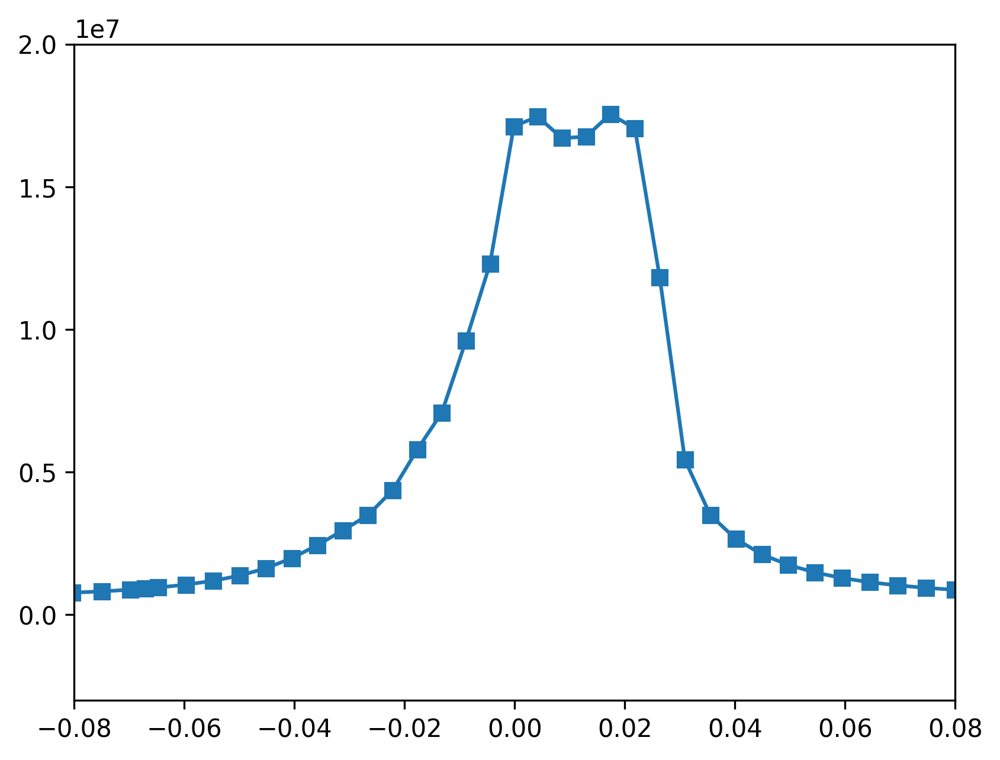

In [533]:
# widths on model
figk,ax = plt.subplots()
ax.plot(mod30_5s_wlshift,mod30_17s_int,'-s')
ax.set_xlim([-0.08,0.08])
ax.set_ylim([-3.0e6,20e6])

In [ ]:
lns3 = ax.plot(mod30_5s_wlshift,mod30_5s_int,'-s',alpha=0.8,label=r'FCH30_50gs_5vt, 5s',markersize=4,c=colors[1])
lns4 = ax.plot(mod30_7s_wlshift,mod30_7s_int,'-s',alpha=0.8,label=r'FCH30_50gs_5vt, 7s',markersize=4,c=colors[2])
lns5 = ax.plot(mod30_17s_wlshift,mod30_17s_int,'-s',alpha=0.8,label=r'FCH30_50gs_5vt, 17s',markersize=4,c=colors[4])
lns6 = ax.plot(mod30_19s_wlshift,mod30_19s_int,'-s',alpha=0.8,label=r'FCH30_50gs_5vt, 19s',markersize=4,c=colors[3])
lns7 = ax.plot(mod30_21s_wlshift,mod30_21s_int,'-s',alpha=0.8,label=r'FCH30_50gs_5vt, 21s',markersize=4,c='magenta')
#lns8 = ax.plot(mod30_21s_wlshift,mod30_25s_int,'-*',alpha=0.8,label=r'Model 30, $50*g_{stark}$, $v_{turb}=5\;km\; s^{-1}$, 25s',c=colors[6])
lns9 = ax.plot(mod30_21s_wlshift,mod30_30s_int,'-s',alpha=0.8,label=r'FCH30_50gs_5vt, 30s',markersize=4,c=colors[7])


In [581]:
from scipy.interpolate import interp1d

sels = []
wlorigs = []
wlsorigs = []
leftindss = []
rightindss = []
levss = []
centroidss = []
centroidss0 = []

sels.append(mod30_5s_int)
sels.append(mod30_7s_int)
sels.append(mod30_17s_int)
sels.append(mod30_19s_int)
sels.append(mod30_21s_int)
sels.append(mod30_30s_int)

wlorigs.append(mod30_5s_wlshift)
wlorigs.append(mod30_7s_wlshift)
wlorigs.append(mod30_17s_wlshift)
wlorigs.append(mod30_19s_wlshift)
wlorigs.append(mod30_21s_wlshift)
wlorigs.append(mod30_30s_wlshift)

wlnew = np.arange(-0.08,0.08,.0001)

for i in range(len(sels)):

    selectint = sels[i]
    selectwl = wlorigs[i]
    f = interp1d(selectwl,selectint)
    
    int_dkist_new = f(wlnew)
    forcentroids = int_dkist_new
    minval = min(forcentroids)
    maxval = max(forcentroids)
    levs = np.linspace(minval,maxval,11)
    
    levss.append(levs)
    
    leftinds = []
    rightinds = []

    for j in levs:
        leftval,leftind = find_nearest(forcentroids[0:round(len(forcentroids)/2)],j)
        rightval,rightind0 = find_nearest(forcentroids[round(len(forcentroids)/2):],j)
        rightind = round(len(forcentroids)/2)+rightind0

        leftinds.append(leftind)
        rightinds.append(rightind)
    
    leftindss.append(leftinds)
    rightindss.append(rightinds)
    
    rightwls = wlnew[rightinds]
    leftwls = wlnew[leftinds]

    centroids = []
    centroids0 = []

    for j in range(len(rightwls)):
        rightwl = rightwls[j]
        leftwl = leftwls[j]
        centroids.append(np.mean([rightwl,leftwl]))
        centroids0.append(np.mean([rightwl,leftwl])-396.85)

    centroidss.append(centroids)
    centroidss0.append(centroids0)



In [589]:
centroidss

[[-0.00014999999999771446,
  -9.999999999771303e-05,
  5.000000000229127e-05,
  0.00015000000000229413,
  5.000000000229127e-05,
  0.0001000000000022927,
  0.00015000000000229413,
  0.00020000000000229556,
  0.005550000000002449,
  -0.0002499999999977173,
  0.002000000000002347],
 [0.0022500000000023543,
  -4.99999999977116e-05,
  -9.999999999771303e-05,
  -9.999999999771303e-05,
  -9.999999999771303e-05,
  -9.999999999771303e-05,
  2.2898349882893854e-15,
  0.000250000000002297,
  0.0004000000000023013,
  0.0015500000000023342,
  0.0020500000000023486],
 [-4.99999999977116e-05,
  0.0031000000000023786,
  0.005300000000002442,
  0.006500000000002476,
  0.00840000000000253,
  0.009300000000002556,
  0.010050000000002578,
  0.010700000000002596,
  0.010750000000002598,
  0.010750000000002598,
  0.008650000000002538],
 [-4.99999999977116e-05,
  0.00280000000000237,
  0.0032000000000023815,
  0.00455000000000242,
  0.005500000000002447,
  0.00630000000000247,
  0.006700000000002482,
  0.00

Text(0.5, 1.0, 'Variation of emission line bisector position across flare ribbon')

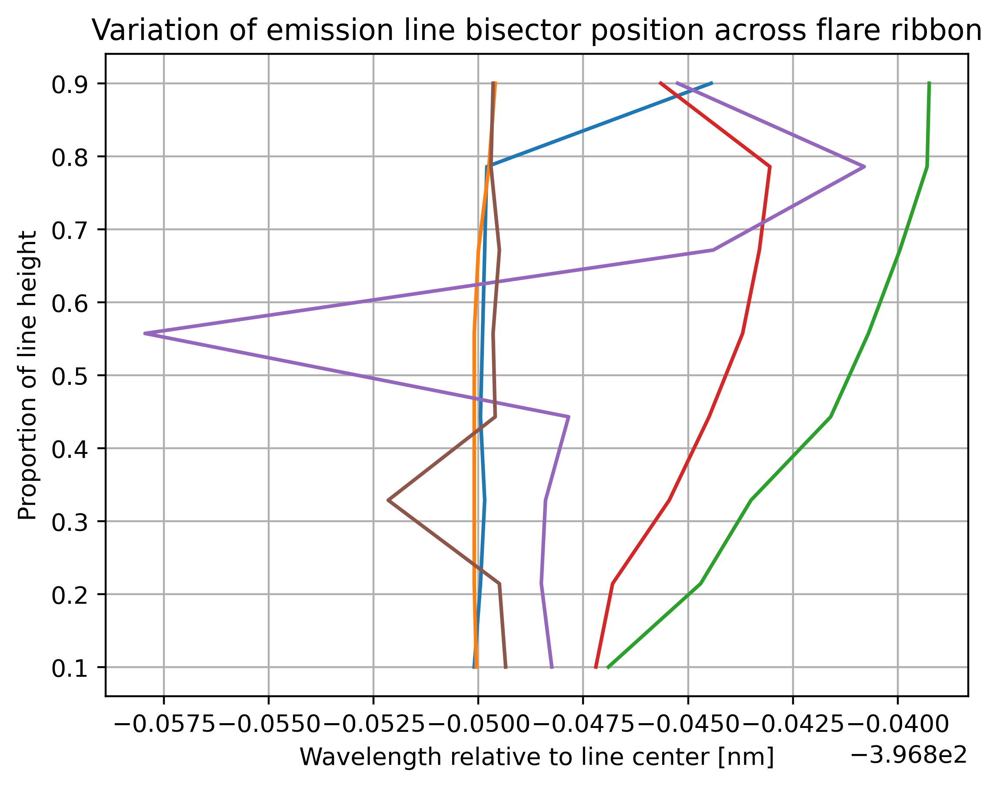

In [601]:
fig,ax=plt.subplots(dpi=400)

lamb0 = 396.847
c=2.99e5
def veltrans(x):
    return ((((x+lamb0)/lamb0)-1)*c)/mu
    #return ((((x+lamb0)/lamb0)-1)*c) #old, no mu angle difference

def wltrans(x):
    return ((((x/c)+1)*lamb0)-lamb0)


n = 6

colors = plt.cm.rainbow(np.linspace(0,1,n))

for i in range(n):
    #ax.plot(centroidss0[i][1:-2],np.linspace(.1,.9,8),marker='s',color=colors[i])
    ax.plot(centroidss0[i][1:-2],np.linspace(.1,.9,8))
    # secaxx = ax.secondary_xaxis('top', functions=(veltrans,wltrans))
    # secaxx.set_xlabel(r'Velocity $[km\; s^{-1}]$')
ax.grid()
# ax.axvline(0,color='#332288')
ax.set_xlabel('Wavelength relative to line center [nm]')
ax.set_ylabel('Proportion of line height')
ax.set_title('Variation of emission line bisector position across flare ribbon')

In [559]:
forcentroids = int_dkist_new 
minval = min(forcentroids)
maxval = max(forcentroids)
levs = np.linspace(minval,maxval,11)

leftinds = []
rightinds = []


for j in levs:
    leftval,leftind = find_nearest(forcentroids[0:round(len(forcentroids)/2)],j)
    rightval,rightind0 = find_nearest(forcentroids[round(len(forcentroids)/2):],j)
    rightind = round(len(forcentroids)/2)+rightind0

    leftinds.append(leftind)
    rightinds.append(rightind)

rightwls = wlnew[rightinds]
leftwls = wlnewl[leftinds]

centroids = []
centroids0 = []

for j in range(len(rightwls)):
    rightwl = rightwls[j]
    leftwl = leftwls[j]
    centroids.append(np.mean([rightwl,leftwl]))
    centroids0.append(np.mean([rightwl,leftwl])-396.85)

Text(0.5, 1.0, 'Variation of emission line bisector position across flare ribbon')

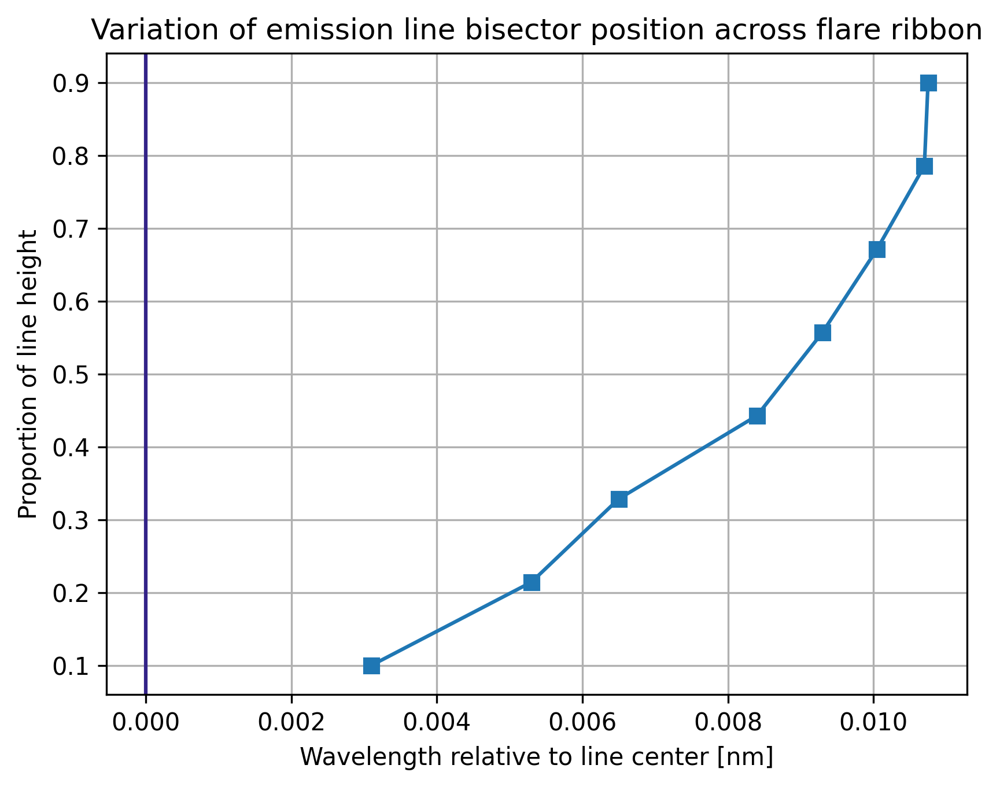

In [573]:
fig,ax=plt.subplots()
ax.plot(centroids[1:-2],np.linspace(.1,.9,8),'-s')
ax.grid()
ax.axvline(0,color='#332288')
ax.set_xlabel('Wavelength relative to line center [nm]')
ax.set_ylabel('Proportion of line height')
ax.set_title('Variation of emission line bisector position across flare ribbon')

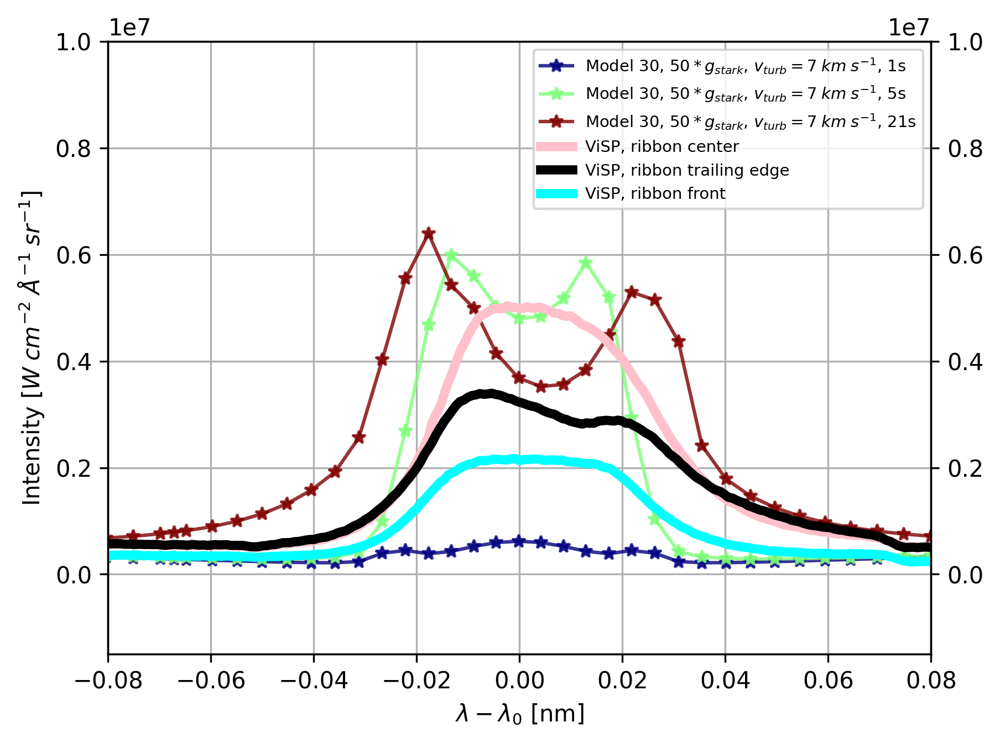

In [84]:
fig,ax=plt.subplots()
# lns6 = ax.plot(dkist_wl_shift2,dkist_int[caiih_inds_dkist],label='ViSP, ribbon center',linewidth=4,c='pink')
# lns0 = ax.plot(dkist_wl_shift2,dkist_int_trail[caiih_inds_dkist],label='ViSP, ribbon trailing edge',linewidth=4,c='black')
# lns0 = ax.plot(dkist_wl_shift2,dkist_int_front[caiih_inds_dkist],label='ViSP, ribbon front',linewidth=4,c='cyan')

#ax.plot(selwlshift,gauss2fitynorm,'-.',color='#EE7733',label='Model')
# ax.plot(selwlshift,comp1fitynorm,'-.',color='#33BBEE',label='Component 1')
# ax.plot(selwlshift,comp2fitynorm,'-.',color='#CC3311',label='Component 2')
colors = plt.cm.jet(np.linspace(0,1,3))
#ax0 = ax.twinx()
#lns1 = ax.plot(rh_wl_shift30,rh_int30_2vt_30broadc,'-*',alpha=0.8,label=r'RH, $30*g_{stark}$, $v_{turb}=2\; km\; s^{-1}$',c='red')
lns2 = ax.plot(mod30_1s_wlshift,mod30_1s_int,'-*',alpha=0.8,label=r'Model 30, $50*g_{stark}$, $v_{turb}=7\;km\; s^{-1}$, 1s',c=colors[0])
lns3 = ax.plot(mod30_5s_wlshift,mod30_5s_int,'-*',alpha=0.8,label=r'Model 30, $50*g_{stark}$, $v_{turb}=7\;km\; s^{-1}$, 5s',c=colors[1])
lns7 = ax.plot(mod30_21s_wlshift,mod30_21s_int,'-*',alpha=0.8,label=r'Model 30, $50*g_{stark}$, $v_{turb}=7\;km\; s^{-1}$, 21s',c=colors[2])
ax1 = ax.twinx()
lns11 = ax1.plot(dkist_wl_shift2,dkist_int[caiih_inds_dkist],label='ViSP, ribbon center',linewidth=4,c='pink')
lns12 = ax1.plot(dkist_wl_shift2,dkist_int_trail[caiih_inds_dkist],label='ViSP, ribbon trailing edge',linewidth=4,c='black')
lns13 = ax1.plot(dkist_wl_shift2,dkist_int_front[caiih_inds_dkist],label='ViSP, ribbon front',linewidth=4,c='cyan')


#lns4 = ax.plot(rh_wl_shift30,rh_int30_2vt_300broadc,'-*',alpha=0.8,label=r'RH, $300*g_{stark}$, $v_{turb}=2\; km\; s^{-1}$',c='orange')
ax.set_xlim([-0.08,0.08])
#ax0.set_xlim([-0.1,0.1])
ax.set_xlabel(r'$\lambda - \lambda_0$ [nm]')
#ax0.set_ylabel(r'Intensity $[W\;cm^{-2}\;\AA^{-1}\;sr^{-1}]$')
ax.set_ylabel(r'Intensity $[W\;cm^{-2}\;\AA^{-1}\;sr^{-1}]$')


lns = lns2+lns3+lns7+lns11+lns12+lns13
labs = [l.get_label() for l in lns]
ax.legend(lns,labs,loc=0,fontsize=7)

ax.set_ylim([-1.5e6,10e6])

ax1.set_ylim([-1.5e6,10e6])
#ax0.set_ylim([0,4e6])

ax.grid()

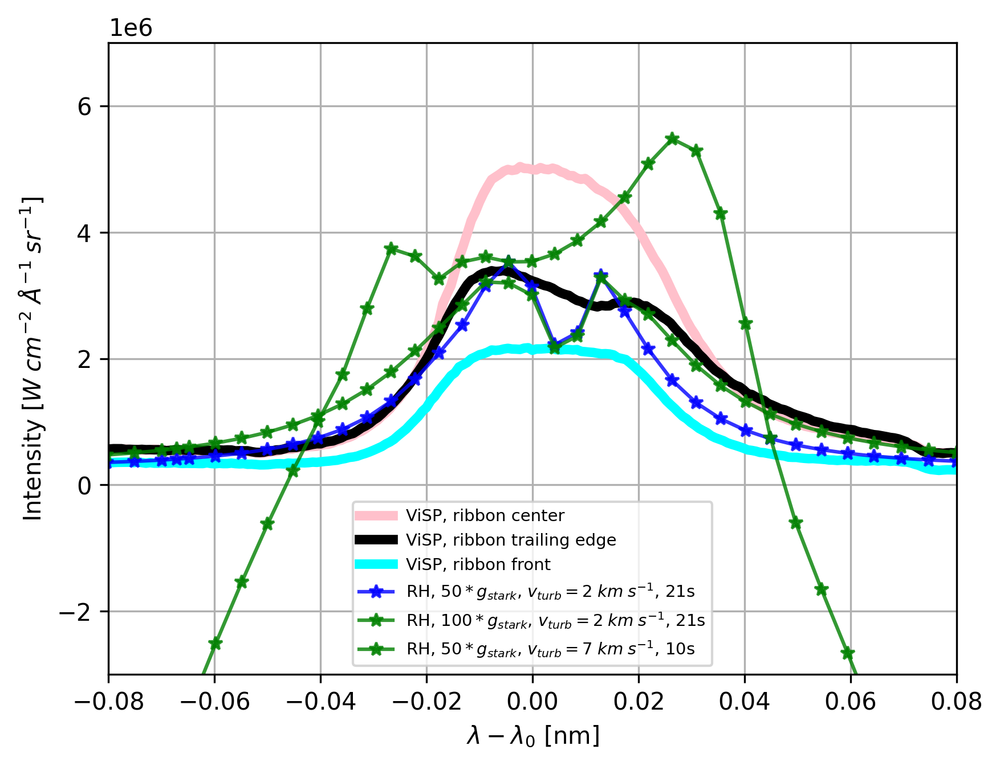

In [472]:
fig,ax=plt.subplots()
lns6 = ax.plot(dkist_wl_shift2,dkist_int[caiih_inds_dkist],label='ViSP, ribbon center',linewidth=4,c='pink')
lns0 = ax.plot(dkist_wl_shift2,dkist_int_trail[caiih_inds_dkist],label='ViSP, ribbon trailing edge',linewidth=4,c='black')
lns0 = ax.plot(dkist_wl_shift2,dkist_int_front[caiih_inds_dkist],label='ViSP, ribbon front',linewidth=4,c='cyan')

#ax.plot(selwlshift,gauss2fitynorm,'-.',color='#EE7733',label='Model')
# ax.plot(selwlshift,comp1fitynorm,'-.',color='#33BBEE',label='Component 1')
# ax.plot(selwlshift,comp2fitynorm,'-.',color='#CC3311',label='Component 2')

#ax0 = ax.twinx()
#lns1 = ax.plot(rh_wl_shift30,rh_int30_2vt_30broadc,'-*',alpha=0.8,label=r'RH, $30*g_{stark}$, $v_{turb}=2\; km\; s^{-1}$',c='red')
lns2 = ax.plot(rh_wl_shift30,rh_int30_2vt_50broadc,'-*',alpha=0.8,label=r'RH, $50*g_{stark}$, $v_{turb}=2\;km\; s^{-1}$, 21s',c='blue')
lns3 = ax.plot(rh_wl_shift30,rh_int30_2vt_100broadc,'-*',alpha=0.8,label=r'RH, $100*g_{stark}$, $v_{turb}=2\; km\; s^{-1}$, 21s',c='green')
lns4 = ax.plot(rh_wl_shift30,rh_int30_7vt_50broadc_10s,'-*',alpha=0.8,label=r'RH, $50*g_{stark}$, $v_{turb}=7\; km\; s^{-1}$, 10s',c='green')
#lns4 = ax.plot(rh_wl_shift30,rh_int30_2vt_300broadc,'-*',alpha=0.8,label=r'RH, $300*g_{stark}$, $v_{turb}=2\; km\; s^{-1}$',c='orange')
ax.set_xlim([-0.08,0.08])
#ax0.set_xlim([-0.1,0.1])
ax.set_xlabel(r'$\lambda - \lambda_0$ [nm]')
#ax0.set_ylabel(r'Intensity $[W\;cm^{-2}\;\AA^{-1}\;sr^{-1}]$')
ax.set_ylabel(r'Intensity $[W\;cm^{-2}\;\AA^{-1}\;sr^{-1}]$')


#lns = lns0+lns1+lns2+lns3+lns4
labs = [l.get_label() for l in lns]
ax.legend(loc=0,fontsize=7)

ax.set_ylim([-3e6,7e6])
#ax0.set_ylim([0,4e6])

ax.grid()

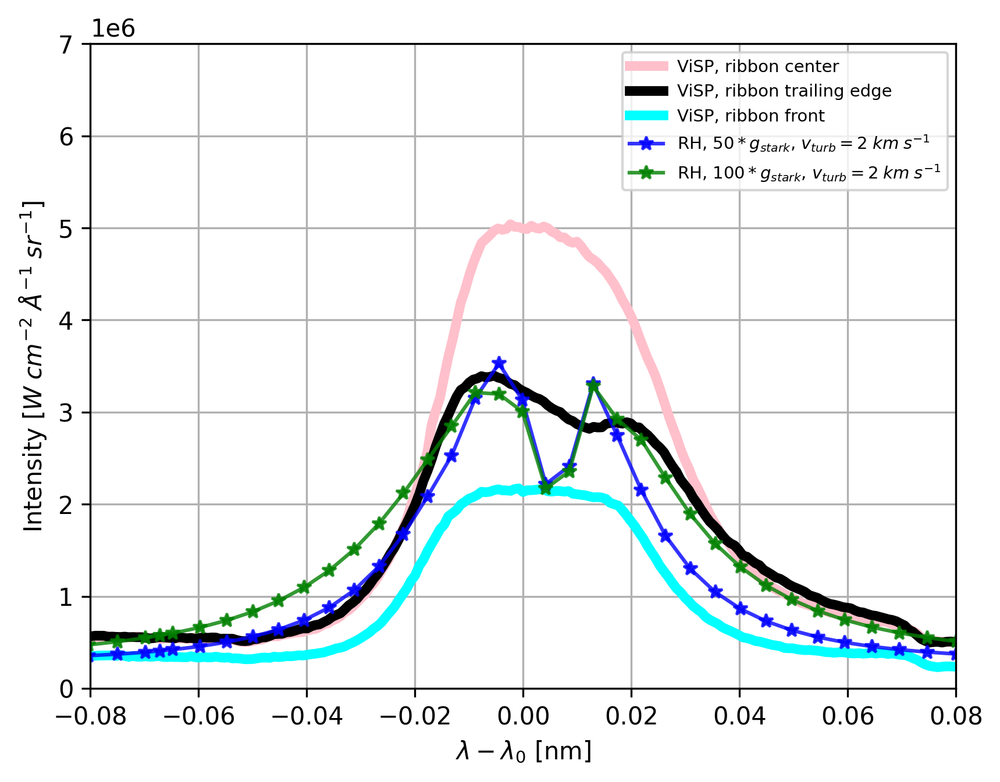

In [473]:
fig,ax=plt.subplots()
lns6 = ax.plot(dkist_wl_shift2,dkist_int[caiih_inds_dkist],label='ViSP, ribbon center',linewidth=4,c='pink')
lns0 = ax.plot(dkist_wl_shift2,dkist_int_trail[caiih_inds_dkist],label='ViSP, ribbon trailing edge',linewidth=4,c='black')
lns0 = ax.plot(dkist_wl_shift2,dkist_int_front[caiih_inds_dkist],label='ViSP, ribbon front',linewidth=4,c='cyan')

#ax.plot(selwlshift,gauss2fitynorm,'-.',color='#EE7733',label='Model')
# ax.plot(selwlshift,comp1fitynorm,'-.',color='#33BBEE',label='Component 1')
# ax.plot(selwlshift,comp2fitynorm,'-.',color='#CC3311',label='Component 2')

#ax0 = ax.twinx()
#lns1 = ax.plot(rh_wl_shift30,rh_int30_2vt_30broadc,'-*',alpha=0.8,label=r'RH, $30*g_{stark}$, $v_{turb}=2\; km\; s^{-1}$',c='red')
lns2 = ax.plot(rh_wl_shift30,rh_int30_2vt_50broadc,'-*',alpha=0.8,label=r'RH, $50*g_{stark}$, $v_{turb}=2\;km\; s^{-1}$',c='blue')
lns3 = ax.plot(rh_wl_shift30,rh_int30_2vt_100broadc,'-*',alpha=0.8,label=r'RH, $100*g_{stark}$, $v_{turb}=2\; km\; s^{-1}$',c='green')
#lns4 = ax.plot(rh_wl_shift30,rh_int30_2vt_300broadc,'-*',alpha=0.8,label=r'RH, $300*g_{stark}$, $v_{turb}=2\; km\; s^{-1}$',c='orange')
ax.set_xlim([-0.08,0.08])
#ax0.set_xlim([-0.1,0.1])
ax.set_xlabel(r'$\lambda - \lambda_0$ [nm]')
#ax0.set_ylabel(r'Intensity $[W\;cm^{-2}\;\AA^{-1}\;sr^{-1}]$')
ax.set_ylabel(r'Intensity $[W\;cm^{-2}\;\AA^{-1}\;sr^{-1}]$')


#lns = lns0+lns1+lns2+lns3+lns4
labs = [l.get_label() for l in lns]
ax.legend(loc=0,fontsize=7)

ax.set_ylim([0,7e6])
#ax0.set_ylim([0,4e6])

ax.grid()

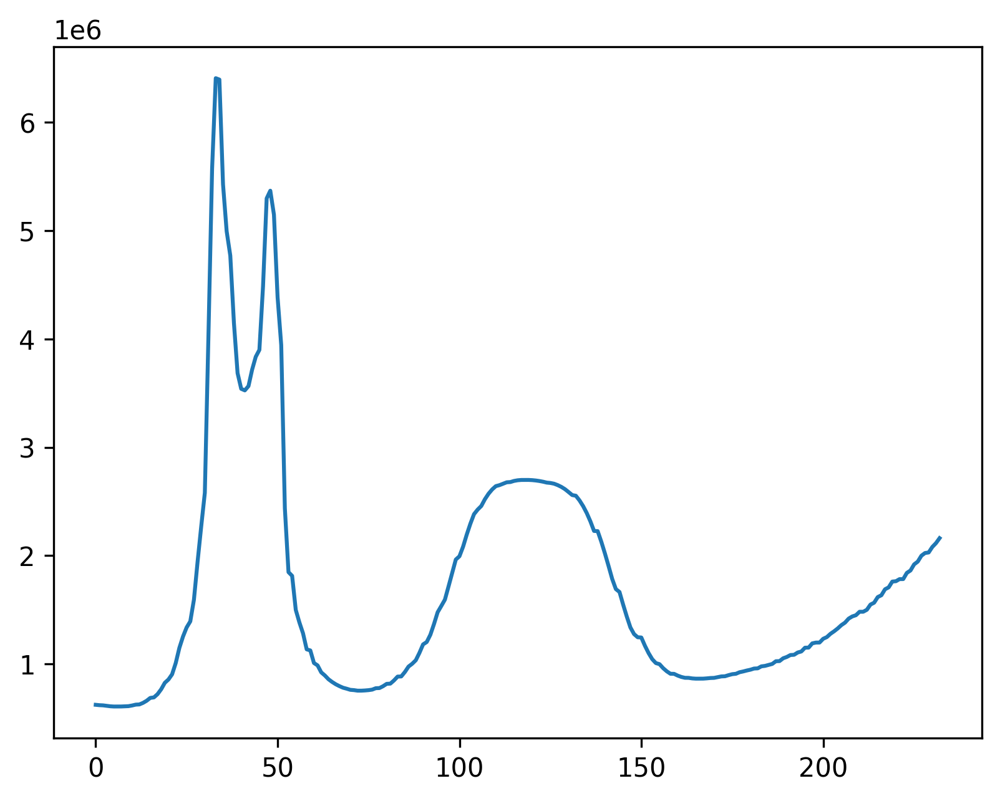

In [474]:
plt.plot(rh_mod30_7vt_50broadc_21s_H20['int_rh'][h20caiih_inds])

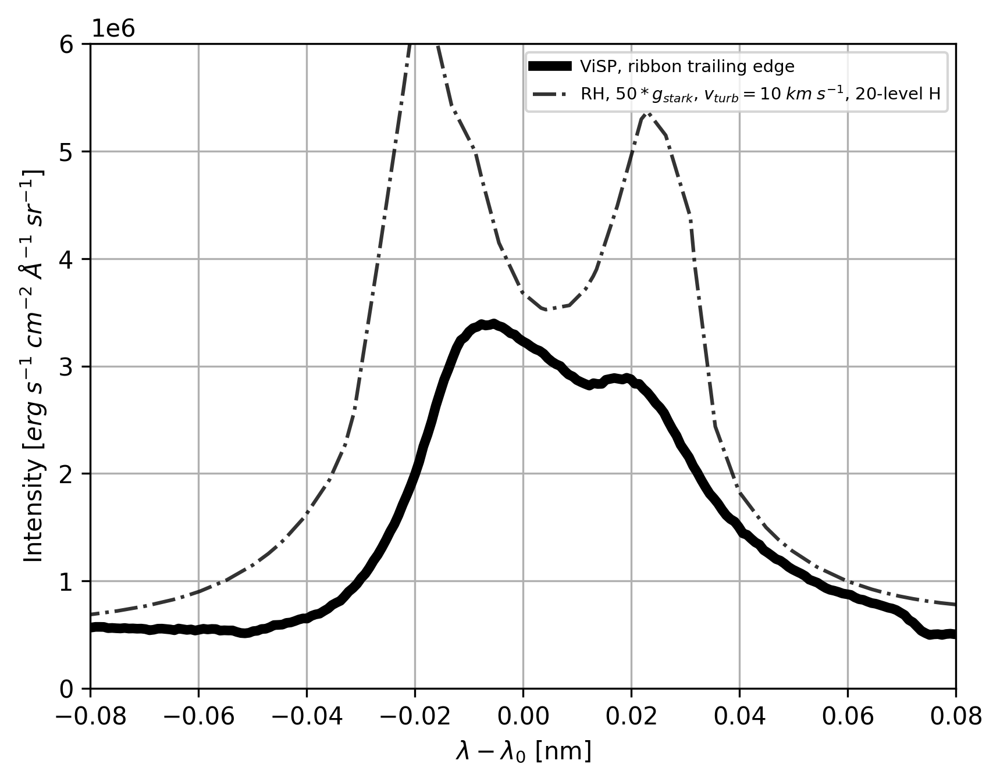

In [475]:
fig,ax=plt.subplots()
lns0 = ax.plot(dkist_wl_shift2,dkist_int_trail[caiih_inds_dkist],label='ViSP, ribbon trailing edge',linewidth=4,c='black')
#ax.plot(selwlshift,gauss2fitynorm,'-.',color='#EE7733',label='Model')
# ax.plot(selwlshift,comp1fitynorm,'-.',color='#33BBEE',label='Component 1')
# ax.plot(selwlshift,comp2fitynorm,'-.',color='#CC3311',label='Component 2')

#ax0 = ax.twinx()
# lns1 = ax.plot(rh_wl_shift30,rh_int30_2vt,'-.',alpha=0.8,label=r'RH, $50*g_{stark}$, $v_{turb}=2\; km\; s^{-1}$',c='red')
# lns2 = ax.plot(rh_wl_shift30,rh_int30_5vt,'-.',alpha=0.8,label=r'RH, $50*g_{stark}$, $v_{turb}=5\;km\; s^{-1}$',c='blue')
#lns3 = ax.plot(rh_wl_shift30,rh_int30_7vt,'-.',alpha=0.8,label=r'RH, $50*g_{stark}$, $v_{turb}=7\; km\; s^{-1}$',c='green')
# lns4 = ax.plot(rh_wl_shift30,rh_int30_10vt,'-.',alpha=0.8,label=r'RH, $50*g_{stark}$, $v_{turb}=10\; km\; s^{-1}$',c='orange')
lns5 = ax.plot(rh_wl_shift30_7vt_50broadc_21s_H20,rh_int30_7vt_50broadc_21s_H20,'-.',alpha=0.8,label=r'RH, $50*g_{stark}$, $v_{turb}=10\; km\; s^{-1}$, 20-level H',c='black')

ax.set_xlim([-0.08,0.08])
#ax0.set_xlim([-0.1,0.1])

#lns = lns0+lns1+lns2+lns3+lns4
#labs = [l.get_label() for l in lns]
ax.legend(loc=0,fontsize=7)

ax.set_ylim([0,6e6])
#ax0.set_ylim([0,4e6])

ax.set_xlabel(r'$\lambda - \lambda_0$ [nm]')
ax.set_ylabel(r'Intensity $[erg\;s^{-1}\;cm^{-2}\;\AA^{-1}\;sr^{-1}]$')

ax.grid()

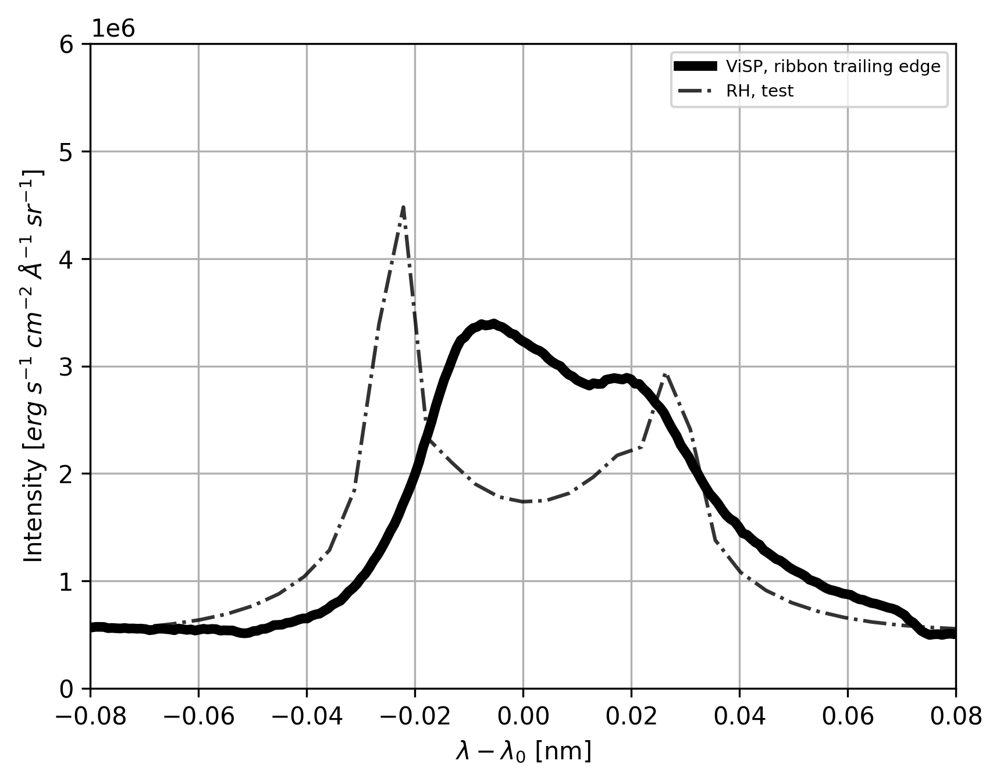

In [476]:
rhtest_wl

fig,ax=plt.subplots()
lns0 = ax.plot(dkist_wl_shift2,dkist_int_trail[caiih_inds_dkist],label='ViSP, ribbon trailing edge',linewidth=4,c='black')
#ax.plot(selwlshift,gauss2fitynorm,'-.',color='#EE7733',label='Model')
# ax.plot(selwlshift,comp1fitynorm,'-.',color='#33BBEE',label='Component 1')
# ax.plot(selwlshift,comp2fitynorm,'-.',color='#CC3311',label='Component 2')

#ax0 = ax.twinx()
# lns1 = ax.plot(rh_wl_shift30,rh_int30_2vt,'-.',alpha=0.8,label=r'RH, $50*g_{stark}$, $v_{turb}=2\; km\; s^{-1}$',c='red')
# lns2 = ax.plot(rh_wl_shift30,rh_int30_5vt,'-.',alpha=0.8,label=r'RH, $50*g_{stark}$, $v_{turb}=5\;km\; s^{-1}$',c='blue')
#lns3 = ax.plot(rh_wl_shift30,rh_int30_7vt,'-.',alpha=0.8,label=r'RH, $50*g_{stark}$, $v_{turb}=7\; km\; s^{-1}$',c='green')
# lns4 = ax.plot(rh_wl_shift30,rh_int30_10vt,'-.',alpha=0.8,label=r'RH, $50*g_{stark}$, $v_{turb}=10\; km\; s^{-1}$',c='orange')
lns5 = ax.plot(rhtest_wl_shift,rhtest_int,'-.',alpha=0.8,label=r'RH, test',c='black')

ax.set_xlim([-0.08,0.08])
#ax0.set_xlim([-0.1,0.1])

#lns = lns0+lns1+lns2+lns3+lns4
#labs = [l.get_label() for l in lns]
ax.legend(loc=0,fontsize=7)

ax.set_ylim([0,6e6])
#ax0.set_ylim([0,4e6])

ax.set_xlabel(r'$\lambda - \lambda_0$ [nm]')
ax.set_ylabel(r'Intensity $[erg\;s^{-1}\;cm^{-2}\;\AA^{-1}\;sr^{-1}]$')

ax.grid()

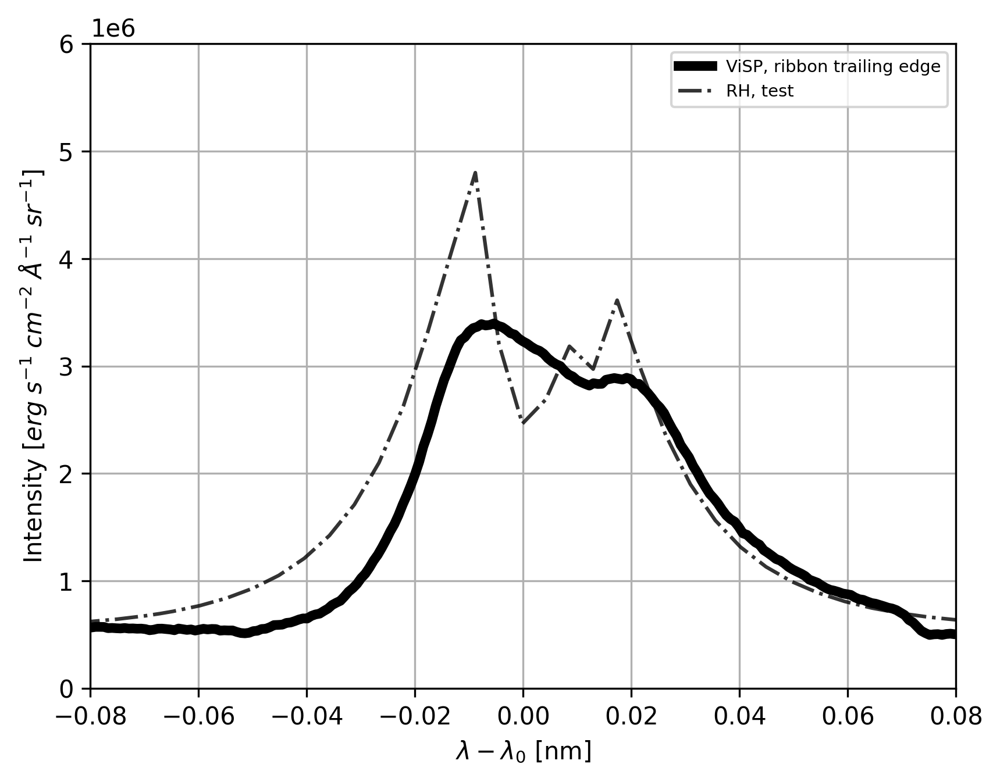

In [461]:
rhtest_wl

fig,ax=plt.subplots()
lns0 = ax.plot(dkist_wl_shift2,dkist_int_trail[caiih_inds_dkist],label='ViSP, ribbon trailing edge',linewidth=4,c='black')
#ax.plot(selwlshift,gauss2fitynorm,'-.',color='#EE7733',label='Model')
# ax.plot(selwlshift,comp1fitynorm,'-.',color='#33BBEE',label='Component 1')
# ax.plot(selwlshift,comp2fitynorm,'-.',color='#CC3311',label='Component 2')

#ax0 = ax.twinx()
# lns1 = ax.plot(rh_wl_shift30,rh_int30_2vt,'-.',alpha=0.8,label=r'RH, $50*g_{stark}$, $v_{turb}=2\; km\; s^{-1}$',c='red')
# lns2 = ax.plot(rh_wl_shift30,rh_int30_5vt,'-.',alpha=0.8,label=r'RH, $50*g_{stark}$, $v_{turb}=5\;km\; s^{-1}$',c='blue')
#lns3 = ax.plot(rh_wl_shift30,rh_int30_7vt,'-.',alpha=0.8,label=r'RH, $50*g_{stark}$, $v_{turb}=7\; km\; s^{-1}$',c='green')
# lns4 = ax.plot(rh_wl_shift30,rh_int30_10vt,'-.',alpha=0.8,label=r'RH, $50*g_{stark}$, $v_{turb}=10\; km\; s^{-1}$',c='orange')
lns5 = ax.plot(rhtest_wl_shift,rhtest_int,'-.',alpha=0.8,label=r'RH, test',c='black')

ax.set_xlim([-0.08,0.08])
#ax0.set_xlim([-0.1,0.1])

#lns = lns0+lns1+lns2+lns3+lns4
#labs = [l.get_label() for l in lns]
ax.legend(loc=0,fontsize=7)

ax.set_ylim([0,6e6])
#ax0.set_ylim([0,4e6])

ax.set_xlabel(r'$\lambda - \lambda_0$ [nm]')
ax.set_ylabel(r'Intensity $[erg\;s^{-1}\;cm^{-2}\;\AA^{-1}\;sr^{-1}]$')

ax.grid()

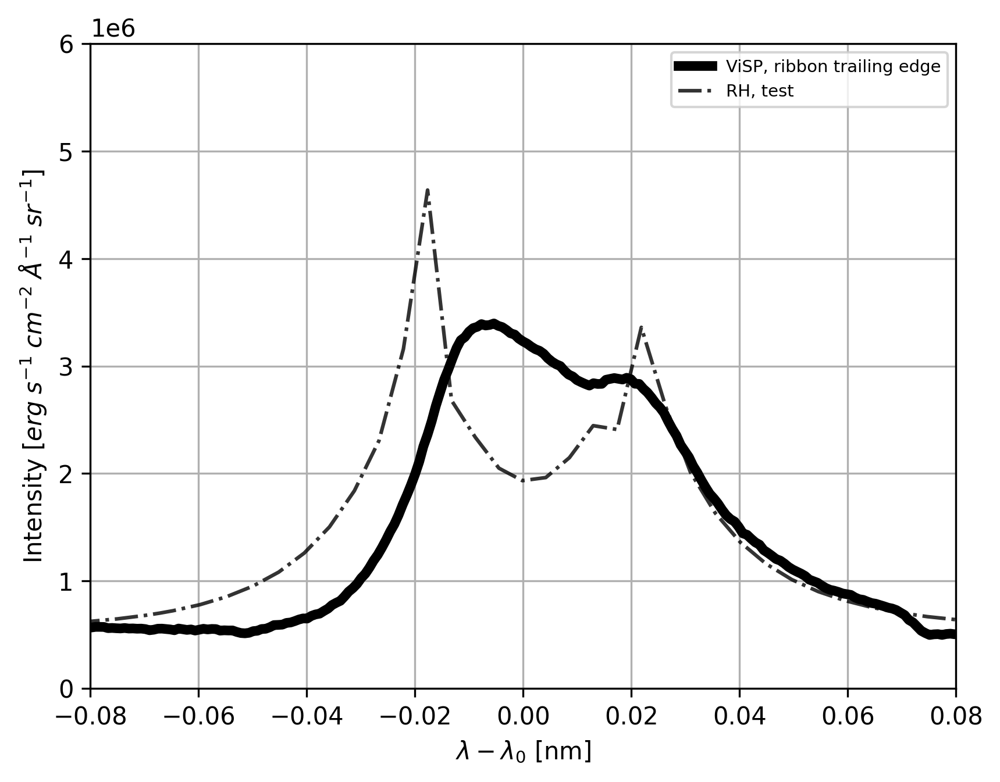

In [432]:
rhtest_wl

fig,ax=plt.subplots()
lns0 = ax.plot(dkist_wl_shift2,dkist_int_trail[caiih_inds_dkist],label='ViSP, ribbon trailing edge',linewidth=4,c='black')
#ax.plot(selwlshift,gauss2fitynorm,'-.',color='#EE7733',label='Model')
# ax.plot(selwlshift,comp1fitynorm,'-.',color='#33BBEE',label='Component 1')
# ax.plot(selwlshift,comp2fitynorm,'-.',color='#CC3311',label='Component 2')

#ax0 = ax.twinx()
# lns1 = ax.plot(rh_wl_shift30,rh_int30_2vt,'-.',alpha=0.8,label=r'RH, $50*g_{stark}$, $v_{turb}=2\; km\; s^{-1}$',c='red')
# lns2 = ax.plot(rh_wl_shift30,rh_int30_5vt,'-.',alpha=0.8,label=r'RH, $50*g_{stark}$, $v_{turb}=5\;km\; s^{-1}$',c='blue')
#lns3 = ax.plot(rh_wl_shift30,rh_int30_7vt,'-.',alpha=0.8,label=r'RH, $50*g_{stark}$, $v_{turb}=7\; km\; s^{-1}$',c='green')
# lns4 = ax.plot(rh_wl_shift30,rh_int30_10vt,'-.',alpha=0.8,label=r'RH, $50*g_{stark}$, $v_{turb}=10\; km\; s^{-1}$',c='orange')
lns5 = ax.plot(rhtest_wl_shift,rhtest_int,'-.',alpha=0.8,label=r'RH, test',c='black')

ax.set_xlim([-0.08,0.08])
#ax0.set_xlim([-0.1,0.1])

#lns = lns0+lns1+lns2+lns3+lns4
#labs = [l.get_label() for l in lns]
ax.legend(loc=0,fontsize=7)

ax.set_ylim([0,6e6])
#ax0.set_ylim([0,4e6])

ax.set_xlabel(r'$\lambda - \lambda_0$ [nm]')
ax.set_ylabel(r'Intensity $[erg\;s^{-1}\;cm^{-2}\;\AA^{-1}\;sr^{-1}]$')

ax.grid()

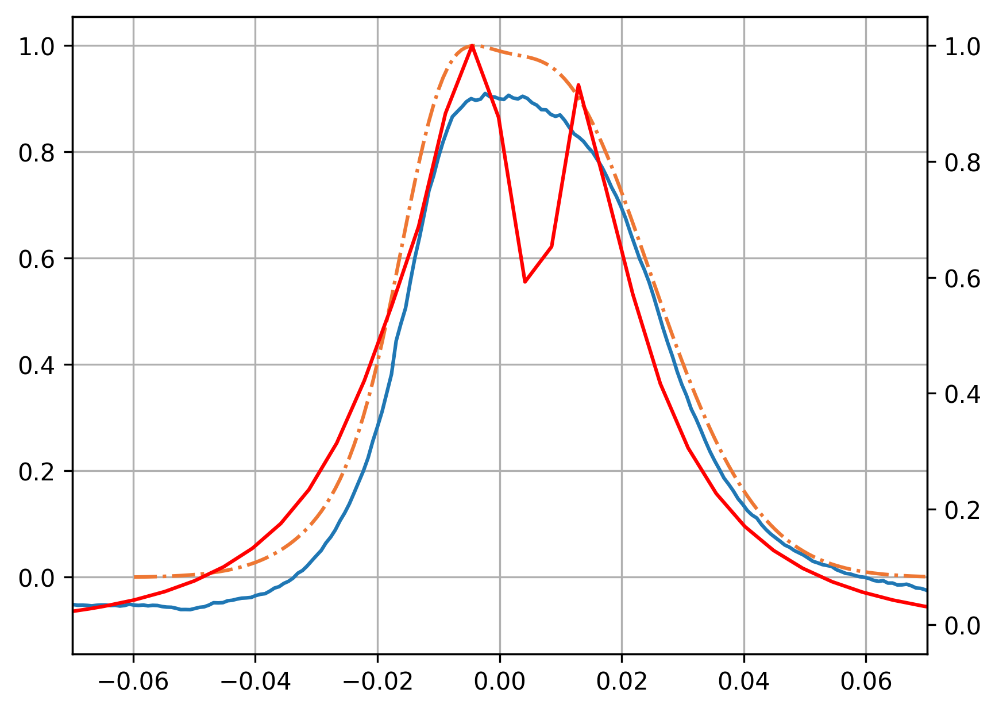

In [394]:
fig,ax=plt.subplots()
ax.plot(dkist_wl_shift2,dkist_intnorm2,label='dkist')
ax.plot(selwlshift,gauss2fitynorm,'-.',color='#EE7733',label='Model')
# ax.plot(selwlshift,comp1fitynorm,'-.',color='#33BBEE',label='Component 1')
# ax.plot(selwlshift,comp2fitynorm,'-.',color='#CC3311',label='Component 2')

ax0 = ax.twinx()
ax0.plot(rh_wl_shifttest,rh_intnorm30,label='testmodel',c='red')
ax.set_xlim([-0.07,0.07])
ax0.set_xlim([-0.07,0.07])
ax.grid()

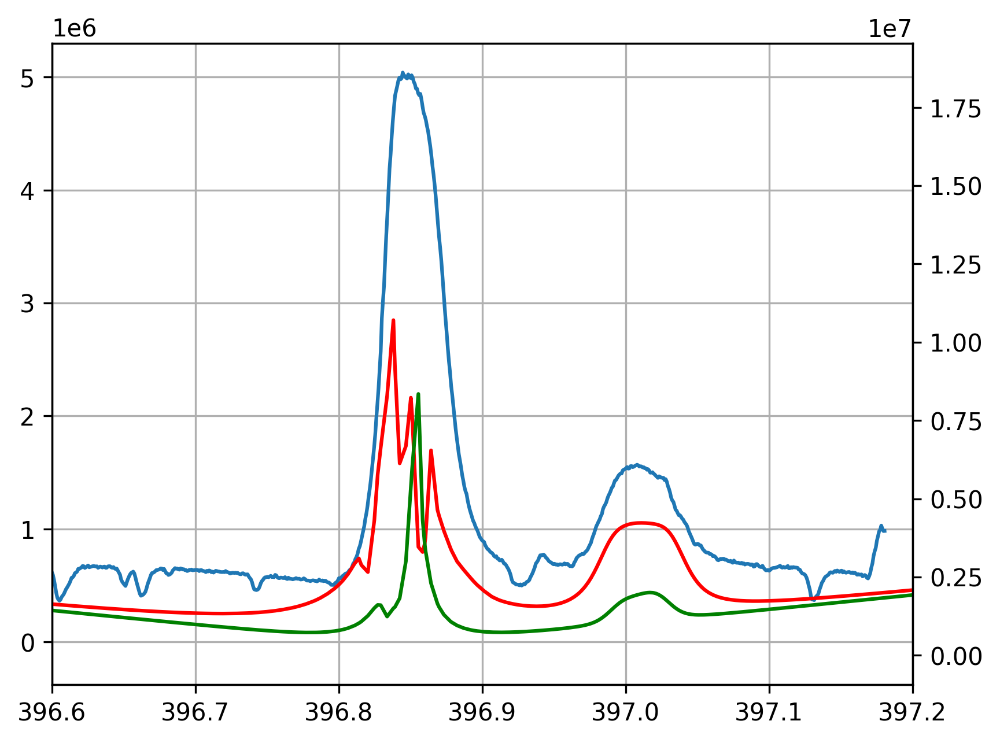

In [395]:
fig,ax=plt.subplots()
ax.plot(dkist_wl,dkist_file['int_dkist'][0,:,maxind],label='dkist')
ax0 = ax.twinx()
ax0.plot(rh_file3['wl_rh'],rh_file3['int_rh'],label='3e9 peak energy',c='red')
ax0.plot(rh_file5['wl_rh'],rh_file5['int_rh'],label='3e10 peak energy',c='green')
ax.set_xlim([396.6,397.2])
ax0.set_xlim([396.6,397.2])

ax.grid()

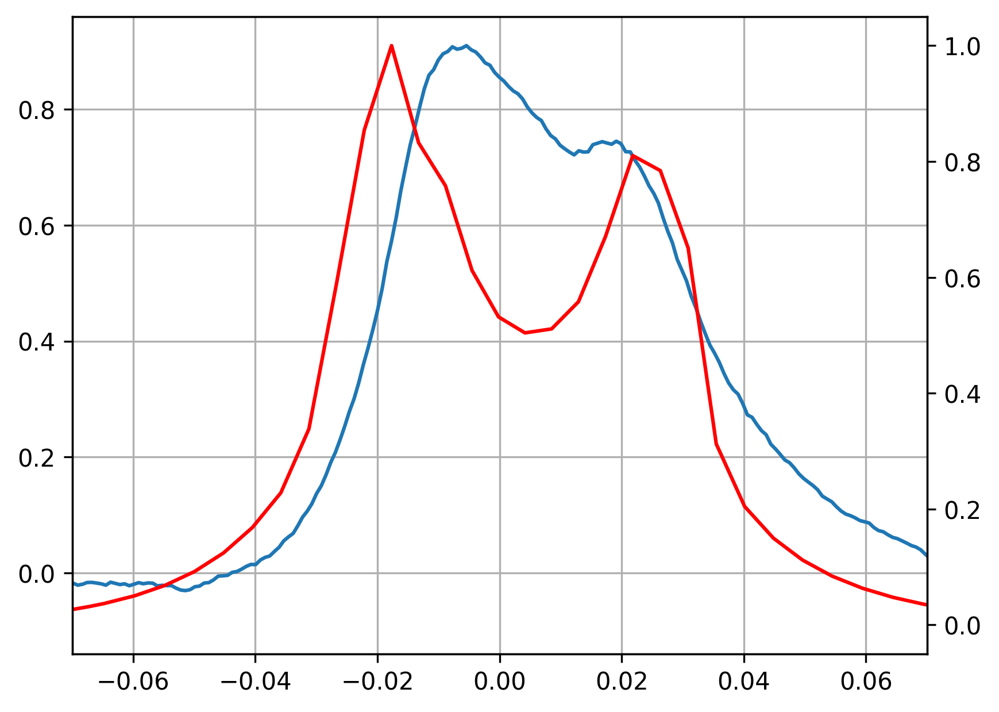

In [174]:
fig,ax=plt.subplots()
ax.plot(dkist_wl_shift2,dkist_intnorm2_trail,label='dkist')
#ax.plot(selwlshift,gauss2fitynorm,'-.',color='#EE7733',label='Model')
# ax.plot(selwlshift,comp1fitynorm,'-.',color='#33BBEE',label='Component 1')
# ax.plot(selwlshift,comp2fitynorm,'-.',color='#CC3311',label='Component 2')

ax0 = ax.twinx()
ax0.plot(rh_wl_shifttest,rh_intnorm30,label='testmodel',c='red')
ax.set_xlim([-0.07,0.07])
ax0.set_xlim([-0.07,0.07])
ax.grid()

In [175]:
dkist_file

NpzFile '/Users/coletamburri/Desktop/DKISTobstest.npz' with keys: int_dkist, raw_dkist, wls, xs, maxinds

AttributeError: 'function' object has no attribute 'plot'

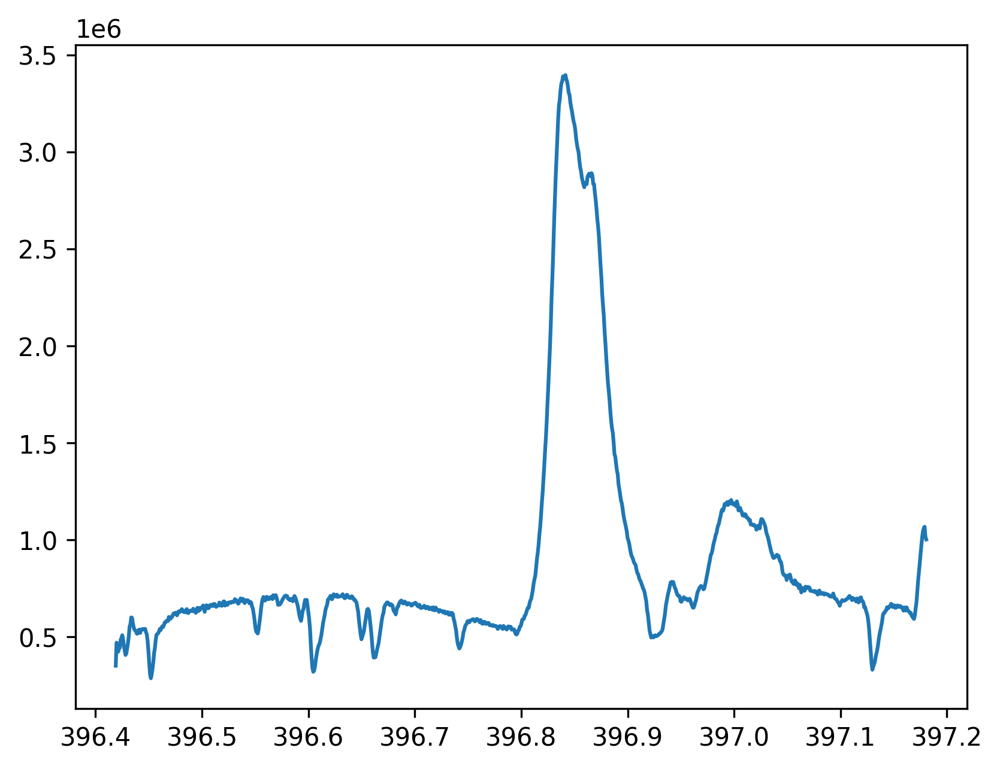

In [176]:
fig,ax=plt.subplots()
ax.plot(dkist_wl,dkist_file['int_dkist'][0,:,maxind+80],label='dkist')
ax0 = ax.twinx
ax0.plot(rh_mod30['wl_rh'],rh_mod30['int_rh'],label='3e9 peak energy',c='red')
ax.set_xlim([396.6,397.2])
ax0.set_xlim([396.6,397.2])

ax.grid()

(396.0, 398.0)

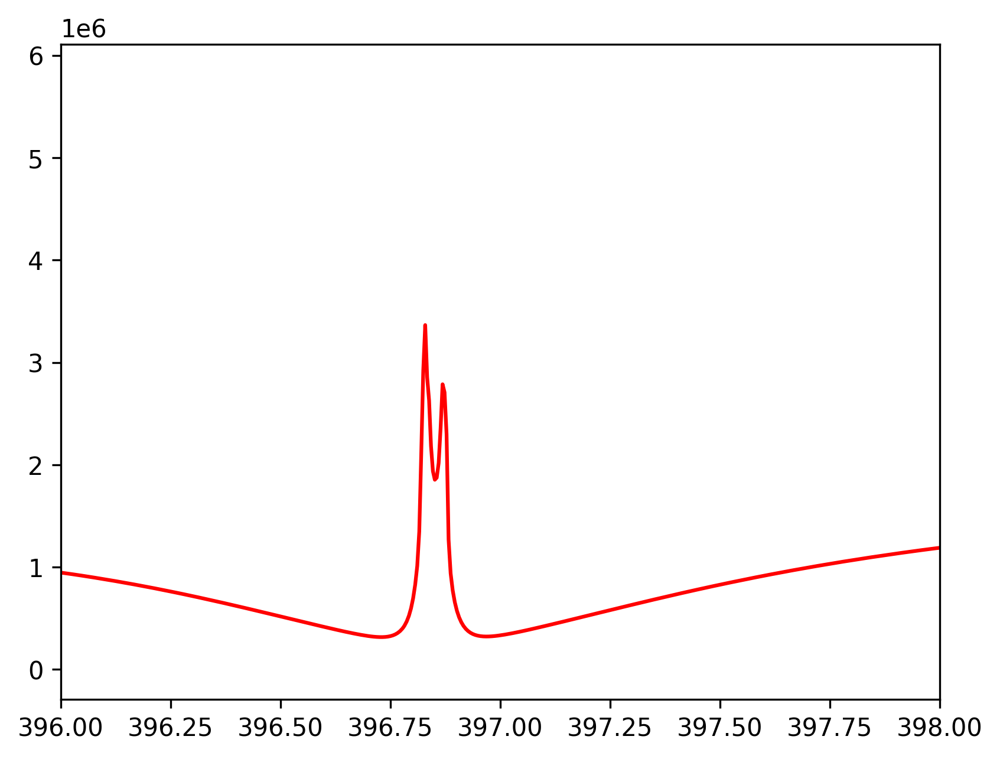

In [177]:
plt.plot(rh_mod30['wl_rh'],rh_mod30['int_rh'],label='3e9 peak energy',c='red')
plt.xlim([396,398])

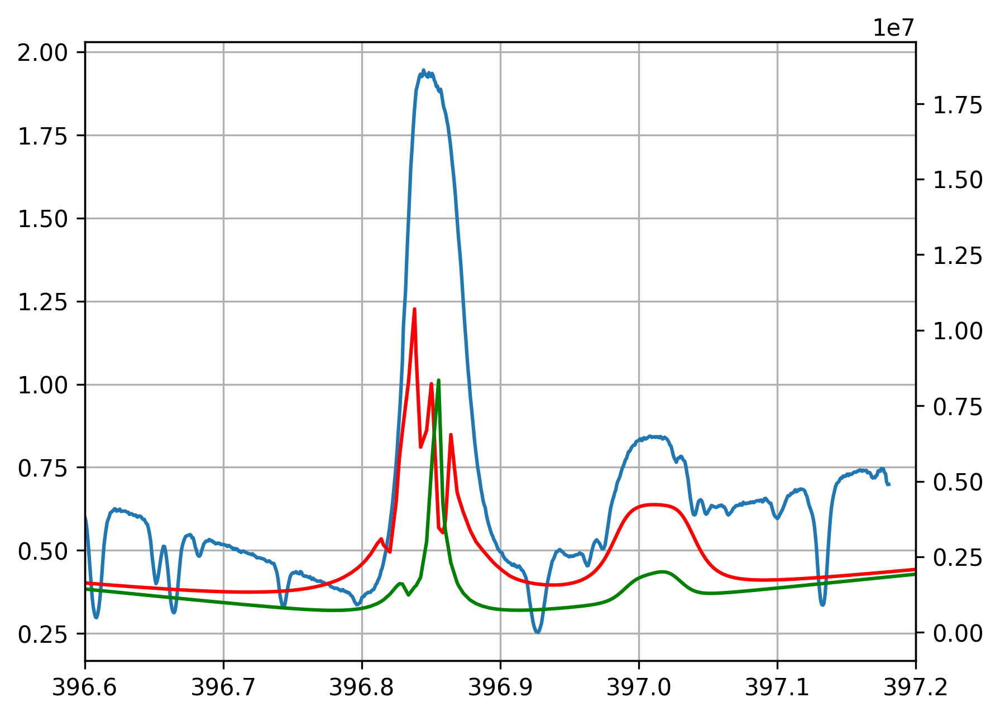

In [24]:
fig,ax=plt.subplots()
ax.plot(dkist_wl,dkist_file['raw_dkist'][0,:,maxind],label='dkist')
ax0 = ax.twinx()
ax0.plot(rh_file3['wl_rh'],rh_file3['int_rh'],label='3e9 peak energy',c='red')
ax0.plot(rh_file5['wl_rh'],rh_file5['int_rh'],label='3e10 peak energy',c='green')
ax.set_xlim([396.6,397.2])
ax0.set_xlim([396.6,397.2])

ax.grid()


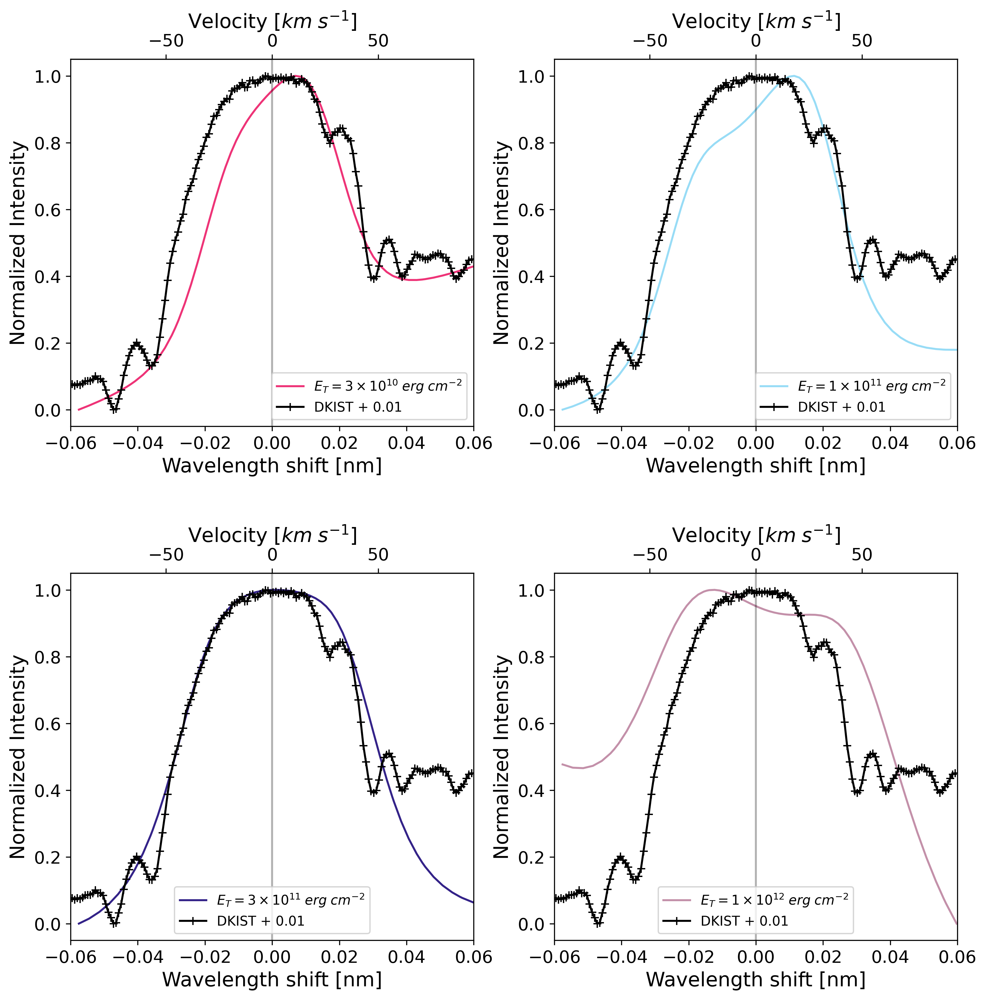

In [43]:
fig,[[ax1,ax2],[ax3,ax4]]=plt.subplots(2,2,figsize=(12,12))
lns1 = ax1.plot(rh_wl_shift5_hep,rh_intnorm5,label=r'$E_T=3\times10^{10}\;erg\; cm^{-2}$',color='#EE3377')
lns2 = ax2.plot(rh_wl_shift6_hep,rh_intnorm6,'-',alpha=0.5,label=r'$E_T=1\times10^{11}\;erg\; cm^{-2}$',color='#33BBEE')
lns3 = ax3.plot(rh_wl_shift3_hep,rh_intnorm3,'-',markerfacecolor='None',label=r'$E_T=3\times10^{11}\;erg\; cm^{-2}$',color='#332288')
lns4 = ax4.plot(rh_wl_shift4_hep,rh_intnorm4,alpha=0.5,label=r'$E_T=1\times10^{12}\;erg\; cm^{-2}$',color='#882255')
# ax0 = ax.twinx()
lns5 = ax1.plot(dkist_wl_shift_hep2,dkist_intnorm3,'-+',label='DKIST + 0.01',color='#000000')

ax2.plot(dkist_wl_shift_hep2,dkist_intnorm3,'-+',label='DKIST + 0.01',color='#000000')

ax3.plot(dkist_wl_shift_hep2,dkist_intnorm3,'-+',label='DKIST + 0.01',color='#000000')

ax4.plot(dkist_wl_shift_hep2,dkist_intnorm3,'-+',label='DKIST + 0.01',color='#000000')

lns = lns1+lns5
labs = [l.get_label() for l in lns]
ax1.legend(lns, labs, loc=0)

lns = lns2+lns5
labs = [l.get_label() for l in lns]
ax2.legend(lns, labs, loc=0)

lns = lns3+lns5
labs = [l.get_label() for l in lns]
ax3.legend(lns, labs, loc=0)

lns = lns4+lns5
labs = [l.get_label() for l in lns]
ax4.legend(lns, labs, loc=0)

ax1.set_xlim([-0.06,0.06])

ax2.set_xlim([-0.06,0.06])

ax3.set_xlim([-0.06,0.06])

ax4.set_xlim([-0.06,0.06])
# ax0.set_xlim([-0.06,0.06])
#ax0.set_ylim([-0.01,0.5])
# ax.set_ylim([-0.01,0.4])
#ax.legend(fontsize=13)
#ax.grid()
ax1.axvline(0,color='black',alpha=0.3)
ax2.axvline(0,color='black',alpha=0.3)
ax3.axvline(0,color='black',alpha=0.3)
ax4.axvline(0,color='black',alpha=0.3)

ax1.set_ylabel('Normalized Intensity',fontsize=15)
ax2.set_ylabel('Normalized Intensity',fontsize=15)
ax3.set_ylabel('Normalized Intensity',fontsize=15)
ax4.set_ylabel('Normalized Intensity',fontsize=15)

#ax0.set_ylabel('Normalized Intensity',fontsize=15)
ax1.set_xlabel('Wavelength shift [nm]',fontsize=15)
ax2.set_xlabel('Wavelength shift [nm]',fontsize=15)
ax3.set_xlabel('Wavelength shift [nm]',fontsize=15)
ax4.set_xlabel('Wavelength shift [nm]',fontsize=15)

secaxx = ax1.secondary_xaxis('top', functions=(veltrans,wltrans))
secaxx.set_xlabel(r'Velocity $[km\; s^{-1}]$',fontsize=15)
secaxx.tick_params(axis='x', labelsize=13)

secaxx = ax2.secondary_xaxis('top', functions=(veltrans,wltrans))
secaxx.set_xlabel(r'Velocity $[km\; s^{-1}]$',fontsize=15)
secaxx.tick_params(axis='x', labelsize=13)

secaxx = ax3.secondary_xaxis('top', functions=(veltrans,wltrans))
secaxx.set_xlabel(r'Velocity $[km\; s^{-1}]$',fontsize=15)
secaxx.tick_params(axis='x', labelsize=13)

secaxx = ax4.secondary_xaxis('top', functions=(veltrans,wltrans))
secaxx.set_xlabel(r'Velocity $[km\; s^{-1}]$',fontsize=15)
secaxx.tick_params(axis='x', labelsize=13)

ax1.tick_params(axis='x', labelsize=13)
ax1.tick_params(axis='y', labelsize=13)

ax2.tick_params(axis='x', labelsize=13)
ax2.tick_params(axis='y', labelsize=13)

ax3.tick_params(axis='x', labelsize=13)
ax3.tick_params(axis='y', labelsize=13)

ax4.tick_params(axis='x', labelsize=13)
ax4.tick_params(axis='y', labelsize=13)

# ax0.tick_params(axis='x', labelsize=13)
# ax0.tick_params(axis='y', labelsize=13)

fig.subplots_adjust(wspace=.2, hspace=.4)


In [ ]:
# show entire spectrum here...
fig,ax=plt.subplots(figsize=(6,6))
lns1 = ax.plot(rh_wl_shift5_hep,rh_intnorm5,label=r'$E_T=3\times10^{10}\;erg\; cm^{-2}$',color='#EE3377')
# lns2 = ax.plot(rh_wl_shift6_hep,rh_intnorm6,'-',alpha=0.5,label=r'$E_T=1\times10^{11}\;erg\; cm^{-2}$',color='#33BBEE')
lns3 = ax.plot(rh_wl_shift3_hep,rh_intnorm3,'-o',markerfacecolor='None',label=r'$E_T=3\times10^{11}\;erg\; cm^{-2}$',color='#332288')
# lns4 = ax.plot(rh_wl_shift4_hep,rh_intnorm4,alpha=0.5,label=r'$E_T=1\times10^{12}\;erg\; cm^{-2}$',color='#882255')
# ax0 = ax.twinx()
lns5 = ax.plot(dkist_wl_shift_hep2,dkist_intnorm3,'-+',label='DKIST + 0.01',color='#000000')
lns = lns1+lns5
labs = [l.get_label() for l in lns]
ax.legend(lns, labs, loc=0)

ax.set_xlim([-0.06,0.06])
# ax0.set_xlim([-0.06,0.06])
#ax0.set_ylim([-0.01,0.5])
# ax.set_ylim([-0.01,0.4])
#ax.legend(fontsize=13)
#ax.grid()
ax.axvline(0,color='black',alpha=0.3)
ax.set_ylabel('Normalized Intensity',fontsize=15)
#ax0.set_ylabel('Normalized Intensity',fontsize=15)
ax.set_xlabel('Wavelength shift [nm]',fontsize=15)
secaxx = ax.secondary_xaxis('top', functions=(veltrans,wltrans))
secaxx.set_xlabel(r'Velocity $[km\; s^{-1}]$',fontsize=15)
ax.tick_params(axis='x', labelsize=13)
ax.tick_params(axis='y', labelsize=13)
# ax0.tick_params(axis='x', labelsize=13)
# ax0.tick_params(axis='y', labelsize=13)
secaxx.tick_params(axis='x', labelsize=13)

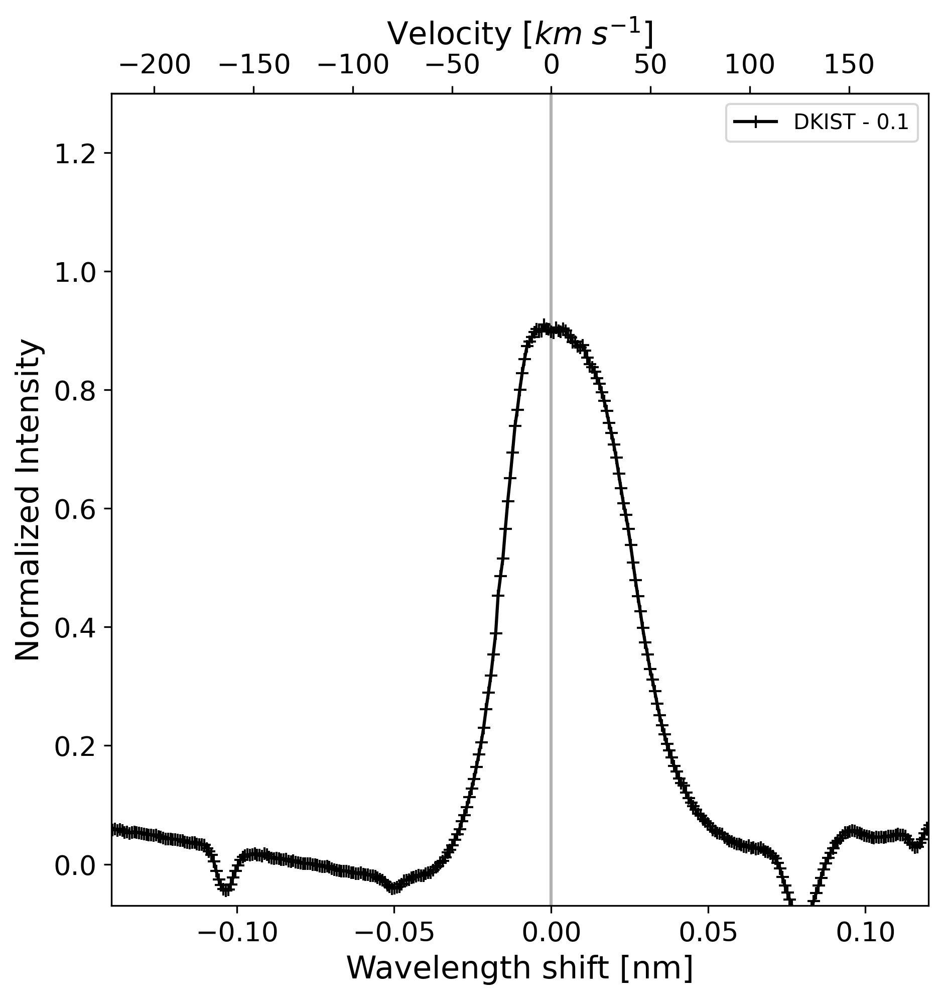

In [58]:
fig,ax=plt.subplots(figsize=(7,7))
# lns1 = ax.plot(rh_wl_shift10,rh_intnorm10,'-x',label=r'$1\times g_{stark}, v_{turb}=2.0 \;km\; s^{-1}$',color='#882255')
# lns2 = ax.plot(rh_wl_shift8,rh_intnorm8,'-',label=r'$10\times g_{stark}, v_{turb}=10.0 \;km\; s^{-1}$',color='#33BBEE')
# lns3 = ax.plot(rh_wl_shift9,rh_intnorm9,'-.',label=r'$10\times g_{stark}, v_{turb}=20.0 \;km\; s^{-1}$',color='#332288')
# lns4 = ax.plot(rh_wl_shift7,rh_intnorm7,label=r'$10\times g_{stark}, v_{turb}=2.0 \;km\; s^{-1}$',color='#EE3377')
# lns5 = ax.plot(rh_wl_shift11,rh_intnorm11,'-o',markerfacecolor='None',label=r'$100\times g_{stark}, v_{turb}=10.0\; km\; s^{-1}$',color='#009988')
# ax0 = ax.twinx()
lns6 = ax.plot(dkist_wl_shift2,dkist_intnorm,'-+',label='DKIST - 0.1',color='#000000')
# lns = lns1+lns2+lns3+lns4+lns5+lns6
# labs = [l.get_label() for l in lns]
ax.legend()

ax.set_xlim([-0.14,0.12])
# ax0.set_xlim([-0.06,0.06])
#ax0.set_ylim([-0.01,0.5])
ax.set_ylim([-0.07,1.3])
#ax.legend(fontsize=13)
#ax.grid()
ax.axvline(0,color='black',alpha=0.3)
ax.set_ylabel('Normalized Intensity',fontsize=15)
#ax0.set_ylabel('Normalized Intensity',fontsize=15)
ax.set_xlabel('Wavelength shift [nm]',fontsize=15)
secaxx = ax.secondary_xaxis('top', functions=(veltrans,wltrans))
secaxx.set_xlabel(r'Velocity $[km\; s^{-1}]$',fontsize=15)
ax.tick_params(axis='x', labelsize=13)
ax.tick_params(axis='y', labelsize=13)
# ax0.tick_params(axis='x', labelsize=13)
# ax0.tick_params(axis='y', labelsize=13)
secaxx.tick_params(axis='x', labelsize=13)

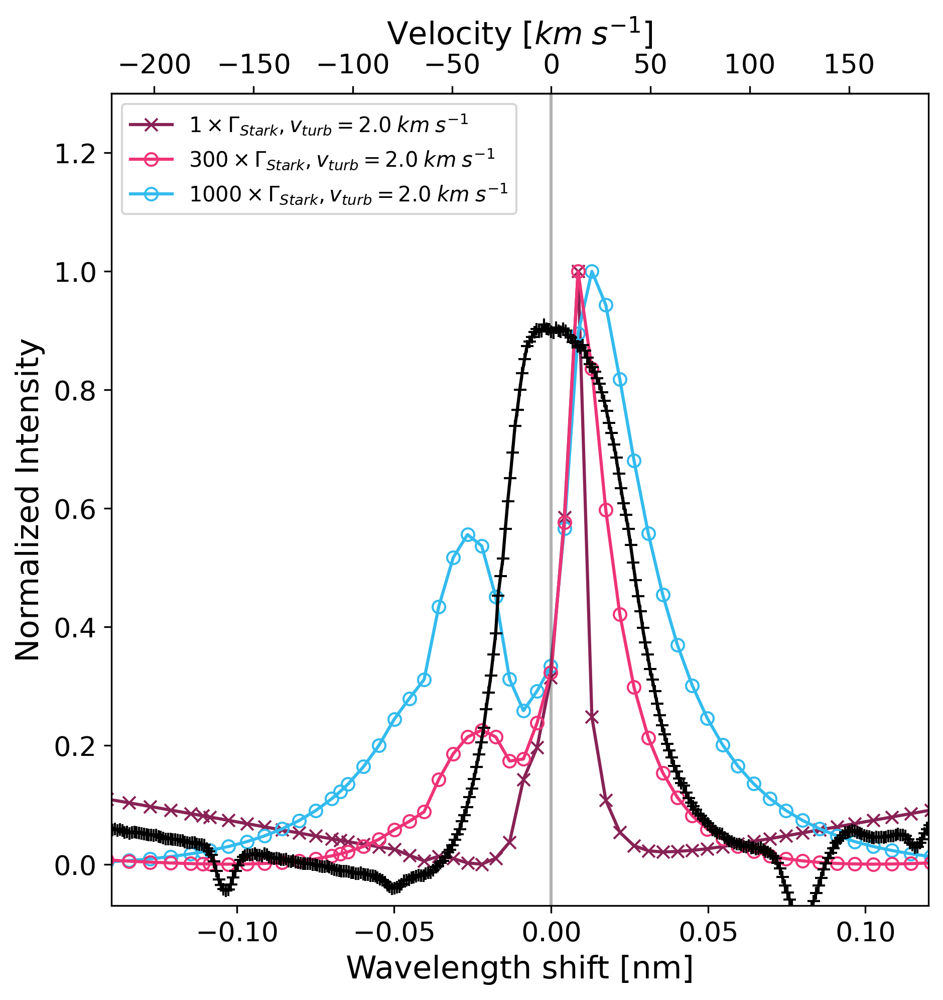

In [59]:
fig,ax=plt.subplots(figsize=(7,7))
lns1 = ax.plot(rh_wl_shift10,rh_intnorm10,'-x',label=r'$1\times \Gamma_{Stark}, v_{turb}=2.0 \;km\; s^{-1}$',color='#882255')
# lns2 = ax.plot(rh_wl_shift8,rh_intnorm8,'-',label=r'$10\times g_{stark}, v_{turb}=10.0 \;km\; s^{-1}$',color='#33BBEE')
# lns3 = ax.plot(rh_wl_shift9,rh_intnorm9,'-.',label=r'$10\times g_{stark}, v_{turb}=20.0 \;km\; s^{-1}$',color='#332288')
#lns4 = ax.plot(rh_wl_shift7,rh_intnorm7,label=r'$10\times \Gamma_{Stark}, v_{turb}=2.0 \;km\; s^{-1}$',color='#EE3377')
#lns5 = ax.plot(rh_wl_shift11,rh_intnorm11,'-o',markerfacecolor='None',label=r'$100\times \Gamma_{Stark}, v_{turb}=2.0\; km\; s^{-1}$',color='#009988')
lns8 = ax.plot(rh_wl_shift13,rh_intnorm13,'-o',markerfacecolor='None',label=r'$1000\times \Gamma_{Stark}, v_{turb}=2.0\; km\; s^{-1}$',color='#33BBEE')
lns9 = ax.plot(rh_wl_shift14,rh_intnorm14,'-o',markerfacecolor='None',label=r'$300\times \Gamma_{Stark}, v_{turb}=2.0\; km\; s^{-1}$',color='#EE3377')

# lns10 = ax.plot(rh_wl_shift15,rh_intnorm15,'-o',markerfacecolor='None',label=r'$300\times \Gamma_{Stark}, v_{turb}=10.0\; km\; s^{-1}$',color='green')
# lns11 = ax.plot(rh_wl_shift16,rh_intnorm16,'-o',markerfacecolor='None',label=r'$300\times \Gamma_{Stark}, v_{turb}=7.0\; km\; s^{-1}$',color='pink')

# ax0 = ax.twinx()
lns6 = ax.plot(dkist_wl_shift2,dkist_intnorm,'-+',label='DKIST - 0.1',color='#000000')
lns = lns1+lns9+lns8#+lns10+lns11
labs = [l.get_label() for l in lns]
ax.legend(lns, labs, ncol=1)

ax.set_xlim([-0.14,0.12])
# ax0.set_xlim([-0.06,0.06])
#ax0.set_ylim([-0.01,0.5])
ax.set_ylim([-0.07,1.3])
#ax.legend(fontsize=13)
#ax.grid()
ax.axvline(0,color='black',alpha=0.3)
ax.set_ylabel('Normalized Intensity',fontsize=15)
#ax0.set_ylabel('Normalized Intensity',fontsize=15)
ax.set_xlabel('Wavelength shift [nm]',fontsize=15)
secaxx = ax.secondary_xaxis('top', functions=(veltrans,wltrans))
secaxx.set_xlabel(r'Velocity $[km\; s^{-1}]$',fontsize=15)
ax.tick_params(axis='x', labelsize=13)
ax.tick_params(axis='y', labelsize=13)
# ax0.tick_params(axis='x', labelsize=13)
# ax0.tick_params(axis='y', labelsize=13)
secaxx.tick_params(axis='x', labelsize=13)

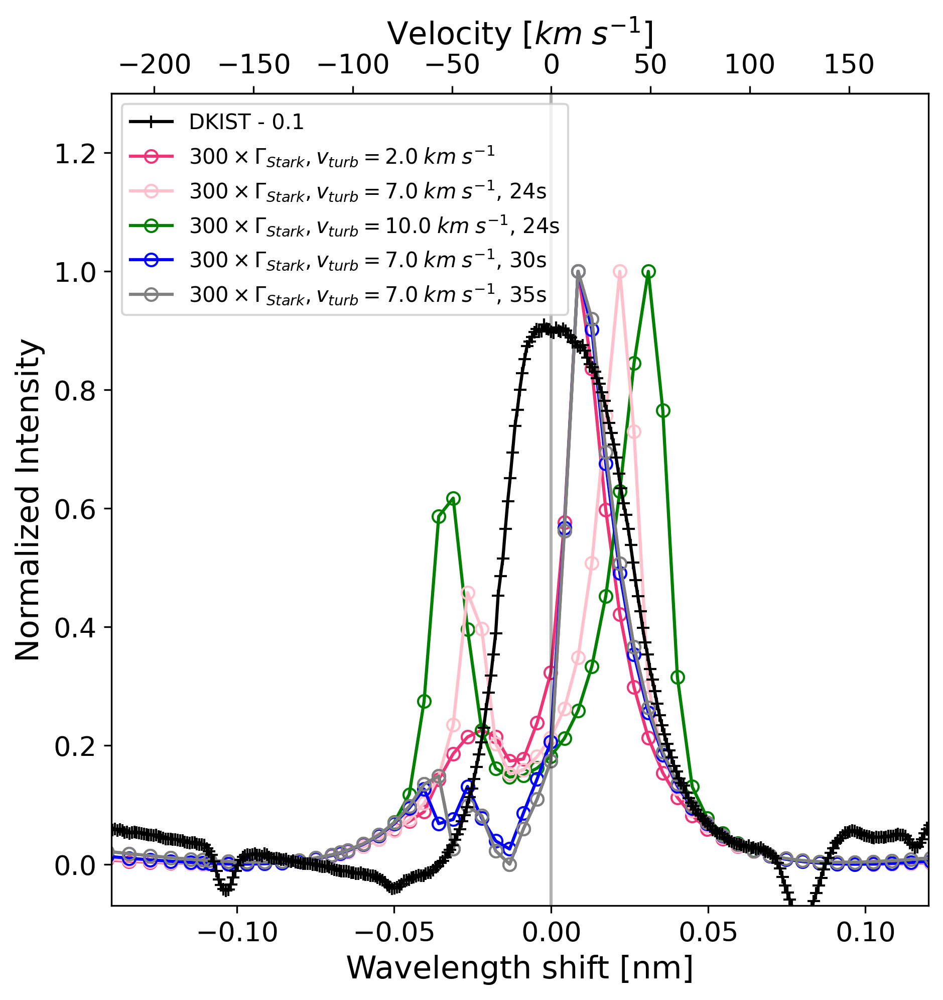

In [62]:
fig,ax=plt.subplots(figsize=(7,7))
#lns1 = ax.plot(rh_wl_shift10,rh_intnorm10,'-x',label=r'$1\times \Gamma_{Stark}, v_{turb}=2.0 \;km\; s^{-1}$',color='#882255')
# lns2 = ax.plot(rh_wl_shift8,rh_intnorm8,'-',label=r'$10\times g_{stark}, v_{turb}=10.0 \;km\; s^{-1}$',color='#33BBEE')
# lns3 = ax.plot(rh_wl_shift9,rh_intnorm9,'-.',label=r'$10\times g_{stark}, v_{turb}=20.0 \;km\; s^{-1}$',color='#332288')
#lns4 = ax.plot(rh_wl_shift7,rh_intnorm7,label=r'$10\times \Gamma_{Stark}, v_{turb}=2.0 \;km\; s^{-1}$',color='#EE3377')
#lns5 = ax.plot(rh_wl_shift11,rh_intnorm11,'-o',markerfacecolor='None',label=r'$100\times \Gamma_{Stark}, v_{turb}=2.0\; km\; s^{-1}$',color='#009988')
# lns8 = ax.plot(rh_wl_shift13,rh_intnorm13,'-o',markerfacecolor='None',label=r'$1000\times \Gamma_{Stark}, v_{turb}=2.0\; km\; s^{-1}$',color='#33BBEE')
lns9 = ax.plot(rh_wl_shift14,rh_intnorm14,'-o',markerfacecolor='None',label=r'$300\times \Gamma_{Stark}, v_{turb}=2.0\; km\; s^{-1}$',color='#EE3377')

lns10 = ax.plot(rh_wl_shift15,rh_intnorm15,'-o',markerfacecolor='None',label=r'$300\times \Gamma_{Stark}, v_{turb}=10.0\; km\; s^{-1}$, 24s',color='green')
lns11 = ax.plot(rh_wl_shift16,rh_intnorm16,'-o',markerfacecolor='None',label=r'$300\times \Gamma_{Stark}, v_{turb}=7.0\; km\; s^{-1}$, 24s',color='pink')
lns12 = ax.plot(rh_wl_shift17,rh_intnorm17,'-o',markerfacecolor='None',label=r'$300\times \Gamma_{Stark}, v_{turb}=7.0\; km\; s^{-1}$, 30s',color='blue')
lns13 = ax.plot(rh_wl_shift18,rh_intnorm18,'-o',markerfacecolor='None',label=r'$300\times \Gamma_{Stark}, v_{turb}=7.0\; km\; s^{-1}$, 35s',color='grey')
lns14 = ax.plot(rh_wl_shift19,rh_intnorm19,'-o',markerfacecolor='None',label=r'$300\times \Gamma_{Stark}, v_{turb}=7.0\; km\; s^{-1}$, 40s',color='grey')

# ax0 = ax.twinx()
lns6 = ax.plot(dkist_wl_shift2,dkist_intnorm,'-+',label='DKIST - 0.1',color='#000000')
lns = lns6+lns9+lns11+lns10+lns12+lns13
labs = [l.get_label() for l in lns]
ax.legend(lns, labs, ncol=1)

ax.set_xlim([-0.14,0.12])
# ax0.set_xlim([-0.06,0.06])
#ax0.set_ylim([-0.01,0.5])
ax.set_ylim([-0.07,1.3])
#ax.legend(fontsize=13)
#ax.grid()
ax.axvline(0,color='black',alpha=0.3)
ax.set_ylabel('Normalized Intensity',fontsize=15)
#ax0.set_ylabel('Normalized Intensity',fontsize=15)
ax.set_xlabel('Wavelength shift [nm]',fontsize=15)
secaxx = ax.secondary_xaxis('top', functions=(veltrans,wltrans))
secaxx.set_xlabel(r'Velocity $[km\; s^{-1}]$',fontsize=15)
ax.tick_params(axis='x', labelsize=13)
ax.tick_params(axis='y', labelsize=13)
# ax0.tick_params(axis='x', labelsize=13)
# ax0.tick_params(axis='y', labelsize=13)
secaxx.tick_params(axis='x', labelsize=13)

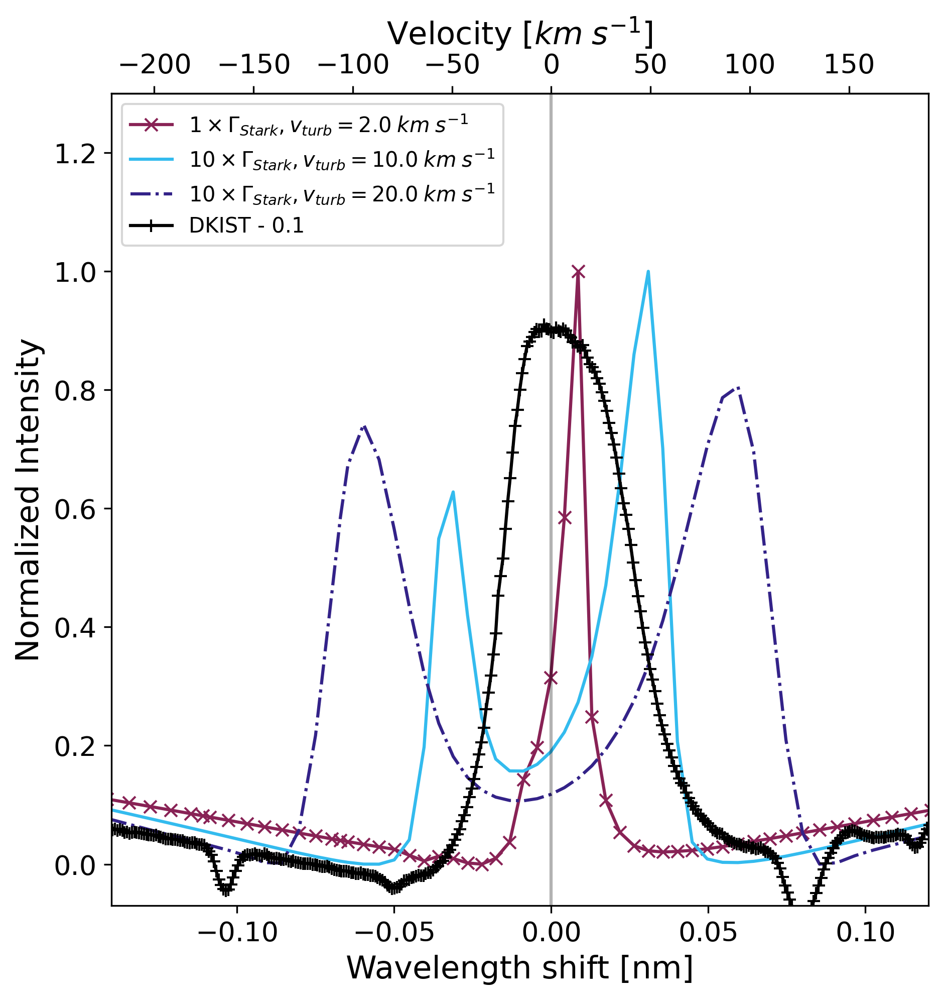

In [16]:
fig,ax=plt.subplots(figsize=(7,7))
lns1 = ax.plot(rh_wl_shift10,rh_intnorm10,'-x',label=r'$1\times \Gamma_{Stark}, v_{turb}=2.0 \;km\; s^{-1}$',color='#882255')
lns2 = ax.plot(rh_wl_shift8,rh_intnorm8,'-',label=r'$10\times \Gamma_{Stark}, v_{turb}=10.0 \;km\; s^{-1}$',color='#33BBEE')
lns3 = ax.plot(rh_wl_shift9,rh_intnorm9,'-.',label=r'$10\times \Gamma_{Stark}, v_{turb}=20.0 \;km\; s^{-1}$',color='#332288')
# lns4 = ax.plot(rh_wl_shift7,rh_intnorm7,label=r'$10\times g_{stark}, v_{turb}=2.0 \;km\; s^{-1}$',color='#EE3377')
# lns5 = ax.plot(rh_wl_shift11,rh_intnorm11,'-o',markerfacecolor='None',label=r'$100\times g_{stark}, v_{turb}=2.0\; km\; s^{-1}$',color='#009988')
# ax0 = ax.twinx()
lns6 = ax.plot(dkist_wl_shift2,dkist_intnorm,'-+',label='DKIST - 0.1',color='#000000')
lns = lns1+lns2+lns3+lns6
labs = [l.get_label() for l in lns]
ax.legend(lns, labs, ncol=1)

ax.set_xlim([-0.14,0.12])
# ax0.set_xlim([-0.06,0.06])
#ax0.set_ylim([-0.01,0.5])
ax.set_ylim([-0.07,1.3])
#ax.legend(fontsize=13)
#ax.grid()
ax.axvline(0,color='black',alpha=0.3)
ax.set_ylabel('Normalized Intensity',fontsize=15)
#ax0.set_ylabel('Normalized Intensity',fontsize=15)
ax.set_xlabel('Wavelength shift [nm]',fontsize=15)
secaxx = ax.secondary_xaxis('top', functions=(veltrans,wltrans))
secaxx.set_xlabel(r'Velocity $[km\; s^{-1}]$',fontsize=15)
ax.tick_params(axis='x', labelsize=13)
ax.tick_params(axis='y', labelsize=13)
# ax0.tick_params(axis='x', labelsize=13)
# ax0.tick_params(axis='y', labelsize=13)
secaxx.tick_params(axis='x', labelsize=13)

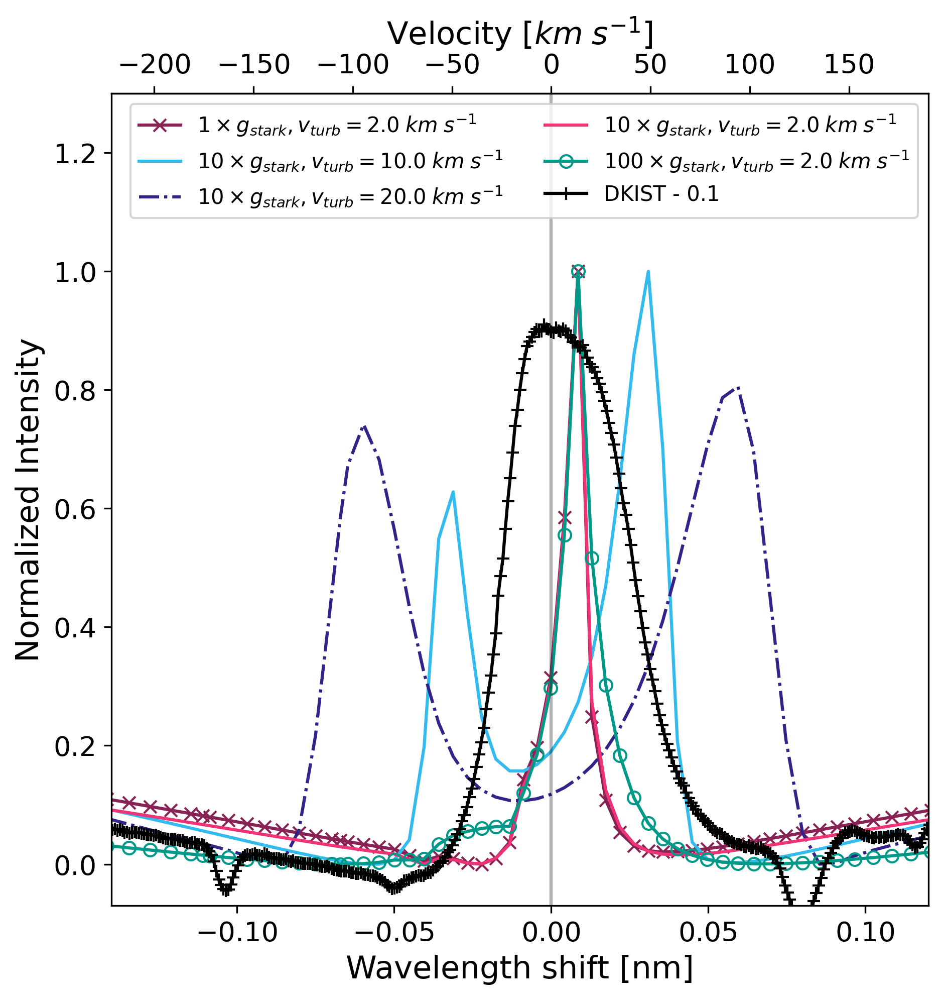

In [163]:
fig,ax=plt.subplots(figsize=(7,7))
lns1 = ax.plot(rh_wl_shift10,rh_intnorm10,'-x',label=r'$1\times g_{stark}, v_{turb}=2.0 \;km\; s^{-1}$',color='#882255')
lns2 = ax.plot(rh_wl_shift8,rh_intnorm8,'-',label=r'$10\times g_{stark}, v_{turb}=10.0 \;km\; s^{-1}$',color='#33BBEE')
lns3 = ax.plot(rh_wl_shift9,rh_intnorm9,'-.',label=r'$10\times g_{stark}, v_{turb}=20.0 \;km\; s^{-1}$',color='#332288')
lns4 = ax.plot(rh_wl_shift7,rh_intnorm7,label=r'$10\times g_{stark}, v_{turb}=2.0 \;km\; s^{-1}$',color='#EE3377')
lns5 = ax.plot(rh_wl_shift11,rh_intnorm11,'-o',markerfacecolor='None',label=r'$100\times g_{stark}, v_{turb}=2.0\; km\; s^{-1}$',color='#009988')
# ax0 = ax.twinx()
lns6 = ax.plot(dkist_wl_shift2,dkist_intnorm,'-+',label='DKIST - 0.1',color='#000000')
lns = lns1+lns2+lns3+lns4+lns5+lns6
labs = [l.get_label() for l in lns]
ax.legend(lns, labs, ncol=2)

ax.set_xlim([-0.14,0.12])
# ax0.set_xlim([-0.06,0.06])
#ax0.set_ylim([-0.01,0.5])
ax.set_ylim([-0.07,1.3])
#ax.legend(fontsize=13)
#ax.grid()
ax.axvline(0,color='black',alpha=0.3)
ax.set_ylabel('Normalized Intensity',fontsize=15)
#ax0.set_ylabel('Normalized Intensity',fontsize=15)
ax.set_xlabel('Wavelength shift [nm]',fontsize=15)
secaxx = ax.secondary_xaxis('top', functions=(veltrans,wltrans))
secaxx.set_xlabel(r'Velocity $[km\; s^{-1}]$',fontsize=15)
ax.tick_params(axis='x', labelsize=13)
ax.tick_params(axis='y', labelsize=13)
# ax0.tick_params(axis='x', labelsize=13)
# ax0.tick_params(axis='y', labelsize=13)
secaxx.tick_params(axis='x', labelsize=13)

ValueError: x and y must have same first dimension, but have shapes (994,) and (156,)

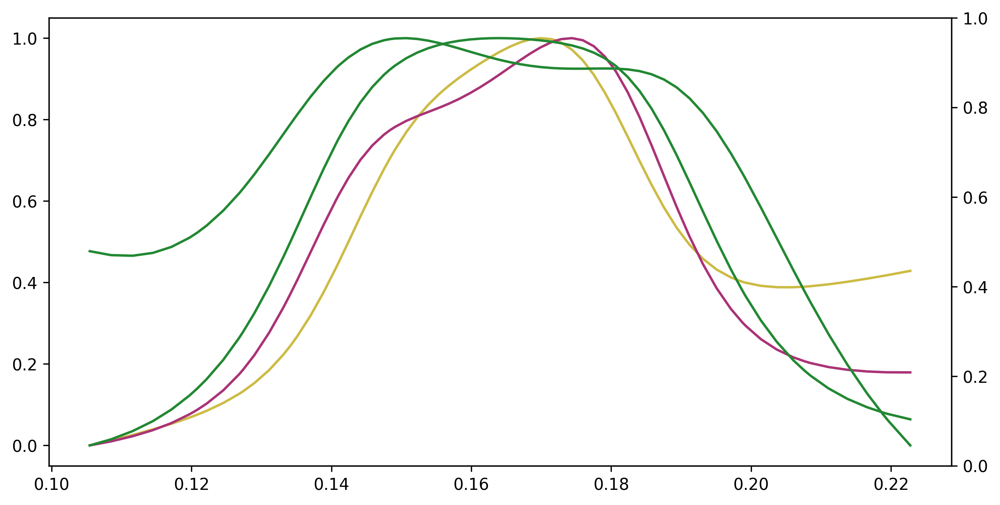

In [84]:
fig,ax=plt.subplots(figsize=(10,5))


lns1 = ax.plot(rh_wl_shift5,rh_intnorm5,label='10xgstark, 3e10, del3',color='#CCBB44')
lns2 = ax.plot(rh_wl_shift6,rh_intnorm6,label='10xgstark, 1e11, del3',color='#AA3377')
lns3 = ax.plot(rh_wl_shift3,rh_intnorm3,label='10xgstark, 3e11, del3',color='#228833')
lns4 = ax.plot(rh_wl_shift4,rh_intnorm4,label='10xgstark, 1e12, del3',color='#228833')
ax0 = ax.twinx()
lns5 = ax0.plot(dkist_wl_shift,dkist_intnorm,label='19 August 2022, 20:42:07',color='#4477AA')
lns = lns1+lns2+lns3+lns4+lns5
labs = [l.get_label() for l in lns]
ax.legend(lns, labs, loc=0)

ax.set_xlim([-0.3,0.3])
ax0.set_ylim([0.05,1.1])
#ax.legend(fontsize=13)
ax.grid()
ax.set_ylabel('Normalized Intensity',fontsize=15)
ax.set_xlabel('Wavelength shift [nm]',fontsize=15)
secaxx = ax.secondary_xaxis('top', functions=(veltrans,wltrans))
secaxx.set_xlabel(r'Velocity $[km\; s^{-1}]$',fontsize=15)
ax.tick_params(axis='x', labelsize=13)
ax.tick_params(axis='y', labelsize=13)
secaxx.tick_params(axis='x', labelsize=13)


NameError: name 'rh_wl_shift' is not defined

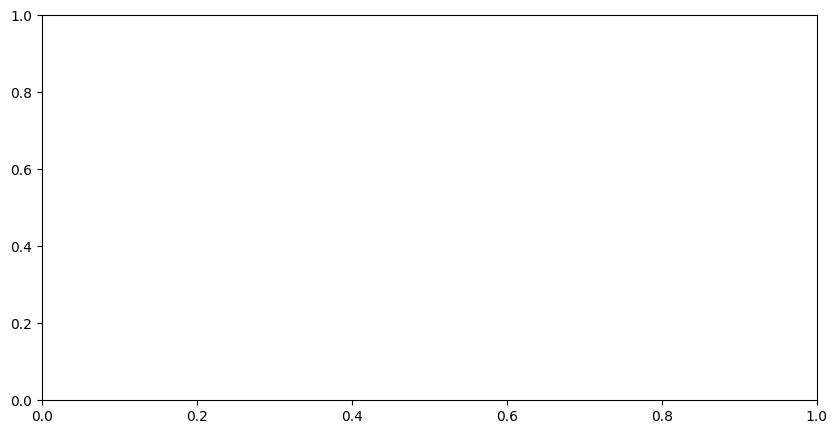

In [26]:
# with ray 2
fig,ax=plt.subplots(figsize=(10,5))
ax.plot(rh_wl_shift,rh_intnorm,label='Model 84, 17s',color='#AA3377')
ax.plot(dkist_wl_shift,dkist_intnorm,label='19 August 2022, 20:42:07',color='#4477AA')
ax.set_xlim([-0.3,0.3])
ax.set_ylim([-0.1,0.3])
ax.legend(fontsize=13)
ax.grid()
ax.set_ylabel('Normalized Intensity',fontsize=15)
ax.set_xlabel('Wavelength shift [nm]',fontsize=15)
secaxx = ax.secondary_xaxis('top', functions=(veltrans,wltrans))
secaxx.set_xlabel(r'Velocity $[km\; s^{-1}]$',fontsize=15)
ax.tick_params(axis='x', labelsize=13)
ax.tick_params(axis='y', labelsize=13)
secaxx.tick_params(axis='x', labelsize=13)
ax.set_title('DKIST/ViSP, RH from F-CHROMA Model 19 at 21s',fontsize=20)

Text(0.5, 1.0, 'DKIST/ViSP, RH from F-CHROMA Model 19 at 21s')

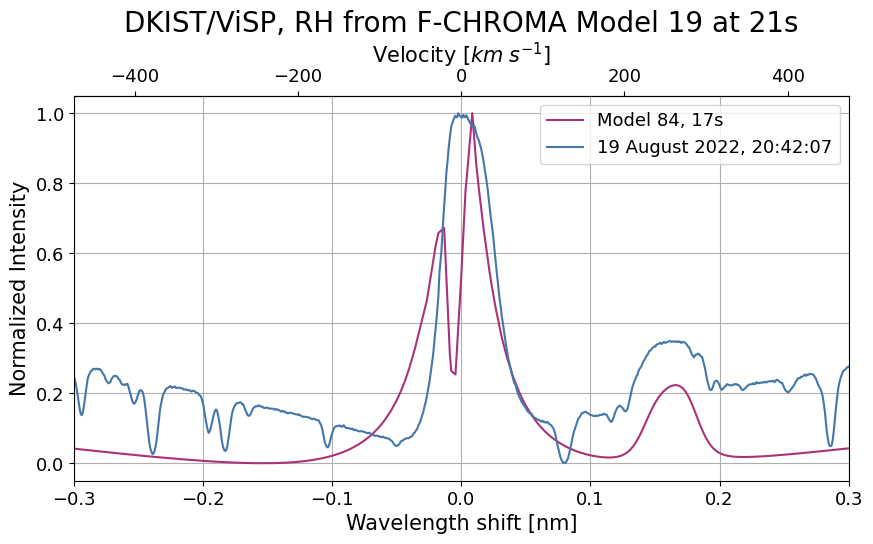

In [21]:
# with ray 4
fig,ax=plt.subplots(figsize=(10,5))
ax.plot(rh_wl_shift,rh_intnorm,label='Model 84, 17s',color='#AA3377')
ax.plot(dkist_wl_shift,dkist_intnorm,label='19 August 2022, 20:42:07',color='#4477AA')
ax.set_xlim([-0.3,0.3])
ax.legend(fontsize=13)
ax.grid()
ax.set_ylabel('Normalized Intensity',fontsize=15)
ax.set_xlabel('Wavelength shift [nm]',fontsize=15)
secaxx = ax.secondary_xaxis('top', functions=(veltrans,wltrans))
secaxx.set_xlabel(r'Velocity $[km\; s^{-1}]$',fontsize=15)
ax.tick_params(axis='x', labelsize=13)
ax.tick_params(axis='y', labelsize=13)
secaxx.tick_params(axis='x', labelsize=13)
ax.set_title('DKIST/ViSP, RH from F-CHROMA Model 19 at 21s',fontsize=20)

In [24]:
selwl

array([396.78712599, 396.78789294, 396.78865989, 396.78942685,
       396.7901938 , 396.79096076, 396.79172771, 396.79249467,
       396.79326162, 396.79402858, 396.79479553, 396.79556248,
       396.79632944, 396.79709639, 396.79786335, 396.7986303 ,
       396.79939726, 396.80016421, 396.80093116, 396.80169812,
       396.80246507, 396.80323203, 396.80399898, 396.80476594,
       396.80553289, 396.80629985, 396.8070668 , 396.80783375,
       396.80860071, 396.80936766, 396.81013462, 396.81090157,
       396.81166853, 396.81243548, 396.81320243, 396.81396939,
       396.81473634, 396.8155033 , 396.81627025, 396.81703721,
       396.81780416, 396.81857111, 396.81933807, 396.82010502,
       396.82087198, 396.82163893, 396.82240589, 396.82317284,
       396.8239398 , 396.82470675, 396.8254737 , 396.82624066,
       396.82700761, 396.82777457, 396.82854152, 396.82930848,
       396.83007543, 396.83084238, 396.83160934, 396.83237629,
       396.83314325, 396.8339102 , 396.83467716, 396.83

In [22]:
#now plot with double-gaussian fitting
filename_fit = '/Users/coletamburri/Desktop/fits2g.npz'
fit2g_file = np.load(filename_fit)
fit2g=fit2g_file['fits_2g']

In [23]:
caII_low = 480
caII_high = 650
selwl = dkist_wl[caII_low:caII_high]
selwlshift=selwl-lamb0
gauss2fity = double_gaussian(selwl,fit2g[0],fit2g[1],fit2g[2],\
                             fit2g[3],fit2g[4],fit2g[5])

comp1fity = gaussian(selwl,fit2g[0],fit2g[1],fit2g[2])
comp2fity = gaussian(selwl,fit2g[3],fit2g[4],fit2g[5])

gauss2fitynorm = normalize(gauss2fity)
comp1fitynorm = (comp1fity - min(gauss2fity))/(max(gauss2fity)-min(gauss2fity))
comp2fitynorm = (comp2fity - min(gauss2fity))/(max(gauss2fity)-min(gauss2fity))


Text(0.5, 1.0, 'DKIST/ViSP, RH from F-CHROMA Model 19 at 21s')

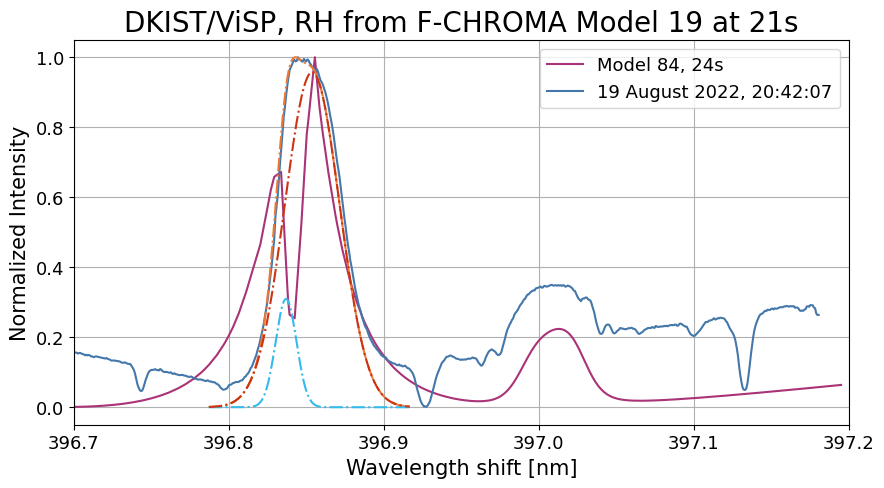

In [24]:
# with ray 4
fig,ax=plt.subplots(figsize=(10,5))
ax.plot(rh_wl,rh_intnorm,label='Model 84, 24s',color='#AA3377')
ax.plot(dkist_wl,dkist_intnorm,label='19 August 2022, 20:42:07',color='#4477AA')
ax.set_xlim([396.7,397.2])
ax.legend(fontsize=13)
ax.grid()
ax.set_ylabel('Normalized Intensity',fontsize=15)
ax.set_xlabel('Wavelength shift [nm]',fontsize=15)
#secaxx = ax.secondary_xaxis('top', functions=(veltrans,wltrans))
#secaxx.set_xlabel(r'Velocity $[km\; s^{-1}]$',fontsize=15)
ax.tick_params(axis='x', labelsize=13)
ax.tick_params(axis='y', labelsize=13)
ax.plot(selwl,gauss2fitynorm,'-.',color='#EE7733',label='Model')
ax.plot(selwl,comp1fitynorm,'-.',color='#33BBEE',label='Component 1')
ax.plot(selwl,comp2fitynorm,'-.',color='#CC3311',label='Component 2')

#secaxx.tick_params(axis='x', labelsize=13)
ax.set_title('DKIST/ViSP, RH from F-CHROMA Model 19 at 21s',fontsize=20)

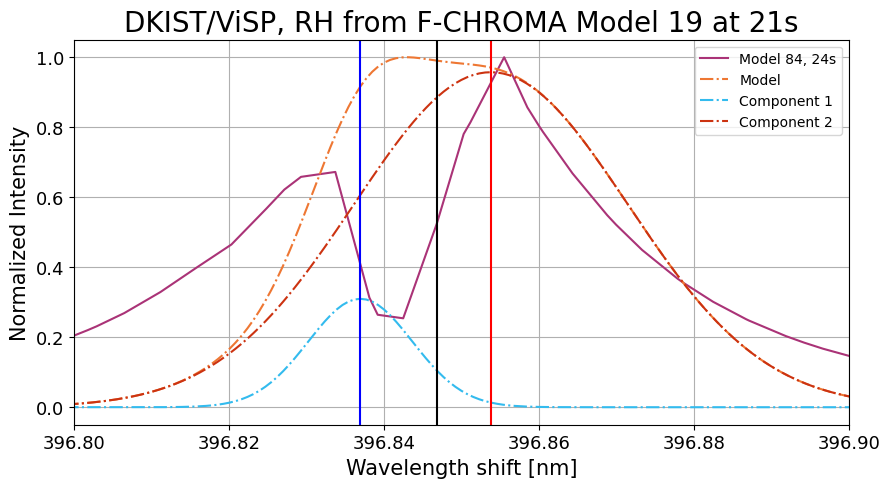

In [25]:
fig,ax=plt.subplots(figsize=(10,5))
ax.plot(rh_wl,rh_intnorm,label='Model 84, 24s',color='#AA3377')
#ax.plot(dkist_wl,dkist_intnorm,label='19 August 2022, 20:42:07',color='#4477AA')
ax.set_xlim([396.8,396.9])
ax.legend(fontsize=13)
ax.grid()
ax.set_ylabel('Normalized Intensity',fontsize=15)
ax.set_xlabel('Wavelength shift [nm]',fontsize=15)
#secaxx = ax.secondary_xaxis('top', functions=(veltrans,wltrans))
#secaxx.set_xlabel(r'Velocity $[km\; s^{-1}]$',fontsize=15)
ax.tick_params(axis='x', labelsize=13)
ax.tick_params(axis='y', labelsize=13)
ax.plot(selwl,gauss2fitynorm,'-.',color='#EE7733',label='Model')
ax.plot(selwl,comp1fitynorm,'-.',color='#33BBEE',label='Component 1')
ax.plot(selwl,comp2fitynorm,'-.',color='#CC3311',label='Component 2')
max_value1 = np.argmax(comp1fitynorm)
max_value2 = np.argmax(comp2fitynorm)
ax.axvline(selwl[max_value1],color='blue')
ax.axvline(selwl[max_value2],color='red')
ax.axvline(396.8469,color='black')
#secaxx.tick_params(axis='x', labelsize=13)
ax.set_title('DKIST/ViSP, RH from F-CHROMA Model 19 at 21s',fontsize=20)
ax.legend()

In [84]:
# slight mistmatch because fit was for quiet-sun subtracted

Text(0.5, 1.0, 'DKIST/ViSP, RH from F-CHROMA Model 25 at 21s')

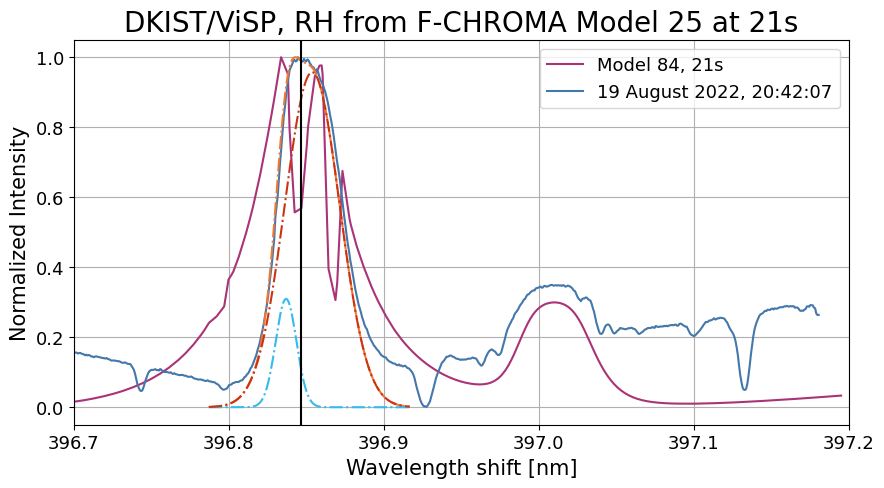

In [26]:
#round 2, with 21s simulation, model 25 (3e11 erg/cm^2)
filename_rh2 = '/Users/coletamburri/Desktop/mod25_hep.npz'
filename_dkist = '/Users/coletamburri/Desktop/DKISTobstest.npz'

rh_file2 = np.load(filename_rh2)
dkist_file = np.load(filename_dkist)

# index of kernel center for first frame (from "maxindices")
maxind = dkist_file['maxinds'][0]

caiih_inds = np.where((rh_file2['wl_rh']>396.4) & (rh_file2['wl_rh']< 397.2))
dkist_wl = dkist_file['wls']
dkist_int = dkist_file['raw_dkist'][0,:,maxind] #before background subtraction
rh_wl = rh_file2['wl_rh'][caiih_inds]
rh_int = rh_file2['int_rh'][caiih_inds]
rh_wl_shift = rh_wl-lamb0
dkist_wl_shift = dkist_wl-lamb0

dkist_intnorm = normalize(dkist_int)
rh_intnorm = normalize(rh_int)

fig,ax=plt.subplots(figsize=(10,5))
ax.plot(rh_wl,rh_intnorm,label='Model 84, 21s',color='#AA3377')
ax.plot(dkist_wl,dkist_intnorm,label='19 August 2022, 20:42:07',color='#4477AA')
ax.set_xlim([396.7,397.2])
ax.legend(fontsize=13)
ax.grid()
ax.set_ylabel('Normalized Intensity',fontsize=15)
ax.set_xlabel('Wavelength shift [nm]',fontsize=15)
#secaxx = ax.secondary_xaxis('top', functions=(veltrans,wltrans))
#secaxx.set_xlabel(r'Velocity $[km\; s^{-1}]$',fontsize=15)
ax.tick_params(axis='x', labelsize=13)
ax.tick_params(axis='y', labelsize=13)
ax.plot(selwl,gauss2fitynorm,'-.',color='#EE7733',label='Model')
ax.plot(selwl,comp1fitynorm,'-.',color='#33BBEE',label='Component 1')
ax.plot(selwl,comp2fitynorm,'-.',color='#CC3311',label='Component 2')
ax.axvline(396.8469,color='black')


#secaxx.tick_params(axis='x', labelsize=13)
ax.set_title('DKIST/ViSP, RH from F-CHROMA Model 25 at 21s',fontsize=20)

Text(0.5, 1.0, 'DKIST/ViSP, RH from F-CHROMA Model 25 at 19s')

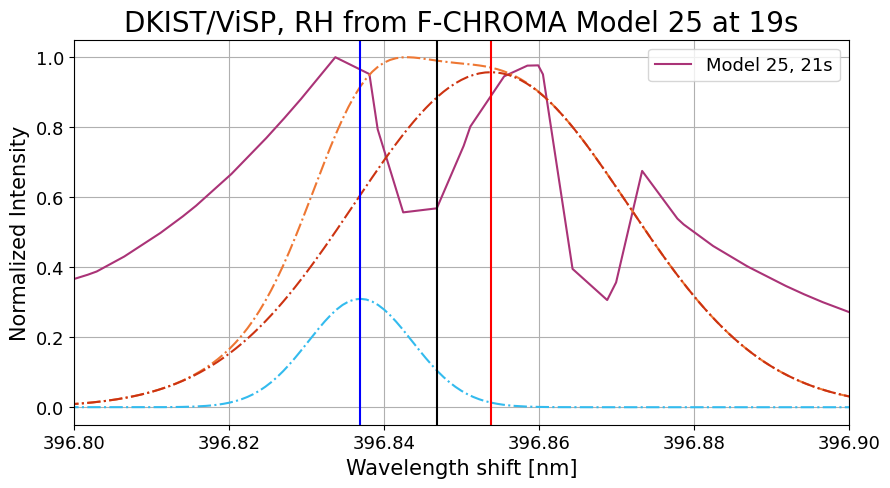

In [27]:
fig,ax=plt.subplots(figsize=(10,5))
ax.plot(rh_wl,rh_intnorm,label='Model 25, 21s',color='#AA3377')
#ax.plot(dkist_wl,dkist_intnorm,label='19 August 2022, 20:42:07',color='#4477AA')
ax.set_xlim([396.8,396.9])
ax.legend(fontsize=13)
ax.grid()
ax.set_ylabel('Normalized Intensity',fontsize=15)
ax.set_xlabel('Wavelength shift [nm]',fontsize=15)
#secaxx = ax.secondary_xaxis('top', functions=(veltrans,wltrans))
#secaxx.set_xlabel(r'Velocity $[km\; s^{-1}]$',fontsize=15)
ax.tick_params(axis='x', labelsize=13)
ax.tick_params(axis='y', labelsize=13)
ax.plot(selwl,gauss2fitynorm,'-.',color='#EE7733',label='Model')
ax.plot(selwl,comp1fitynorm,'-.',color='#33BBEE',label='Component 1')
ax.plot(selwl,comp2fitynorm,'-.',color='#CC3311',label='Component 2')
max_value1 = np.argmax(comp1fitynorm)
max_value2 = np.argmax(comp2fitynorm)
ax.axvline(selwl[max_value1],color='blue')
ax.axvline(selwl[max_value2],color='red')
ax.axvline(396.8469,color='black')

#secaxx.tick_params(axis='x', labelsize=13)
ax.set_title('DKIST/ViSP, RH from F-CHROMA Model 25 at 19s',fontsize=20)

Text(0.5, 1.0, 'DKIST/ViSP, RH from F-CHROMA Model 25 at 21s')

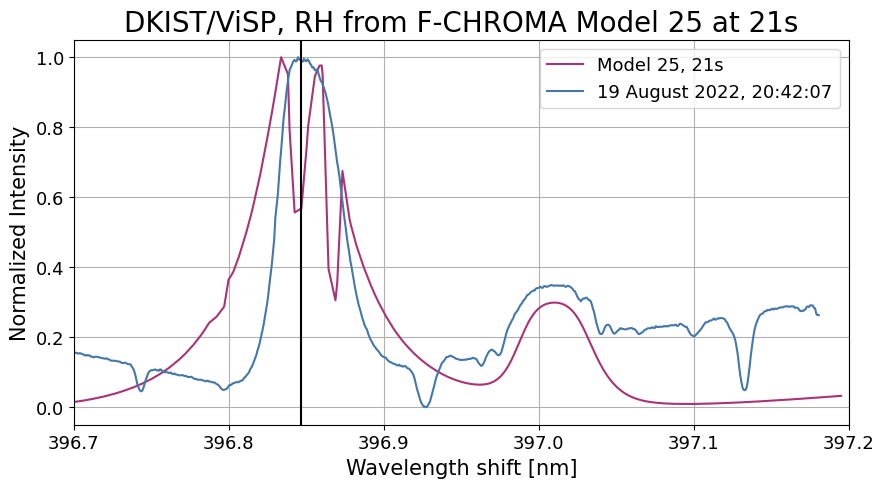

In [28]:
fig,ax=plt.subplots(figsize=(10,5))

ax.plot(rh_wl,rh_intnorm,label='Model 25, 21s',color='#AA3377')
ax.plot(dkist_wl,dkist_intnorm,label='19 August 2022, 20:42:07',color='#4477AA')
ax.set_xlim([396.7,397.2])
ax.legend(fontsize=13)
ax.grid()
ax.set_ylabel('Normalized Intensity',fontsize=15)
ax.set_xlabel('Wavelength shift [nm]',fontsize=15)
#secaxx = ax.secondary_xaxis('top', functions=(veltrans,wltrans))
#secaxx.set_xlabel(r'Velocity $[km\; s^{-1}]$',fontsize=15)
ax.tick_params(axis='x', labelsize=13)
ax.tick_params(axis='y', labelsize=13)
#secaxx.tick_params(axis='x', labelsize=13)
ax.axvline(396.8469,color='black')

ax.set_title('DKIST/ViSP, RH from F-CHROMA Model 25 at 21s',fontsize=20)

Text(0.5, 1.0, 'DKIST/ViSP, RH from F-CHROMA Model 31 at 25s')

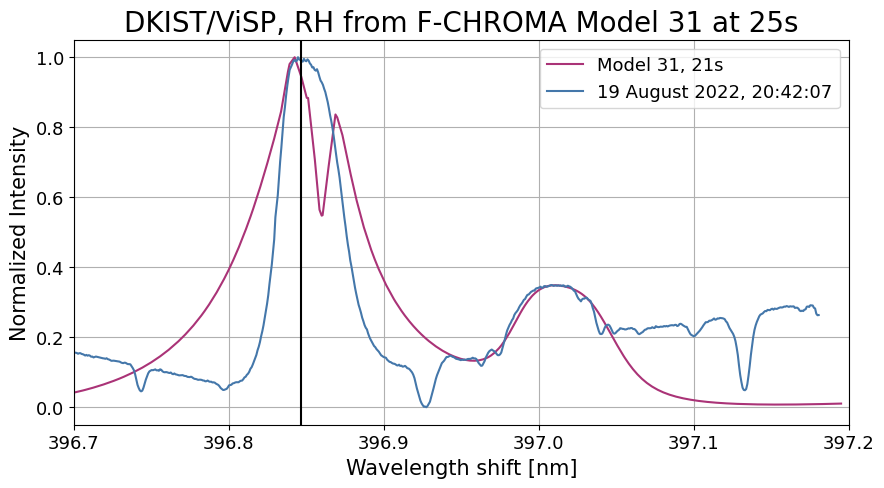

In [30]:
#round 3, model 31, 1e12
filename_rh3 = '/Users/coletamburri/Desktop/mod31_hep.npz'
filename_dkist = '/Users/coletamburri/Desktop/DKISTobstest.npz'

rh_file3 = np.load(filename_rh3)
dkist_file = np.load(filename_dkist)

# index of kernel center for first frame (from "maxindices")
maxind = dkist_file['maxinds'][0]

caiih_inds = np.where((rh_file3['wl_rh']>396.4) & (rh_file3['wl_rh']< 397.2))
dkist_wl = dkist_file['wls']
dkist_int = dkist_file['raw_dkist'][0,:,maxind] #before background subtraction
rh_wl = rh_file3['wl_rh'][caiih_inds]
rh_int = rh_file3['int_rh'][caiih_inds]
rh_wl_shift = rh_wl-lamb0
dkist_wl_shift = dkist_wl-lamb0

dkist_intnorm = normalize(dkist_int)
rh_intnorm = normalize(rh_int)

fig,ax=plt.subplots(figsize=(10,5))
ax.plot(rh_wl,rh_intnorm,label='Model 31, 21s',color='#AA3377')
ax.plot(dkist_wl,dkist_intnorm,label='19 August 2022, 20:42:07',color='#4477AA')
ax.set_xlim([396.7,397.2])
ax.legend(fontsize=13)
ax.grid()
ax.set_ylabel('Normalized Intensity',fontsize=15)
ax.set_xlabel('Wavelength shift [nm]',fontsize=15)
#secaxx = ax.secondary_xaxis('top', functions=(veltrans,wltrans))
#secaxx.set_xlabel(r'Velocity $[km\; s^{-1}]$',fontsize=15)
ax.tick_params(axis='x', labelsize=13)
ax.tick_params(axis='y', labelsize=13)
ax.axvline(396.8469,color='black')

#ax.plot(selwl,gauss2fitynorm,'-.',color='#EE7733',label='Model')
#ax.plot(selwl,comp1fitynorm,'-.',color='#33BBEE',label='Component 1')
#ax.plot(selwl,comp2fitynorm,'-.',color='#CC3311',label='Component 2')

#secaxx.tick_params(axis='x', labelsize=13)
ax.set_title('DKIST/ViSP, RH from F-CHROMA Model 31 at 25s',fontsize=20)

Text(0.5, 1.0, 'DKIST/ViSP, RH from F-CHROMA Model 79 at 21s')

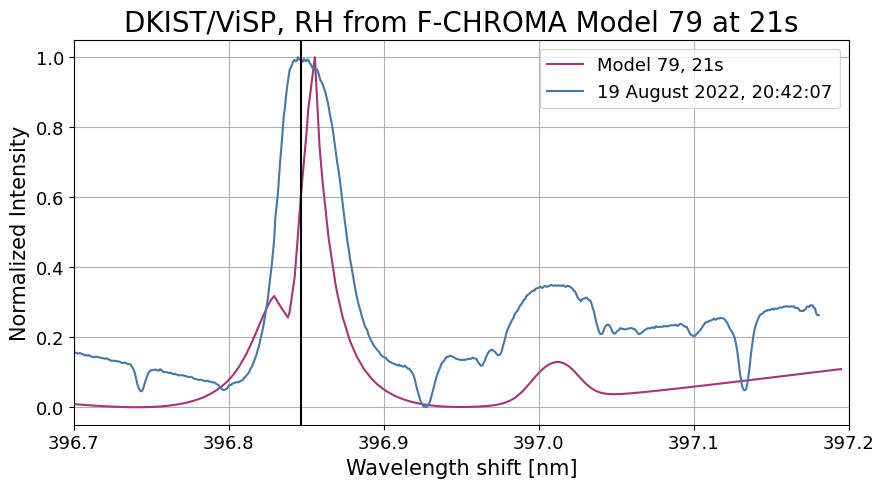

In [31]:
#round 4, with model 79, 3e10
filename_rh4 = '/Users/coletamburri/Desktop/mod79_hep.npz'
filename_dkist = '/Users/coletamburri/Desktop/DKISTobstest.npz'

rh_file4 = np.load(filename_rh4)
dkist_file = np.load(filename_dkist)

# index of kernel center for first frame (from "maxindices")
maxind = dkist_file['maxinds'][0]

caiih_inds = np.where((rh_file4['wl_rh']>396.4) & (rh_file4['wl_rh']< 397.2))
dkist_wl = dkist_file['wls']
dkist_int = dkist_file['raw_dkist'][0,:,maxind] #before background subtraction
rh_wl = rh_file4['wl_rh'][caiih_inds]
rh_int = rh_file4['int_rh'][caiih_inds]
rh_wl_shift = rh_wl-lamb0
dkist_wl_shift = dkist_wl-lamb0

dkist_intnorm = normalize(dkist_int)
rh_intnorm = normalize(rh_int)

fig,ax=plt.subplots(figsize=(10,5))
ax.plot(rh_wl,rh_intnorm,label='Model 79, 21s',color='#AA3377')
ax.plot(dkist_wl,dkist_intnorm,label='19 August 2022, 20:42:07',color='#4477AA')
ax.set_xlim([396.7,397.2])
ax.legend(fontsize=13)
ax.grid()
ax.set_ylabel('Normalized Intensity',fontsize=15)
ax.set_xlabel('Wavelength shift [nm]',fontsize=15)
#secaxx = ax.secondary_xaxis('top', functions=(veltrans,wltrans))
#secaxx.set_xlabel(r'Velocity $[km\; s^{-1}]$',fontsize=15)
ax.tick_params(axis='x', labelsize=13)
ax.tick_params(axis='y', labelsize=13)
ax.axvline(396.8469,color='black')

#ax.plot(selwl,gauss2fitynorm,'-.',color='#EE7733',label='Model')
#ax.plot(selwl,comp1fitynorm,'-.',color='#33BBEE',label='Component 1')
#ax.plot(selwl,comp2fitynorm,'-.',color='#CC3311',label='Component 2')

#secaxx.tick_params(axis='x', labelsize=13)
ax.set_title('DKIST/ViSP, RH from F-CHROMA Model 79 at 21s',fontsize=20)

Text(0.5, 1.0, 'DKIST/ViSP, RH from F-CHROMA Model 79 at 19s')

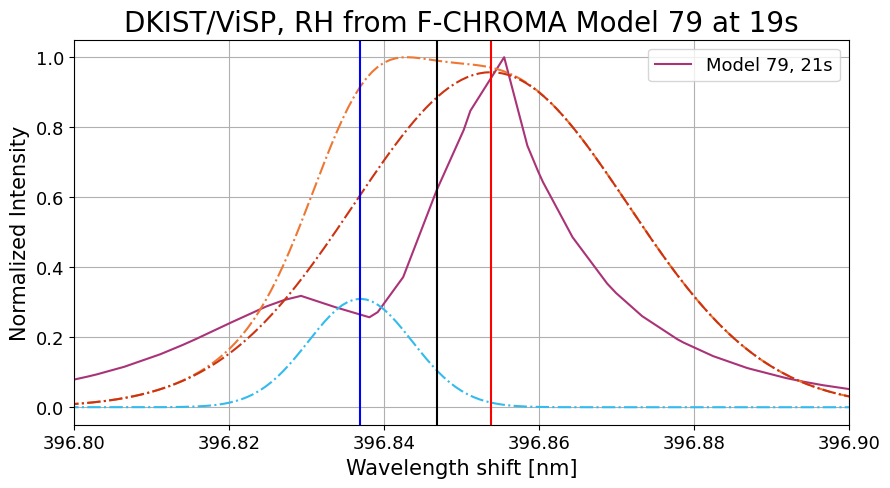

In [32]:
fig,ax=plt.subplots(figsize=(10,5))
ax.plot(rh_wl,rh_intnorm,label='Model 79, 21s',color='#AA3377')
#ax.plot(dkist_wl,dkist_intnorm,label='19 August 2022, 20:42:07',color='#4477AA')
ax.set_xlim([396.8,396.9])
ax.legend(fontsize=13)
ax.grid()
ax.set_ylabel('Normalized Intensity',fontsize=15)
ax.set_xlabel('Wavelength shift [nm]',fontsize=15)
#secaxx = ax.secondary_xaxis('top', functions=(veltrans,wltrans))
#secaxx.set_xlabel(r'Velocity $[km\; s^{-1}]$',fontsize=15)
ax.tick_params(axis='x', labelsize=13)
ax.tick_params(axis='y', labelsize=13)
ax.plot(selwl,gauss2fitynorm,'-.',color='#EE7733',label='Model')
ax.plot(selwl,comp1fitynorm,'-.',color='#33BBEE',label='Component 1')
ax.plot(selwl,comp2fitynorm,'-.',color='#CC3311',label='Component 2')
max_value1 = np.argmax(comp1fitynorm)
max_value2 = np.argmax(comp2fitynorm)
ax.axvline(selwl[max_value1],color='blue')
ax.axvline(selwl[max_value2],color='red')
ax.axvline(396.8469,color='black')

#secaxx.tick_params(axis='x', labelsize=13)
ax.set_title('DKIST/ViSP, RH from F-CHROMA Model 79 at 19s',fontsize=20)

Text(0.5, 1.0, 'DKIST/ViSP, RH from F-CHROMA Model 30 at 24s')

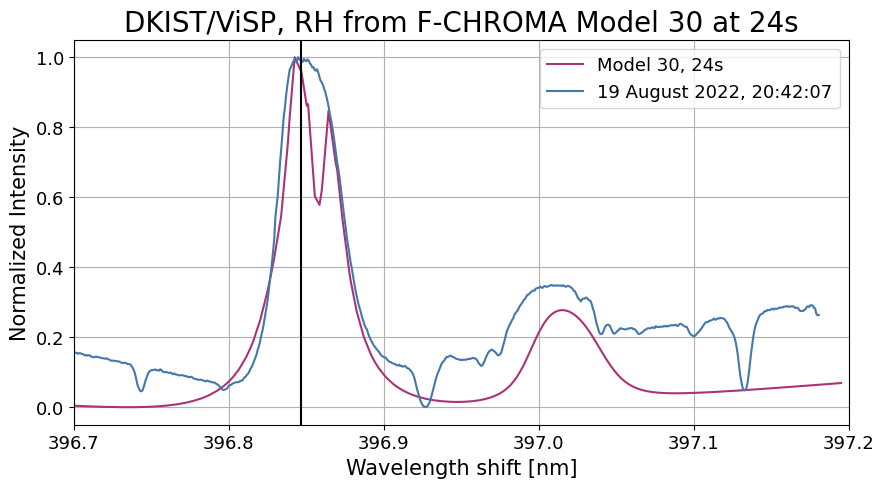

In [33]:
#round 4, with model 30, 3e11 with \delta = 8
filename_rh4 = '/Users/coletamburri/Desktop/mod30_hep.npz'
filename_dkist = '/Users/coletamburri/Desktop/DKISTobstest.npz'

rh_file4 = np.load(filename_rh4)
dkist_file = np.load(filename_dkist)

# index of kernel center for first frame (from "maxindices")
maxind = dkist_file['maxinds'][0]

caiih_inds = np.where((rh_file4['wl_rh']>396.4) & (rh_file4['wl_rh']< 397.2))
dkist_wl = dkist_file['wls']
dkist_int = dkist_file['raw_dkist'][0,:,maxind] #before background subtraction
rh_wl = rh_file4['wl_rh'][caiih_inds]
rh_int = rh_file4['int_rh'][caiih_inds]
rh_wl_shift = rh_wl-lamb0
dkist_wl_shift = dkist_wl-lamb0

dkist_intnorm = normalize(dkist_int)
rh_intnorm = normalize(rh_int)

fig,ax=plt.subplots(figsize=(10,5))
ax.plot(rh_wl,rh_intnorm,label='Model 30, 24s',color='#AA3377')
ax.plot(dkist_wl,dkist_intnorm,label='19 August 2022, 20:42:07',color='#4477AA')
ax.set_xlim([396.7,397.2])
ax.legend(fontsize=13)
ax.grid()
ax.set_ylabel('Normalized Intensity',fontsize=15)
ax.set_xlabel('Wavelength shift [nm]',fontsize=15)
#secaxx = ax.secondary_xaxis('top', functions=(veltrans,wltrans))
#secaxx.set_xlabel(r'Velocity $[km\; s^{-1}]$',fontsize=15)
ax.tick_params(axis='x', labelsize=13)
ax.tick_params(axis='y', labelsize=13)
ax.axvline(396.8469,color='black')

#ax.plot(selwl,gauss2fitynorm,'-.',color='#EE7733',label='Model')
#ax.plot(selwl,comp1fitynorm,'-.',color='#33BBEE',label='Component 1')
#ax.plot(selwl,comp2fitynorm,'-.',color='#CC3311',label='Component 2')

#secaxx.tick_params(axis='x', labelsize=13)
ax.set_title('DKIST/ViSP, RH from F-CHROMA Model 30 at 24s',fontsize=20)